<a href="https://colab.research.google.com/github/whiteTiger25/Deep-Compression-AlexNet/blob/master/stock_prediction_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
This notebook contains the stock prediction for the LSTM model which takes multiple features in it's input and tries to predict output.

# Mounts the drive
The following blocks will mount the data drive:

In [0]:
# Install a Drive FUSE wrapper.
# https://github.com/astrada/google-drive-ocamlfuse
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package libfuse2:amd64.
(Reading database ... 22280 files and directories currently installed.)
Preparing to unpack .../libfuse2_2.9.7-1ubuntu1_amd64.deb ...
Unpacking libfuse2:amd64 (2.9.7-1ubuntu1) ...
Selecting previously unselected package fuse.
Preparing to unpack .../fuse_2.9.7-1ubuntu1_amd64.deb ...
Unpacking fuse (2.9.7-1ubuntu1) ...
Selecting previously unselected package google-drive-ocamlfuse.
Preparing to unpack .../google-drive-ocamlfuse_0.7.0-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.0-0ubuntu1~ubuntu18.04.1) ...
Setting up libfuse2:amd64 (2.9.7-1ubuntu1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up fuse (2.9.7-1ubuntu1) ...
Setting up google-drive-ocamlfuse (0.7.0-0ubuntu1~ubuntu18.04.1) ...


In [0]:
# Generate auth tokens for Colab
from google.colab import auth
auth.authenticate_user()

In [0]:
# Generate creds for the Drive FUSE library.
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
Please enter the verification code: Access token retrieved correctly.


In [0]:
# Create a directory and mount Google Drive using that directory.
!mkdir -p drive
!google-drive-ocamlfuse drive

print('Files in Drive:')
!ls drive/ResearchWork
#installing xlrd for reading excel files
!pip install xlrd

Files in Drive:
 10_3m.png   16_3m.png	 22_3m.png   29.png     8_3m.png
 10.png      16.png	 22.png      2.png      8.png
 11_3m.png   17_3m.png	 23_3m.png   30.png     9_3m.png
 11.png      17.png	 2_3m.png    3_3m.png   9.png
 12_3m.png   18_3m.png	 23.png      3.png      best_model_sp_v2_3m.h5
 12.png      18.png	 24_3m.png   4_3m.png   best_model_sp_v2.h5
 13_3m.png   19_3m.png	 24.png      4.png      best_model_sp_v2.json
 1_3m.png    19.png	 25_3m.png   5_3m.png   final_result_3m.png
 13.png      1.png	 25.png      5.png      final_result.png
 14_3m.png   20_3m.png	 26_3m.png   6_3m.png   FinancialData
 14.png      20.png	 26.png      6.png      saved_models
 15_3m.png   21_3m.png	 27.png      7_3m.png  'Useful Links.odt'
 15.png      21.png	 28.png      7.png
    100% |████████████████████████████████| 112kB 6.1MB/s 


# Read the Dataset
Imports the excel sheet into the Python Dataframe

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#setting figure size
#from matplotlib.pylab import rcParams
#rcParams['figure.figsize'] = 20,10

#for normalizing data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

mapping = {'day', 'tickermap', 'delist', 'dau', 'mpr', 'freq',
           'fulltime', 'low', 'high', 'close', 'marketvalue', 
           'amount', 'totalequity', 'revenue', 'netincome', 
           'disclosureday', 'index', 'indexweight'}


df = pd.read_excel('drive/ResearchWork/FinancialData/Stocks_20180820.xlsx', sheet_name = None)

# Observe the dataset
Prints the dimensions of the fields

In [0]:
for i in mapping:
  print(i,': ',df[i].shape)
ticker = df['tickermap'].iloc[0,:]
ticker.index = range(ticker.shape[0])

low :  (958, 41)
disclosureday :  (27, 41)
tickermap :  (10, 41)
revenue :  (27, 41)
indexweight :  (39, 11)
mpr :  (957, 75)
totalequity :  (27, 41)
dau :  (958, 75)
delist :  (958, 41)
netincome :  (27, 41)
amount :  (958, 41)
high :  (958, 41)
fulltime :  (951, 75)
marketvalue :  (958, 41)
index :  (957, 1)
day :  (958, 4)
freq :  (951, 75)
close :  (958, 41)


# Selected features
close, revenue, marketvalue, netincome, high, low, amount and delist

In [0]:
selected_features = {'close', 'revenue', 'marketvalue', 'netincome', 'amount', 'high', 'low', 'delist'}
target_feature = 'close'


# Show the target variations


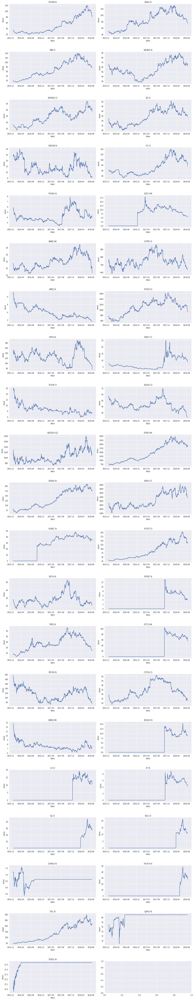

In [0]:
df_target = df[target_feature][1:]
df_target.index = pd.to_datetime(df['day']['day_all'][1:],format='%d-%m-%Y')

#print(ticker)

#plot
plt.figure()
#plt.ylabel(target_feature)
fig, axs = plt.subplots(21,2)
fig.subplots_adjust(hspace = 0.5, wspace=0.1)

fig.set_size_inches(18, 100)

axs = axs.ravel()
for i in range(ticker.shape[0]):
  axs[i].set_ylabel(target_feature)
  axs[i].set_xlabel('days')
  axs[i].set_title(ticker[i])
  axs[i].plot(df_target.iloc[:,i])
  
plt.show()

# Cleaning the data trace
There are some companies which are traded for a small duration. It's better to remove them as our objective is to predict the stock price of one year from now on. They don't add much value. The ticker of these companies are: YOKU.N, QIHU.N, DANG.N, HUYA.N, IQ.O, BILI.O, JT.N, LX.O, SOGO.N, 0772.HK and PPDF.N

In [0]:
#Companies traded for less duration
del_comp = {'YOKU.N', 'QIHU.N', 'DANG.N', 'HUYA.N', 'IQ.O', 'BILI.O', 'JT.N', 'LX.O', 'SOGO.N', '0772.HK', 'PPDF.N'}
for feature in selected_features:
  for company in del_comp:
    del df[feature][company]
  
for i in selected_features:
  print(i,': ',df[i].shape)

low :  (958, 30)
revenue :  (27, 30)
netincome :  (27, 30)
delist :  (958, 30)
amount :  (958, 30)
high :  (958, 30)
marketvalue :  (958, 30)
close :  (958, 30)


# Importing the other essential libraries

In [0]:
#importing required libraries
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.models import load_model
from keras.layers import Dense, Dropout, LSTM
from keras.layers import TimeDistributed
import math
import keras.backend as K
from operator import add
from operator import sub

Using TensorFlow backend.


# Custom Loss Function
Prioritizes the last value of target function

In [0]:
scaling_vector = np.ones(4)
#print(scaling_vector)
scaling_vector[-1] = 4
#print(scaling_vector)
def customLoss(yTrue,yPred):
  '''For now just penalizing the prediction of all features on the last time step'''
  loss_vec = K.square(yTrue - yPred)
  scaling_tensor = K.variable(scaling_vector)
  return K.mean(K.dot(scaling_tensor, K.transpose(loss_vec)))


# Trains the model

In [0]:
def train_LSTM(df_mv, target, selected_ticker, trailing_window, interval, model, evaluate = False):
  "Trains the LSTM and returns the trained model with the validation accuracy"
  #Builds the input vectors
  lookahead = interval
  print('SELECTED_TICKER', selected_ticker)
  new_df = pd.DataFrame(index=df_mv[target].index)
  for features in df_mv:
    if features != 'delist':
      new_df[features] = df_mv[features][selected_ticker]
  
  new_df = new_df.dropna()
  
  
  
  if (new_df.shape[0] == 0):
    return [model, 1, 1, 1, False]
    
  target_idx = new_df.columns.get_loc(target)
  
  features = new_df.shape[1]
 
 
  train_size = math.ceil(new_df.shape[0] * 0.75)
  valid_size = math.ceil(new_df.shape[0] * 0.15)

  train = new_df.iloc[0:train_size, :]
  print('Selected Ticker ', selected_ticker)
  valid = new_df.iloc[train_size:train_size+valid_size, target_idx]
  print('Valid size ', len(valid))
  test = new_df.iloc[train_size+valid_size:, target_idx]
  print('Test size ', len(test))
  
  print('This ===>', valid.shape)

  #this_df = this_df.reshape(len(this_df),features)

  scaler = MinMaxScaler(feature_range=(0, 1))
  scaled_data = scaler.fit_transform(new_df)

  
  x_train, y_train = [], []
  for i in range(trailing_window,len(train) - lookahead, interval):
    x_train.append(scaled_data[i-trailing_window:i:interval,:])
    y_train.append(scaled_data[i-trailing_window+interval:i+lookahead:interval,:])
  x_train, y_train = np.array(x_train), np.array(y_train)
  
  # Reshape the input to make it compatible with the LSTM network
  x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],features))
  y_train = np.reshape(y_train, (y_train.shape[0],y_train.shape[1],features))
 
  model.compile(loss= customLoss, optimizer='adam')
  #model.compile(loss= 'mean_squared_error', optimizer='adam')
  model.fit(x_train, y_train, epochs=10, verbose=2)
  print(model.summary())
  model.reset_states()
  
  rms=0
 
  
  inputs = new_df.iloc[len(this_df) - len(valid)- len(test) - trailing_window - lookahead:len(this_df)-lookahead-len(test), :]
  #inputs = inputs.reshape(-1,1)
  inputs  = scaler.transform(inputs)

  X_test = []
  Y_act = []
  for i in range(trailing_window, inputs.shape[0]):
    X_test.append(inputs[i-trailing_window:i:interval,:])
    #print('DEBUG 1===> ', len(this_df) - len(test) -len(valid) + i  - trailing_window)
    Y_act.append(scaled_data[len(this_df) - len(valid)- len(test) + i - trailing_window , target_idx])
  X_test = np.array(X_test)
  Y_act = np.array(Y_act)
  
  print('Valid X ==> ', len(X_test))
 

  X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],features))
  market_values = model.predict(X_test)
  market_values = np.reshape(market_values, (market_values.shape[0], market_values.shape[1], features))
  
  rms=np.sqrt(np.mean(np.power(market_values[:, -1, target_idx] - Y_act,2)))
  print('Ticker: ', selected_ticker,' The Root Mean Squared Error: ', rms)
  
  market_values = scaler.inverse_transform(market_values[:,-1,:])
  prediction = pd.DataFrame(market_values[:, target_idx], index=valid.index, columns=['Predicted'])
  
  #test
  
  test_inputs = new_df.iloc[len(this_df) - len(test) - trailing_window - lookahead:len(this_df)-lookahead, :]
  #inputs = inputs.reshape(-1,1)
  test_inputs  = scaler.transform(test_inputs)

  
  X_test = []
  Y_act = []
  for i in range(trailing_window, test_inputs.shape[0]):
    X_test.append(test_inputs[i-trailing_window:i:interval,:])
    #print('DEBUG 1===> ', len(this_df) - len(test) + i  - trailing_window)
    Y_act.append(scaled_data[len(this_df) - len(test) + i  - trailing_window, target_idx])
  X_test = np.array(X_test)
  Y_act = np.array(Y_act)
  
  print('Test ==> ', len(X_test))

  X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],features))
  test_market_values = model.predict(X_test)
  test_market_values = np.reshape(test_market_values, (test_market_values.shape[0], test_market_values.shape[1], features))
  
  test_rms=np.sqrt(np.mean(np.power(test_market_values[:, -1, target_idx] - Y_act,2)))
  print('Ticker: ', selected_ticker,' The Test Root Mean Squared Error: ', test_rms)
  
  test_market_values = scaler.inverse_transform(test_market_values[:,-1,:])
  test_prediction = pd.DataFrame(test_market_values[:, target_idx], index=test.index, columns=['Predicted'])
  
  fig = plt.figure()
  plt.title('Training followed by validation {}'.format(selected_ticker))
  plt.ylabel(target)
  plt.plot(train.iloc[:,target_idx], label='Training Phase')
  plt.plot(valid, label = 'Validation Ground Truth')
  plt.plot(test, label = 'Testing Ground Truth')
  plt.plot(prediction, label = 'Validation Predicted Values. RMS = %0.2f' % rms)
  plt.plot(test_prediction, label = 'Test Predicted Values. RMS = %0.2f' % test_rms)
  plt.legend()
  plt.show()
  

  return [model, rms, test_rms, fig, True]

# Gets the best model

In [0]:
def get_the_best_model(this_df, target):
  'Trains the model on 25 companies and selects the one with the best performance across all'
  
  ticker = df['tickermap'].iloc[0,:]
  selected_comp = [i for i in ticker.values]
  del_comp = {'YOKU.N', 'QIHU.N', 'DANG.N', 'HUYA.N', 'IQ.O', 'BILI.O', 'JT.N', 'LX.O', 'SOGO.N', '0772.HK', 'PPDF.N', 'JMEI.N', '0700.HK'}
  
 
  #Remove the companies with short trading periods
  for i in del_comp:
    selected_comp.remove(i)
  
  #selected_comp = {'BABA.N', 'ATHM.N'}
  trailing_window = 360
  interval = 90
  
  
  #selected_comp ={'ATHM.N', 'JMEI.N', '0700.HK', 'YRD.N' }
  # create the LSTM network
  #'''
  model = Sequential()
  model.add(LSTM(units=64, return_sequences=True, input_shape=(math.ceil(trailing_window/interval),len(this_df) - 1)))
  #model.add(Dropout(0.75))
  model.add(LSTM(units=128, input_shape=(math.ceil(trailing_window/interval),len(this_df) - 1), return_sequences=True))
  model.add(TimeDistributed(Dense(len(this_df) - 1)))
  #'''
  #model = load_model('drive/ResearchWork/best_model_sp_v2.h5', custom_objects={'customLoss': customLoss})
  state = 0
  iter_count = 0
  prev_rms = 1
  stopping_criteria = 0.3
  acc_fig = {}
  final_mean = 1
  
  while state < 50:
    print("Iter Count======================>", iter_count)
    acc_rms = {}
    max_rms = 0
    accuracy = 0
    mean_rms = 0
    
    nan_company = []
    for i in selected_comp:
      [model, rms, test_rms, fig, status] = train_LSTM(this_df, target, i, trailing_window, interval, model)
      print('nan_company =====>', nan_company)
      if status == False:
        nan_company.append(i)
        continue
      acc_rms[i] = test_rms
      mean_rms += rms
      acc_fig[i] = fig
      accuracy += test_rms
      print('Validation RMS acheived ===> ', rms)
      print('Test RMS acheived ===> ', test_rms)
      if max_rms < rms:
        max_rms = rms
        
    for company in nan_company:
      selected_comp.remove(company)
    
    mean_rms /= len(selected_comp) 
    print("The train-test accuracy: ", accuracy/len(selected_comp))
    figure = plt.figure(figsize=(30,10))
    plt.title('The final mean RMS(test) = %0.2f' % mean_rms)
    plt.ylabel('RMS')
    plt.bar(range(len(acc_rms)), list(acc_rms.values()), align='center')
    plt.xticks(range(len(acc_rms)), list(acc_rms.keys()))
    plt.show()
    if(max_rms < prev_rms):
      state = 0
      prev_rms= max_rms
      final_mean = mean_rms
      # serialize weights to HDF5
      model.save("drive/ResearchWork/best_model_sp_v2_3m.h5")
      figure.savefig('drive/ResearchWork/final_result_3m.png')
      idx = 1
      for fig in acc_fig:
        acc_fig[fig].savefig('drive/ResearchWork/{}_3m.png'.format(idx))
        idx += 1
      print("Saved model to disk")
    else:
      state += 1
      
    iter_count += 1
   
        
  return final_mean

# Upsample the features

In [0]:
def smooth(this_df, is_valid):
  interval = 30
  new_df = this_df.copy()
  for company in this_df:
    #if company == 'JMEI.N':
    #  print('HERE ===> ', this_df[company])
    for entry in range(new_df.shape[0]):
      if this_df[company][entry] == 0.0 and is_valid[company][entry+1] == 1.0:
        new_df[company][entry] = np.NaN
        #print('Filled', entry)
      elif is_valid[company][entry+1] == 0.0:
        new_df[company][entry] = 0.0
    new_df[company] = new_df[company].fillna(method='ffill')
    new_df[company] = new_df[company].fillna(method='bfill')
    
  
  tsm_df = new_df.copy() # Averaged over trailing single month
  for company in new_df:
    for entry in range(interval,new_df.shape[0]):
      tsm_df[company][entry] = np.mean(new_df[company][entry-interval:entry])
      #print("computed", tsm_df[company][entry], 'original', new_df[company][entry])
    #if company == 'JMEI.N':
    #  print('HERE ===> ', tsm_df[company])  
  return tsm_df

  

new_df = {}
all_dates = pd.to_datetime(df['day']['day_all'][1:],format='%d-%m-%Y')
quarter_dates = pd.to_datetime(df['day']['day_quarter'][1:].dropna(),format='%d-%m-%Y')

for i in selected_features:  
  new_df[i] = pd.DataFrame(index=all_dates)
  this_df = df[i][1:]
  if(this_df.shape[0] == len(df['day']['day_all'][1:])):
    this_df.index = pd.to_datetime(df['day']['day_all'][1:],format='%d-%m-%Y')
    new_df[i] = new_df[i].join(this_df)
    if  i != 'delist':
      new_df[i] = smooth(new_df[i], df['delist'])
  elif(this_df.shape[0] == len(quarter_dates)):
    this_df.index =quarter_dates
    inter_df = this_df.resample('D').fillna(method = 'ffill')
    new_df[i] = new_df[i].join(inter_df)
    new_df[i] = smooth(new_df[i], df['delist'])
  
    
for col in new_df:
  print(new_df[col].shape)


    


(957, 30)
(957, 30)
(957, 30)
(957, 30)
(957, 30)
(957, 30)
(957, 30)
(957, 30)


HERE ===>  Series([], Name: JMEI.N, dtype: float64)


Iter Count======================> 0
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 0.4976
Epoch 2/10
 - 0s - loss: 0.4799
Epoch 3/10
 - 0s - loss: 0.4595
Epoch 4/10
 - 0s - loss: 0.4376
Epoch 5/10
 - 0s - loss: 0.4143
Epoch 6/10
 - 0s - loss: 0.3897
Epoch 7/10
 - 0s - loss: 0.3637
Epoch 8/10
 - 0s - loss: 0.3365
Epoch 9/10
 - 0s - loss: 0.3081
Epoch 10/10
 - 0s - loss: 0.2791
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
_______________

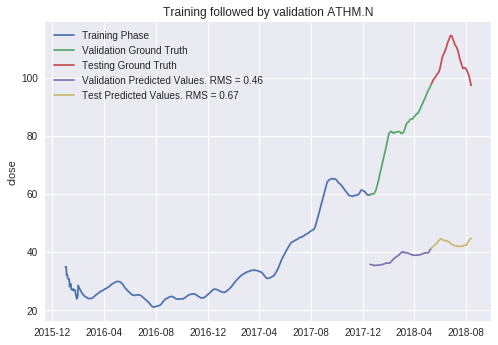

nan_company =====> []
Validation RMS acheived ===>  0.46241857844605555
Test RMS acheived ===>  0.6744391454433458
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 1s - loss: 0.8296
Epoch 2/10
 - 0s - loss: 0.7678
Epoch 3/10
 - 0s - loss: 0.6974
Epoch 4/10
 - 0s - loss: 0.6257
Epoch 5/10
 - 0s - loss: 0.5570
Epoch 6/10
 - 0s - loss: 0.4957
Epoch 7/10
 - 0s - loss: 0.4462
Epoch 8/10
 - 0s - loss: 0.4129
Epoch 9/10
 - 0s - loss: 0.3972
Epoch 10/10
 - 0s - loss: 0.3952
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

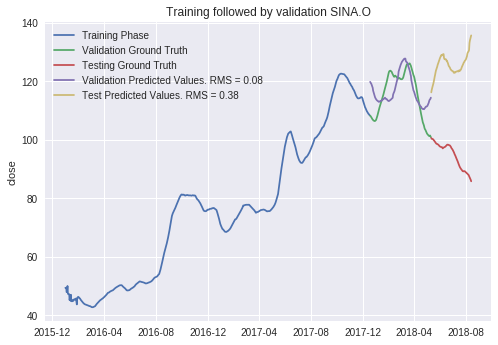

nan_company =====> []
Validation RMS acheived ===>  0.07590617529431619
Test RMS acheived ===>  0.38023903289932676
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 1s - loss: 0.0714
Epoch 2/10
 - 0s - loss: 0.0520
Epoch 3/10
 - 0s - loss: 0.0470
Epoch 4/10
 - 0s - loss: 0.0496
Epoch 5/10
 - 0s - loss: 0.0516
Epoch 6/10
 - 0s - loss: 0.0506
Epoch 7/10
 - 0s - loss: 0.0474
Epoch 8/10
 - 0s - loss: 0.0442
Epoch 9/10
 - 0s - loss: 0.0427
Epoch 10/10
 - 0s - loss: 0.0432
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

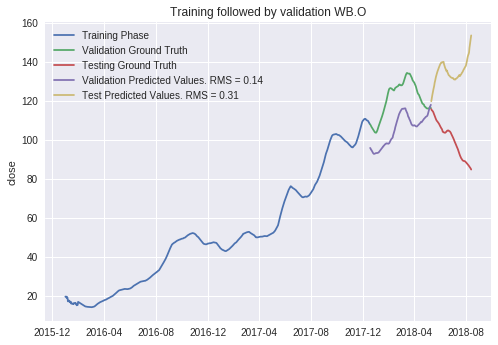

nan_company =====> []
Validation RMS acheived ===>  0.14303483124848687
Test RMS acheived ===>  0.31215643031098533
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 2s - loss: 1.1437
Epoch 2/10
 - 0s - loss: 0.8797
Epoch 3/10
 - 0s - loss: 0.6585
Epoch 4/10
 - 0s - loss: 0.4984
Epoch 5/10
 - 0s - loss: 0.3905
Epoch 6/10
 - 0s - loss: 0.3214
Epoch 7/10
 - 0s - loss: 0.2791
Epoch 8/10
 - 0s - loss: 0.2545
Epoch 9/10
 - 0s - loss: 0.2413
Epoch 10/10
 - 0s - loss: 0.2348
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

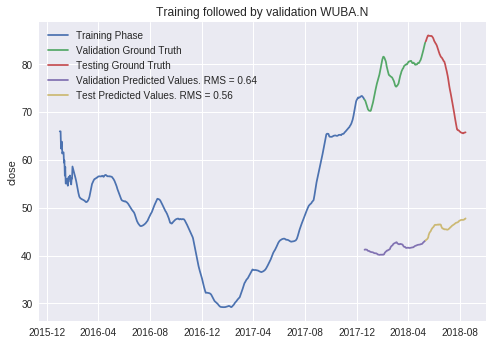

nan_company =====> []
Validation RMS acheived ===>  0.6405722733060439
Test RMS acheived ===>  0.5622912446722985
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 2s - loss: 0.7929
Epoch 2/10
 - 0s - loss: 0.7313
Epoch 3/10
 - 0s - loss: 0.6579
Epoch 4/10
 - 0s - loss: 0.5781
Epoch 5/10
 - 0s - loss: 0.4946
Epoch 6/10
 - 0s - loss: 0.4100
Epoch 7/10
 - 0s - loss: 0.3275
Epoch 8/10
 - 0s - loss: 0.2510
Epoch 9/10
 - 0s - loss: 0.1862
Epoch 10/10
 - 0s - loss: 0.1399
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

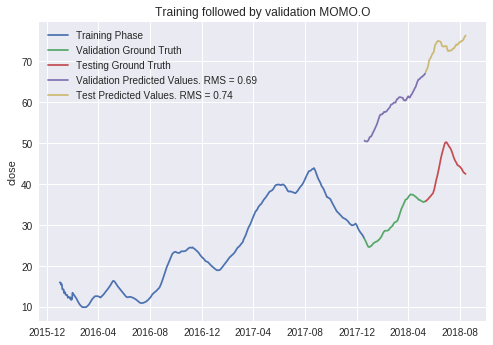

nan_company =====> []
Validation RMS acheived ===>  0.6925224813005704
Test RMS acheived ===>  0.7367946485002139
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 2s - loss: 0.7737
Epoch 2/10
 - 0s - loss: 0.5910
Epoch 3/10
 - 0s - loss: 0.4534
Epoch 4/10
 - 0s - loss: 0.3699
Epoch 5/10
 - 0s - loss: 0.3275
Epoch 6/10
 - 0s - loss: 0.3102
Epoch 7/10
 - 0s - loss: 0.3053
Epoch 8/10
 - 0s - loss: 0.3047
Epoch 9/10
 - 0s - loss: 0.3036
Epoch 10/10
 - 0s - loss: 0.2998
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params:

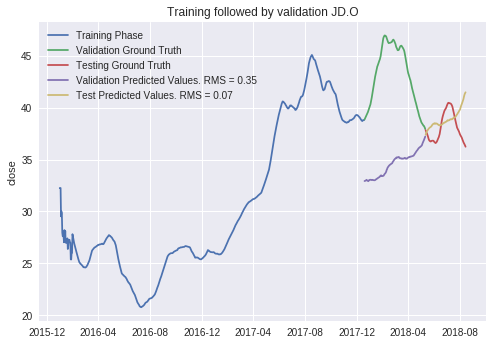

nan_company =====> []
Validation RMS acheived ===>  0.35289651263146804
Test RMS acheived ===>  0.07337388835460923
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 0.6278
Epoch 2/10
 - 0s - loss: 0.5356
Epoch 3/10
 - 0s - loss: 0.4673
Epoch 4/10
 - 0s - loss: 0.4246
Epoch 5/10
 - 0s - loss: 0.3995
Epoch 6/10
 - 0s - loss: 0.3844
Epoch 7/10
 - 0s - loss: 0.3740
Epoch 8/10
 - 0s - loss: 0.3653
Epoch 9/10
 - 0s - loss: 0.3568
Epoch 10/10
 - 0s - loss: 0.3480
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

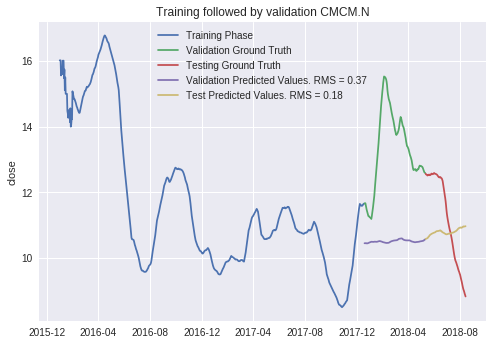

nan_company =====> []
Validation RMS acheived ===>  0.3684554771682672
Test RMS acheived ===>  0.17781964374612563
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 0.3329
Epoch 2/10
 - 0s - loss: 0.3015
Epoch 3/10
 - 0s - loss: 0.2669
Epoch 4/10
 - 0s - loss: 0.2322
Epoch 5/10
 - 0s - loss: 0.1989
Epoch 6/10
 - 0s - loss: 0.1682
Epoch 7/10
 - 0s - loss: 0.1412
Epoch 8/10
 - 0s - loss: 0.1186
Epoch 9/10
 - 0s - loss: 0.1014
Epoch 10/10
 - 0s - loss: 0.0898
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

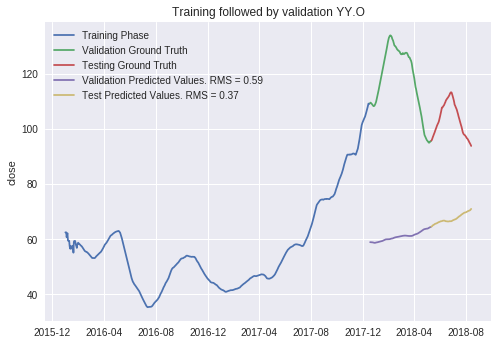

nan_company =====> []
Validation RMS acheived ===>  0.591522865790579
Test RMS acheived ===>  0.37471987089547576
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 0.4054
Epoch 2/10
 - 0s - loss: 0.3393
Epoch 3/10
 - 0s - loss: 0.2979
Epoch 4/10
 - 0s - loss: 0.2781
Epoch 5/10
 - 0s - loss: 0.2707
Epoch 6/10
 - 0s - loss: 0.2683
Epoch 7/10
 - 0s - loss: 0.2670
Epoch 8/10
 - 0s - loss: 0.2649
Epoch 9/10
 - 0s - loss: 0.2621
Epoch 10/10
 - 0s - loss: 0.2592
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

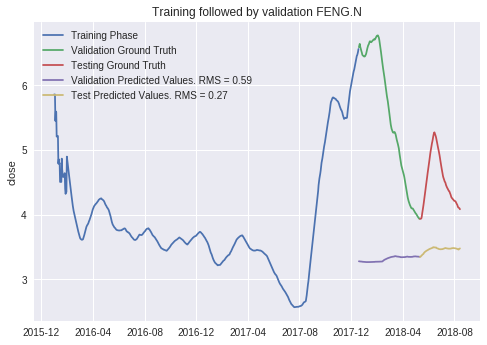

nan_company =====> []
Validation RMS acheived ===>  0.5853252144582887
Test RMS acheived ===>  0.27209611182628257
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 1.1492
Epoch 2/10
 - 0s - loss: 1.1142
Epoch 3/10
 - 0s - loss: 1.0740
Epoch 4/10
 - 0s - loss: 1.0314
Epoch 5/10
 - 0s - loss: 0.9874
Epoch 6/10
 - 0s - loss: 0.9421
Epoch 7/10
 - 0s - loss: 0.8959
Epoch 8/10
 - 0s - loss: 0.8488
Epoch 9/10
 - 0s - loss: 0.8010
Epoch 10/10
 - 0s - loss: 0.7527
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

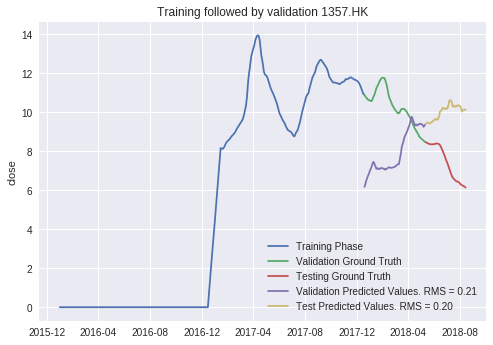

nan_company =====> []
Validation RMS acheived ===>  0.21475622251957924
Test RMS acheived ===>  0.20225835334853576
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 3s - loss: 0.3914
Epoch 2/10
 - 0s - loss: 0.3376
Epoch 3/10
 - 0s - loss: 0.3006
Epoch 4/10
 - 0s - loss: 0.2806
Epoch 5/10
 - 0s - loss: 0.2706
Epoch 6/10
 - 0s - loss: 0.2643
Epoch 7/10
 - 0s - loss: 0.2584
Epoch 8/10
 - 0s - loss: 0.2520
Epoch 9/10
 - 0s - loss: 0.2454
Epoch 10/10
 - 0s - loss: 0.2398
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

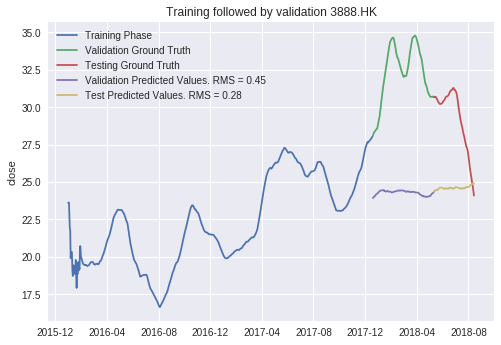

nan_company =====> []
Validation RMS acheived ===>  0.4532465974459557
Test RMS acheived ===>  0.2848308767642982
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 4s - loss: 0.5071
Epoch 2/10
 - 0s - loss: 0.4540
Epoch 3/10
 - 0s - loss: 0.4043
Epoch 4/10
 - 0s - loss: 0.3672
Epoch 5/10
 - 0s - loss: 0.3451
Epoch 6/10
 - 0s - loss: 0.3335
Epoch 7/10
 - 0s - loss: 0.3246
Epoch 8/10
 - 0s - loss: 0.3140
Epoch 9/10
 - 0s - loss: 0.3024
Epoch 10/10
 - 0s - loss: 0.2928
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

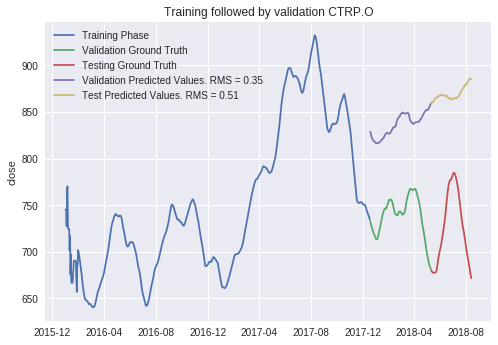

nan_company =====> []
Validation RMS acheived ===>  0.34690753813344555
Test RMS acheived ===>  0.5079647796062228
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 4s - loss: 0.2796
Epoch 2/10
 - 0s - loss: 0.2254
Epoch 3/10
 - 0s - loss: 0.1839
Epoch 4/10
 - 0s - loss: 0.1655
Epoch 5/10
 - 0s - loss: 0.1654
Epoch 6/10
 - 0s - loss: 0.1679
Epoch 7/10
 - 0s - loss: 0.1635
Epoch 8/10
 - 0s - loss: 0.1544
Epoch 9/10
 - 0s - loss: 0.1470
Epoch 10/10
 - 0s - loss: 0.1450
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

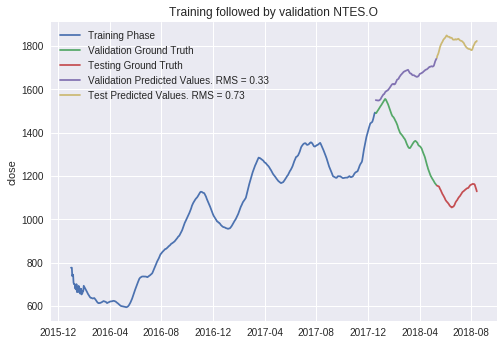

nan_company =====> []
Validation RMS acheived ===>  0.32561085179095073
Test RMS acheived ===>  0.7290288388891949
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 4s - loss: 0.7501
Epoch 2/10
 - 0s - loss: 0.5844
Epoch 3/10
 - 0s - loss: 0.4579
Epoch 4/10
 - 0s - loss: 0.3817
Epoch 5/10
 - 0s - loss: 0.3463
Epoch 6/10
 - 0s - loss: 0.3380
Epoch 7/10
 - 0s - loss: 0.3442
Epoch 8/10
 - 0s - loss: 0.3558
Epoch 9/10
 - 0s - loss: 0.3670
Epoch 10/10
 - 0s - loss: 0.3748
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

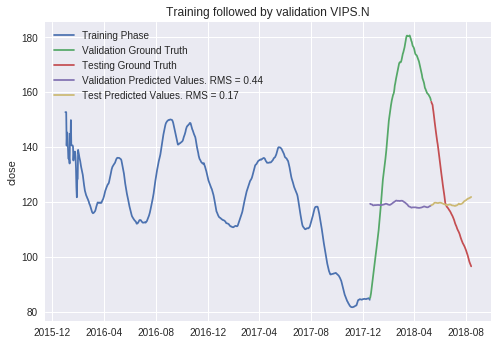

nan_company =====> []
Validation RMS acheived ===>  0.4355787493530928
Test RMS acheived ===>  0.17358517536505025
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 5s - loss: 0.2214
Epoch 2/10
 - 0s - loss: 0.1910
Epoch 3/10
 - 0s - loss: 0.1621
Epoch 4/10
 - 0s - loss: 0.1377
Epoch 5/10
 - 0s - loss: 0.1175
Epoch 6/10
 - 0s - loss: 0.1010
Epoch 7/10
 - 0s - loss: 0.0877
Epoch 8/10
 - 0s - loss: 0.0773
Epoch 9/10
 - 0s - loss: 0.0697
Epoch 10/10
 - 0s - loss: 0.0648
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

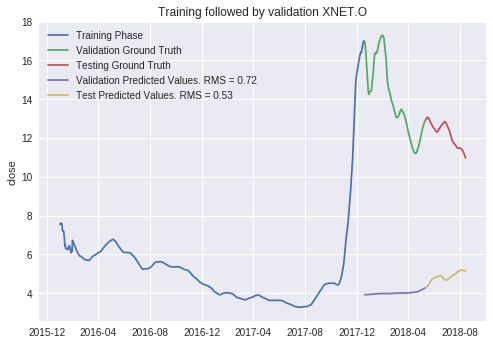

nan_company =====> []
Validation RMS acheived ===>  0.724807657326477
Test RMS acheived ===>  0.5303600717704894
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 5s - loss: 0.5494
Epoch 2/10
 - 0s - loss: 0.4960
Epoch 3/10
 - 0s - loss: 0.4445
Epoch 4/10
 - 0s - loss: 0.4001
Epoch 5/10
 - 0s - loss: 0.3639
Epoch 6/10
 - 0s - loss: 0.3358
Epoch 7/10
 - 0s - loss: 0.3151
Epoch 8/10
 - 0s - loss: 0.3006
Epoch 9/10
 - 0s - loss: 0.2907
Epoch 10/10
 - 0s - loss: 0.2838
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

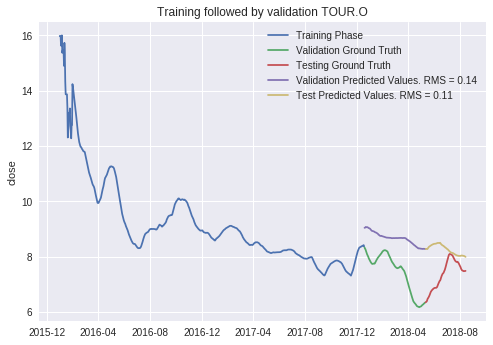

nan_company =====> []
Validation RMS acheived ===>  0.13700819145794338
Test RMS acheived ===>  0.11234672569170698
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 5s - loss: 0.5227
Epoch 2/10
 - 0s - loss: 0.4765
Epoch 3/10
 - 0s - loss: 0.4298
Epoch 4/10
 - 0s - loss: 0.3881
Epoch 5/10
 - 0s - loss: 0.3529
Epoch 6/10
 - 0s - loss: 0.3239
Epoch 7/10
 - 0s - loss: 0.3002
Epoch 8/10
 - 0s - loss: 0.2811
Epoch 9/10
 - 0s - loss: 0.2662
Epoch 10/10
 - 0s - loss: 0.2551
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

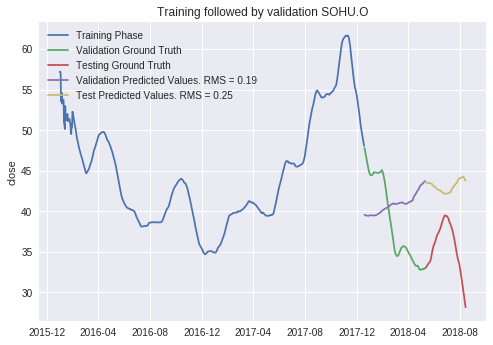

nan_company =====> []
Validation RMS acheived ===>  0.19319850728922733
Test RMS acheived ===>  0.24566491746406327
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 5s - loss: 0.3607
Epoch 2/10
 - 0s - loss: 0.3147
Epoch 3/10
 - 0s - loss: 0.2728
Epoch 4/10
 - 0s - loss: 0.2391
Epoch 5/10
 - 0s - loss: 0.2129
Epoch 6/10
 - 0s - loss: 0.1930
Epoch 7/10
 - 0s - loss: 0.1779
Epoch 8/10
 - 0s - loss: 0.1665
Epoch 9/10
 - 0s - loss: 0.1580
Epoch 10/10
 - 0s - loss: 0.1517
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
T

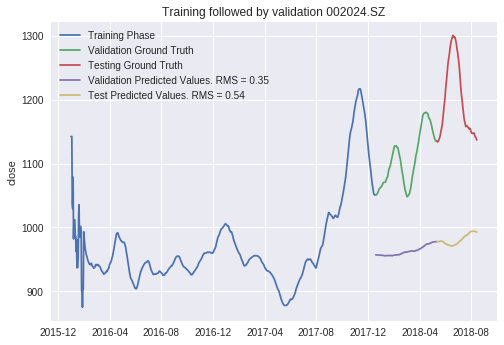

nan_company =====> []
Validation RMS acheived ===>  0.351293309358141
Test RMS acheived ===>  0.5413218347358109
SELECTED_TICKER BABA.N
nan_company =====> []
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 6s - loss: 0.1363
Epoch 2/10
 - 0s - loss: 0.1198
Epoch 3/10
 - 0s - loss: 0.1061
Epoch 4/10
 - 0s - loss: 0.0965
Epoch 5/10
 - 0s - loss: 0.0904
Epoch 6/10
 - 0s - loss: 0.0869
Epoch 7/10
 - 0s - loss: 0.0852
Epoch 8/10
 - 0s - loss: 0.0845
Epoch 9/10
 - 0s - loss: 0.0845
Epoch 10/10
 - 0s - loss: 0.0848
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (N

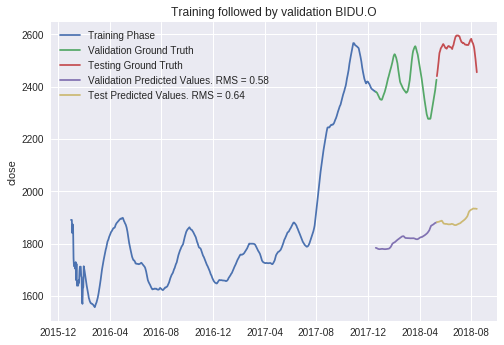

nan_company =====> ['BABA.N']
Validation RMS acheived ===>  0.5808941328454732
Test RMS acheived ===>  0.6389608834147378
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 6s - loss: 1.3132
Epoch 2/10
 - 0s - loss: 1.2368
Epoch 3/10
 - 0s - loss: 1.1477
Epoch 4/10
 - 0s - loss: 1.0525
Epoch 5/10
 - 0s - loss: 0.9539
Epoch 6/10
 - 0s - loss: 0.8538
Epoch 7/10
 - 0s - loss: 0.7538
Epoch 8/10
 - 0s - loss: 0.6561
Epoch 9/10
 - 0s - loss: 0.5632
Epoch 10/10
 - 0s - loss: 0.4784
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
T

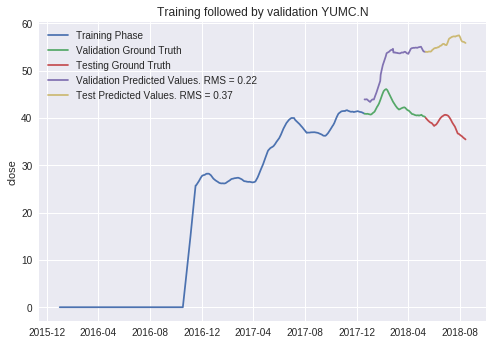

nan_company =====> ['BABA.N']
Validation RMS acheived ===>  0.22101699544005382
Test RMS acheived ===>  0.3723651598806679
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 6s - loss: 0.3459
Epoch 2/10
 - 0s - loss: 0.2829
Epoch 3/10
 - 0s - loss: 0.2270
Epoch 4/10
 - 0s - loss: 0.1837
Epoch 5/10
 - 0s - loss: 0.1524
Epoch 6/10
 - 0s - loss: 0.1309
Epoch 7/10
 - 0s - loss: 0.1169
Epoch 8/10
 - 0s - loss: 0.1084
Epoch 9/10
 - 0s - loss: 0.1037
Epoch 10/10
 - 0s - loss: 0.1015
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       


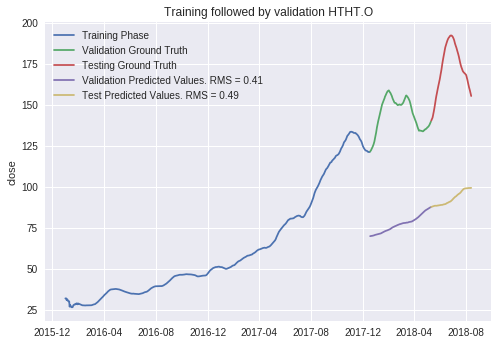

nan_company =====> ['BABA.N']
Validation RMS acheived ===>  0.41072872972606234
Test RMS acheived ===>  0.48772896263993004
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 7s - loss: 0.4829
Epoch 2/10
 - 0s - loss: 0.4397
Epoch 3/10
 - 0s - loss: 0.3925
Epoch 4/10
 - 0s - loss: 0.3459
Epoch 5/10
 - 0s - loss: 0.3022
Epoch 6/10
 - 0s - loss: 0.2629
Epoch 7/10
 - 0s - loss: 0.2294
Epoch 8/10
 - 0s - loss: 0.2027
Epoch 9/10
 - 0s - loss: 0.1837
Epoch 10/10
 - 0s - loss: 0.1722
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       

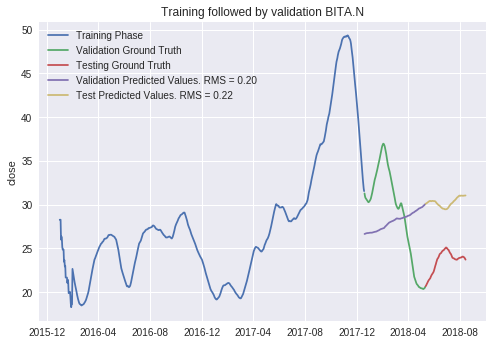

nan_company =====> ['BABA.N']
Validation RMS acheived ===>  0.19791121948203239
Test RMS acheived ===>  0.22034647590655407
SELECTED_TICKER YRD.N
nan_company =====> ['BABA.N']
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 7s - loss: 0.5193
Epoch 2/10
 - 0s - loss: 0.4603
Epoch 3/10
 - 0s - loss: 0.4168
Epoch 4/10
 - 0s - loss: 0.3876
Epoch 5/10
 - 0s - loss: 0.3666
Epoch 6/10
 - 0s - loss: 0.3499
Epoch 7/10
 - 0s - loss: 0.3356
Epoch 8/10
 - 0s - loss: 0.3232
Epoch 9/10
 - 0s - loss: 0.3129
Epoch 10/10
 - 0s - loss: 0.3045
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distribu

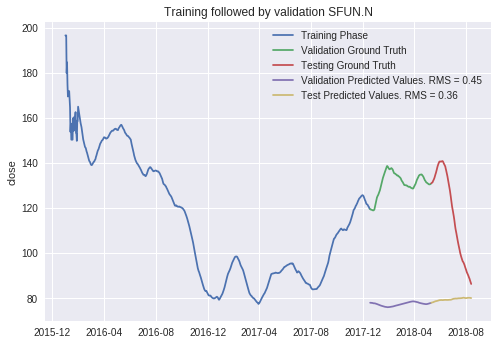

nan_company =====> ['BABA.N', 'YRD.N']
Validation RMS acheived ===>  0.453565982174493
Test RMS acheived ===>  0.36488365460830796
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 7s - loss: 1.0493
Epoch 2/10
 - 0s - loss: 0.9432
Epoch 3/10
 - 0s - loss: 0.8358
Epoch 4/10
 - 0s - loss: 0.7376
Epoch 5/10
 - 0s - loss: 0.6512
Epoch 6/10
 - 0s - loss: 0.5770
Epoch 7/10
 - 0s - loss: 0.5150
Epoch 8/10
 - 0s - loss: 0.4647
Epoch 9/10
 - 0s - loss: 0.4255
Epoch 10/10
 - 0s - loss: 0.3964
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903

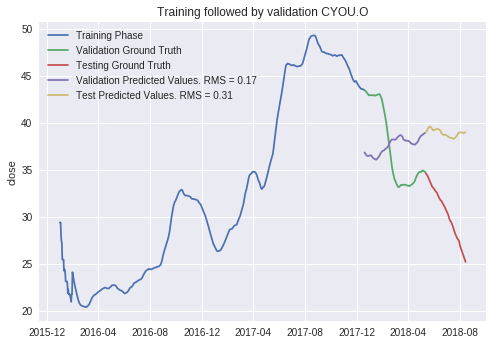

nan_company =====> ['BABA.N', 'YRD.N']
Validation RMS acheived ===>  0.17141152358649858
Test RMS acheived ===>  0.30669150005585466
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 8s - loss: 0.5102
Epoch 2/10
 - 0s - loss: 0.4116
Epoch 3/10
 - 0s - loss: 0.3328
Epoch 4/10
 - 0s - loss: 0.2815
Epoch 5/10
 - 0s - loss: 0.2536
Epoch 6/10
 - 0s - loss: 0.2422
Epoch 7/10
 - 0s - loss: 0.2404
Epoch 8/10
 - 0s - loss: 0.2428
Epoch 9/10
 - 0s - loss: 0.2458
Epoch 10/10
 - 0s - loss: 0.2472
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)             

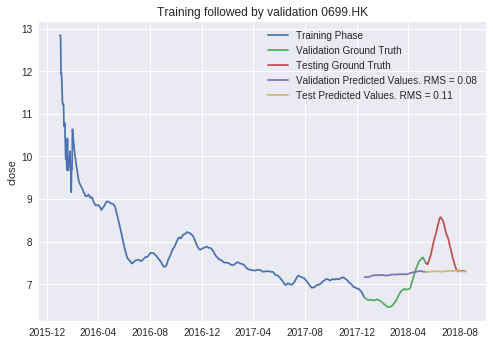

nan_company =====> ['BABA.N', 'YRD.N']
Validation RMS acheived ===>  0.07989909952199073
Test RMS acheived ===>  0.10644308873579422
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 8s - loss: 0.1533
Epoch 2/10
 - 0s - loss: 0.1404
Epoch 3/10
 - 0s - loss: 0.1280
Epoch 4/10
 - 0s - loss: 0.1179
Epoch 5/10
 - 0s - loss: 0.1108
Epoch 6/10
 - 0s - loss: 0.1066
Epoch 7/10
 - 0s - loss: 0.1048
Epoch 8/10
 - 0s - loss: 0.1044
Epoch 9/10
 - 0s - loss: 0.1042
Epoch 10/10
 - 0s - loss: 0.1037
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903

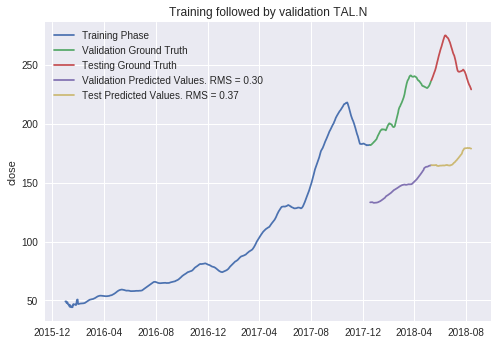

nan_company =====> ['BABA.N', 'YRD.N']
Validation RMS acheived ===>  0.30013834372191206
Test RMS acheived ===>  0.3708433973421925
The train-test accuracy:  0.37536748895646443


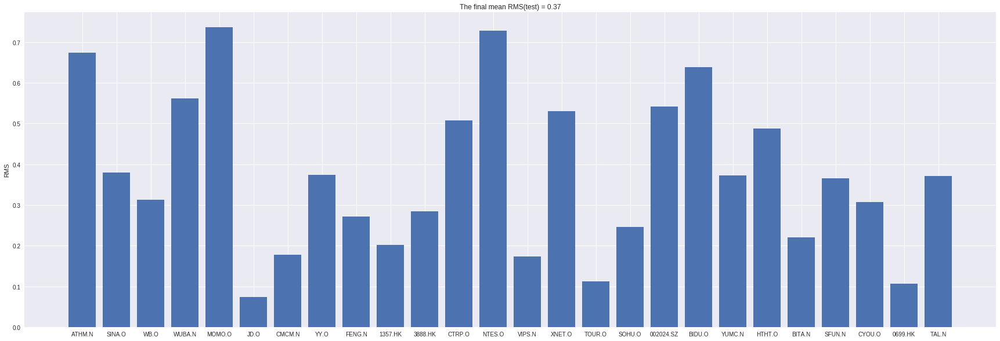

Saved model to disk
Iter Count======================> 1
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 8s - loss: 0.2150
Epoch 2/10
 - 0s - loss: 0.2006
Epoch 3/10
 - 0s - loss: 0.1866
Epoch 4/10
 - 0s - loss: 0.1743
Epoch 5/10
 - 0s - loss: 0.1635
Epoch 6/10
 - 0s - loss: 0.1541
Epoch 7/10
 - 0s - loss: 0.1460
Epoch 8/10
 - 0s - loss: 0.1392
Epoch 9/10
 - 0s - loss: 0.1338
Epoch 10/10
 - 0s - loss: 0.1300
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable param

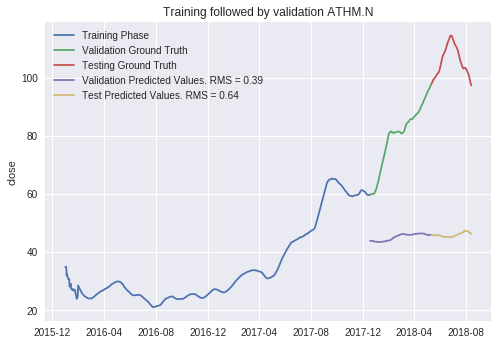

nan_company =====> []
Validation RMS acheived ===>  0.38945410571146094
Test RMS acheived ===>  0.6431074167833944
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 8s - loss: 0.7842
Epoch 2/10
 - 0s - loss: 0.7242
Epoch 3/10
 - 0s - loss: 0.6618
Epoch 4/10
 - 0s - loss: 0.6033
Epoch 5/10
 - 0s - loss: 0.5506
Epoch 6/10
 - 0s - loss: 0.5043
Epoch 7/10
 - 0s - loss: 0.4642
Epoch 8/10
 - 0s - loss: 0.4300
Epoch 9/10
 - 0s - loss: 0.4010
Epoch 10/10
 - 0s - loss: 0.3764
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

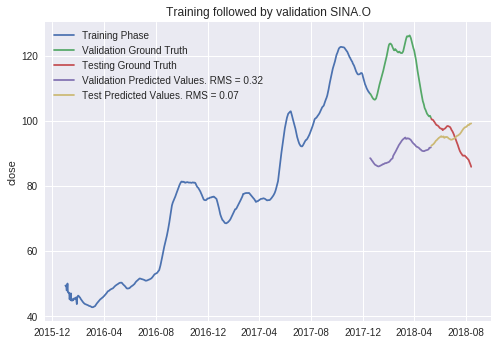

nan_company =====> []
Validation RMS acheived ===>  0.3150558978970677
Test RMS acheived ===>  0.07319211950855728
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 9s - loss: 0.0892
Epoch 2/10
 - 0s - loss: 0.0743
Epoch 3/10
 - 0s - loss: 0.0642
Epoch 4/10
 - 0s - loss: 0.0583
Epoch 5/10
 - 0s - loss: 0.0541
Epoch 6/10
 - 0s - loss: 0.0504
Epoch 7/10
 - 0s - loss: 0.0471
Epoch 8/10
 - 0s - loss: 0.0444
Epoch 9/10
 - 0s - loss: 0.0427
Epoch 10/10
 - 0s - loss: 0.0422
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

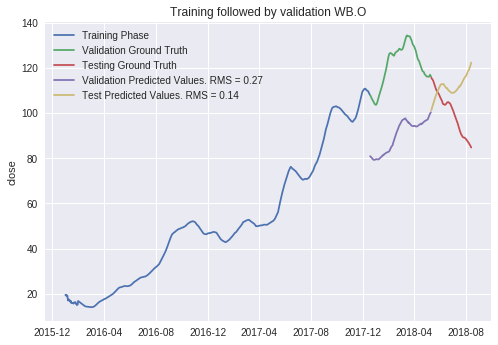

nan_company =====> []
Validation RMS acheived ===>  0.2655962004992254
Test RMS acheived ===>  0.1425447565300541
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 9s - loss: 0.5170
Epoch 2/10
 - 0s - loss: 0.4193
Epoch 3/10
 - 0s - loss: 0.3340
Epoch 4/10
 - 0s - loss: 0.2692
Epoch 5/10
 - 0s - loss: 0.2231
Epoch 6/10
 - 0s - loss: 0.1918
Epoch 7/10
 - 0s - loss: 0.1715
Epoch 8/10
 - 0s - loss: 0.1585
Epoch 9/10
 - 0s - loss: 0.1503
Epoch 10/10
 - 0s - loss: 0.1449
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

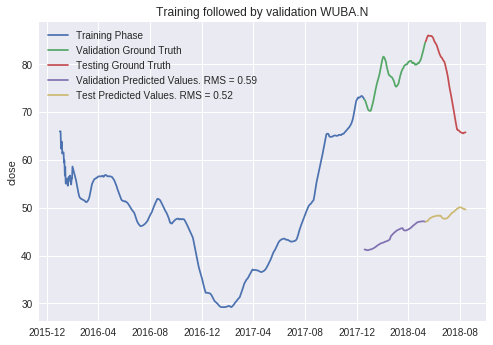

nan_company =====> []
Validation RMS acheived ===>  0.5916507132361264
Test RMS acheived ===>  0.5201565955610433
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 9s - loss: 0.5523
Epoch 2/10
 - 0s - loss: 0.4976
Epoch 3/10
 - 0s - loss: 0.4363
Epoch 4/10
 - 0s - loss: 0.3742
Epoch 5/10
 - 0s - loss: 0.3142
Epoch 6/10
 - 0s - loss: 0.2584
Epoch 7/10
 - 0s - loss: 0.2091
Epoch 8/10
 - 0s - loss: 0.1687
Epoch 9/10
 - 0s - loss: 0.1398
Epoch 10/10
 - 0s - loss: 0.1242
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

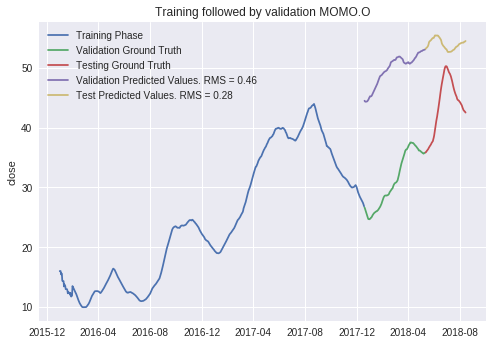

nan_company =====> []
Validation RMS acheived ===>  0.4637939848450839
Test RMS acheived ===>  0.2810811651873309
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 9s - loss: 0.4013
Epoch 2/10
 - 0s - loss: 0.3301
Epoch 3/10
 - 0s - loss: 0.2754
Epoch 4/10
 - 0s - loss: 0.2415
Epoch 5/10
 - 0s - loss: 0.2235
Epoch 6/10
 - 0s - loss: 0.2148
Epoch 7/10
 - 0s - loss: 0.2098
Epoch 8/10
 - 0s - loss: 0.2049
Epoch 9/10
 - 0s - loss: 0.1984
Epoch 10/10
 - 0s - loss: 0.1900
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params:

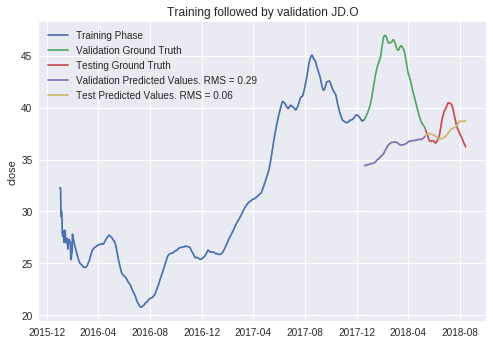

nan_company =====> []
Validation RMS acheived ===>  0.2944664204572469
Test RMS acheived ===>  0.06154738767091283
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 10s - loss: 0.4213
Epoch 2/10
 - 0s - loss: 0.3628
Epoch 3/10
 - 0s - loss: 0.3196
Epoch 4/10
 - 0s - loss: 0.2926
Epoch 5/10
 - 0s - loss: 0.2760
Epoch 6/10
 - 0s - loss: 0.2639
Epoch 7/10
 - 0s - loss: 0.2530
Epoch 8/10
 - 0s - loss: 0.2428
Epoch 9/10
 - 0s - loss: 0.2340
Epoch 10/10
 - 0s - loss: 0.2282
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

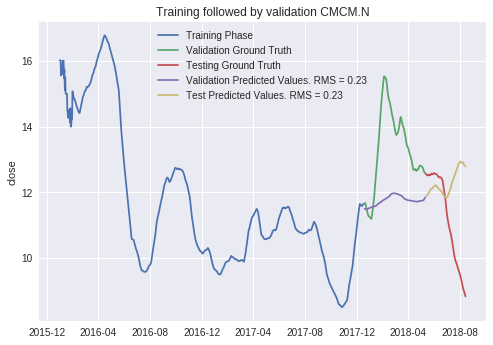

nan_company =====> []
Validation RMS acheived ===>  0.2309190017954399
Test RMS acheived ===>  0.23492911331198554
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 10s - loss: 0.2596
Epoch 2/10
 - 0s - loss: 0.2280
Epoch 3/10
 - 0s - loss: 0.1979
Epoch 4/10
 - 0s - loss: 0.1716
Epoch 5/10
 - 0s - loss: 0.1489
Epoch 6/10
 - 0s - loss: 0.1290
Epoch 7/10
 - 0s - loss: 0.1113
Epoch 8/10
 - 0s - loss: 0.0954
Epoch 9/10
 - 0s - loss: 0.0812
Epoch 10/10
 - 0s - loss: 0.0691
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

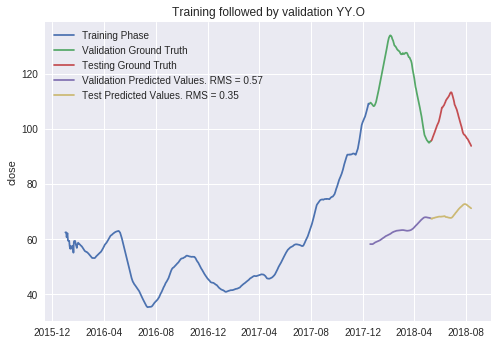

nan_company =====> []
Validation RMS acheived ===>  0.572711809184119
Test RMS acheived ===>  0.3548082640499738
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 10s - loss: 0.2549
Epoch 2/10
 - 0s - loss: 0.2367
Epoch 3/10
 - 0s - loss: 0.2211
Epoch 4/10
 - 0s - loss: 0.2100
Epoch 5/10
 - 0s - loss: 0.2033
Epoch 6/10
 - 0s - loss: 0.1999
Epoch 7/10
 - 0s - loss: 0.1983
Epoch 8/10
 - 0s - loss: 0.1970
Epoch 9/10
 - 0s - loss: 0.1953
Epoch 10/10
 - 0s - loss: 0.1930
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

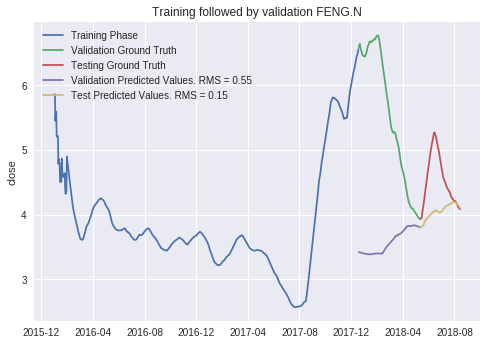

nan_company =====> []
Validation RMS acheived ===>  0.5458022046525987
Test RMS acheived ===>  0.15171051954557252
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 11s - loss: 1.0944
Epoch 2/10
 - 0s - loss: 1.0523
Epoch 3/10
 - 0s - loss: 1.0063
Epoch 4/10
 - 0s - loss: 0.9602
Epoch 5/10
 - 0s - loss: 0.9154
Epoch 6/10
 - 0s - loss: 0.8723
Epoch 7/10
 - 0s - loss: 0.8310
Epoch 8/10
 - 0s - loss: 0.7915
Epoch 9/10
 - 0s - loss: 0.7538
Epoch 10/10
 - 0s - loss: 0.7179
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

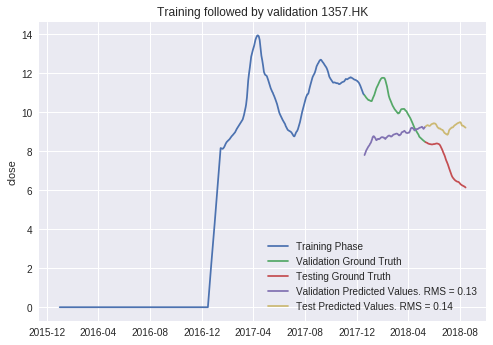

nan_company =====> []
Validation RMS acheived ===>  0.132479955011046
Test RMS acheived ===>  0.14429915255428177
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 11s - loss: 0.3042
Epoch 2/10
 - 0s - loss: 0.2759
Epoch 3/10
 - 0s - loss: 0.2549
Epoch 4/10
 - 0s - loss: 0.2415
Epoch 5/10
 - 0s - loss: 0.2327
Epoch 6/10
 - 0s - loss: 0.2257
Epoch 7/10
 - 0s - loss: 0.2192
Epoch 8/10
 - 0s - loss: 0.2131
Epoch 9/10
 - 0s - loss: 0.2077
Epoch 10/10
 - 0s - loss: 0.2039
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

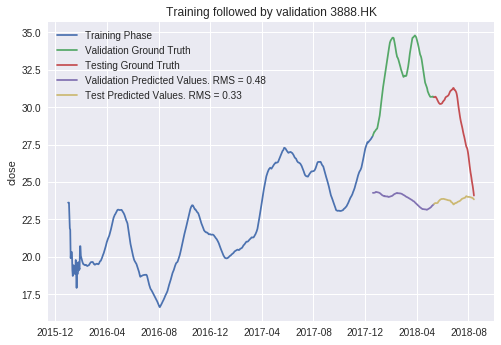

nan_company =====> []
Validation RMS acheived ===>  0.47796683032650483
Test RMS acheived ===>  0.32732710047060876
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 11s - loss: 0.4812
Epoch 2/10
 - 0s - loss: 0.4262
Epoch 3/10
 - 0s - loss: 0.3731
Epoch 4/10
 - 0s - loss: 0.3305
Epoch 5/10
 - 0s - loss: 0.3014
Epoch 6/10
 - 0s - loss: 0.2855
Epoch 7/10
 - 0s - loss: 0.2785
Epoch 8/10
 - 0s - loss: 0.2743
Epoch 9/10
 - 0s - loss: 0.2685
Epoch 10/10
 - 0s - loss: 0.2603
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

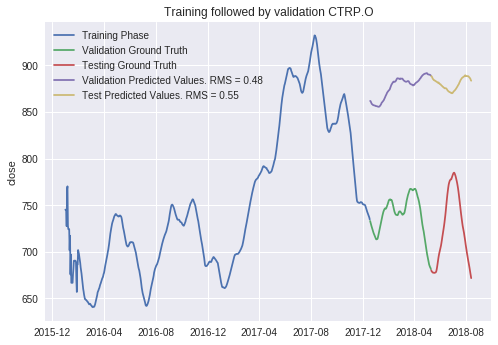

nan_company =====> []
Validation RMS acheived ===>  0.4818897157012903
Test RMS acheived ===>  0.5458417681007125
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 12s - loss: 0.1819
Epoch 2/10
 - 0s - loss: 0.1536
Epoch 3/10
 - 0s - loss: 0.1353
Epoch 4/10
 - 0s - loss: 0.1272
Epoch 5/10
 - 0s - loss: 0.1215
Epoch 6/10
 - 0s - loss: 0.1146
Epoch 7/10
 - 0s - loss: 0.1082
Epoch 8/10
 - 0s - loss: 0.1047
Epoch 9/10
 - 0s - loss: 0.1044
Epoch 10/10
 - 0s - loss: 0.1054
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

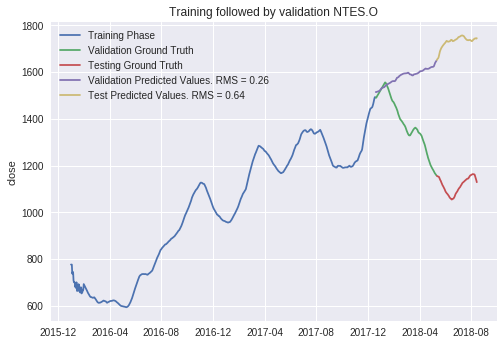

nan_company =====> []
Validation RMS acheived ===>  0.2571729042491432
Test RMS acheived ===>  0.6408005407184308
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 12s - loss: 0.5961
Epoch 2/10
 - 0s - loss: 0.4641
Epoch 3/10
 - 0s - loss: 0.3610
Epoch 4/10
 - 0s - loss: 0.2984
Epoch 5/10
 - 0s - loss: 0.2715
Epoch 6/10
 - 0s - loss: 0.2698
Epoch 7/10
 - 0s - loss: 0.2820
Epoch 8/10
 - 0s - loss: 0.2981
Epoch 9/10
 - 0s - loss: 0.3112
Epoch 10/10
 - 0s - loss: 0.3180
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

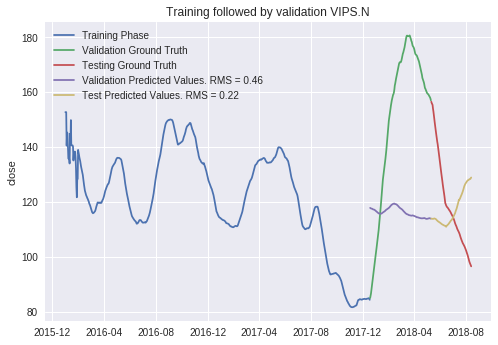

nan_company =====> []
Validation RMS acheived ===>  0.45971473909846367
Test RMS acheived ===>  0.21847099183809704
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 12s - loss: 0.1355
Epoch 2/10
 - 0s - loss: 0.1143
Epoch 3/10
 - 0s - loss: 0.0942
Epoch 4/10
 - 0s - loss: 0.0772
Epoch 5/10
 - 0s - loss: 0.0635
Epoch 6/10
 - 0s - loss: 0.0529
Epoch 7/10
 - 0s - loss: 0.0452
Epoch 8/10
 - 0s - loss: 0.0399
Epoch 9/10
 - 0s - loss: 0.0368
Epoch 10/10
 - 0s - loss: 0.0356
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

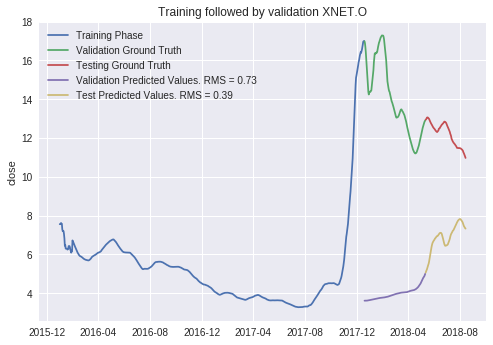

nan_company =====> []
Validation RMS acheived ===>  0.7294391341128161
Test RMS acheived ===>  0.3925943276999246
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 12s - loss: 0.4728
Epoch 2/10
 - 0s - loss: 0.4188
Epoch 3/10
 - 0s - loss: 0.3690
Epoch 4/10
 - 0s - loss: 0.3289
Epoch 5/10
 - 0s - loss: 0.2987
Epoch 6/10
 - 0s - loss: 0.2768
Epoch 7/10
 - 0s - loss: 0.2610
Epoch 8/10
 - 0s - loss: 0.2494
Epoch 9/10
 - 0s - loss: 0.2407
Epoch 10/10
 - 0s - loss: 0.2339
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

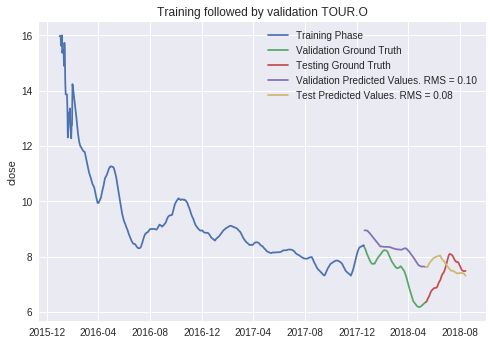

nan_company =====> []
Validation RMS acheived ===>  0.09836145446727712
Test RMS acheived ===>  0.07629122779310975
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 13s - loss: 0.5153
Epoch 2/10
 - 0s - loss: 0.4515
Epoch 3/10
 - 0s - loss: 0.3881
Epoch 4/10
 - 0s - loss: 0.3328
Epoch 5/10
 - 0s - loss: 0.2884
Epoch 6/10
 - 0s - loss: 0.2550
Epoch 7/10
 - 0s - loss: 0.2309
Epoch 8/10
 - 0s - loss: 0.2132
Epoch 9/10
 - 0s - loss: 0.1995
Epoch 10/10
 - 0s - loss: 0.1880
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

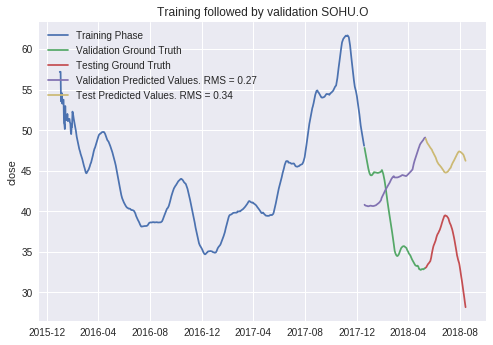

nan_company =====> []
Validation RMS acheived ===>  0.2689316382825327
Test RMS acheived ===>  0.34197690619951177
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 13s - loss: 0.3830
Epoch 2/10
 - 0s - loss: 0.3284
Epoch 3/10
 - 0s - loss: 0.2787
Epoch 4/10
 - 0s - loss: 0.2387
Epoch 5/10
 - 0s - loss: 0.2081
Epoch 6/10
 - 0s - loss: 0.1859
Epoch 7/10
 - 0s - loss: 0.1703
Epoch 8/10
 - 0s - loss: 0.1599
Epoch 9/10
 - 0s - loss: 0.1533
Epoch 10/10
 - 0s - loss: 0.1495
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
T

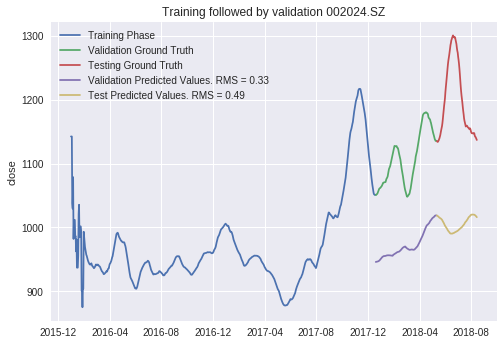

nan_company =====> []
Validation RMS acheived ===>  0.32576627677620523
Test RMS acheived ===>  0.48870273385637597
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 13s - loss: 0.1191
Epoch 2/10
 - 0s - loss: 0.1054
Epoch 3/10
 - 0s - loss: 0.0936
Epoch 4/10
 - 0s - loss: 0.0849
Epoch 5/10
 - 0s - loss: 0.0794
Epoch 6/10
 - 0s - loss: 0.0764
Epoch 7/10
 - 0s - loss: 0.0753
Epoch 8/10
 - 0s - loss: 0.0755
Epoch 9/10
 - 0s - loss: 0.0762
Epoch 10/10
 - 0s - loss: 0.0768
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

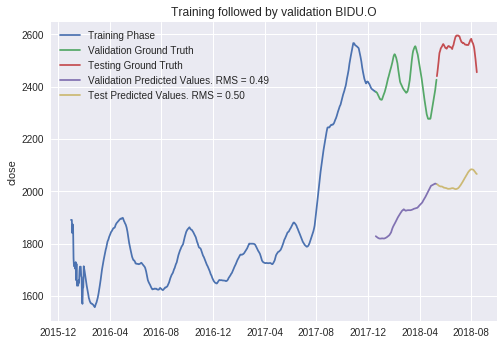

nan_company =====> []
Validation RMS acheived ===>  0.49283731263518415
Test RMS acheived ===>  0.5018791592493094
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 13s - loss: 1.0848
Epoch 2/10
 - 0s - loss: 1.0152
Epoch 3/10
 - 0s - loss: 0.9367
Epoch 4/10
 - 0s - loss: 0.8560
Epoch 5/10
 - 0s - loss: 0.7757
Epoch 6/10
 - 0s - loss: 0.6975
Epoch 7/10
 - 0s - loss: 0.6230
Epoch 8/10
 - 0s - loss: 0.5536
Epoch 9/10
 - 0s - loss: 0.4909
Epoch 10/10
 - 0s - loss: 0.4368
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

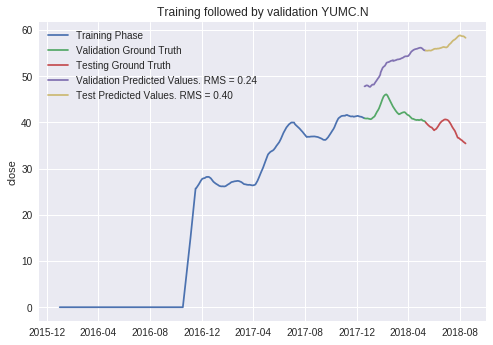

nan_company =====> []
Validation RMS acheived ===>  0.24005086382714985
Test RMS acheived ===>  0.3987899889693085
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 14s - loss: 0.2859
Epoch 2/10
 - 0s - loss: 0.2413
Epoch 3/10
 - 0s - loss: 0.2002
Epoch 4/10
 - 0s - loss: 0.1668
Epoch 5/10
 - 0s - loss: 0.1413
Epoch 6/10
 - 0s - loss: 0.1228
Epoch 7/10
 - 0s - loss: 0.1100
Epoch 8/10
 - 0s - loss: 0.1017
Epoch 9/10
 - 0s - loss: 0.0968
Epoch 10/10
 - 0s - loss: 0.0942
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

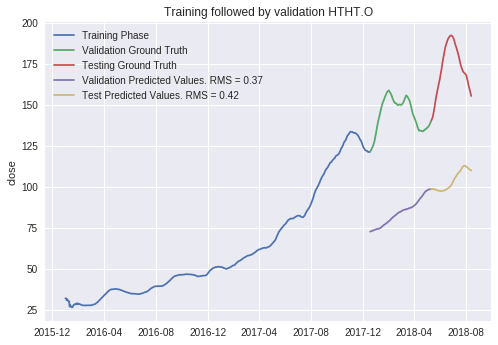

nan_company =====> []
Validation RMS acheived ===>  0.3704667886200513
Test RMS acheived ===>  0.424944620597266
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 14s - loss: 0.4828
Epoch 2/10
 - 0s - loss: 0.4398
Epoch 3/10
 - 0s - loss: 0.3934
Epoch 4/10
 - 0s - loss: 0.3481
Epoch 5/10
 - 0s - loss: 0.3057
Epoch 6/10
 - 0s - loss: 0.2672
Epoch 7/10
 - 0s - loss: 0.2331
Epoch 8/10
 - 0s - loss: 0.2041
Epoch 9/10
 - 0s - loss: 0.1805
Epoch 10/10
 - 0s - loss: 0.1625
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

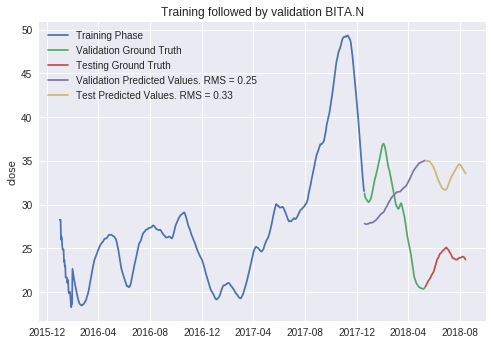

nan_company =====> []
Validation RMS acheived ===>  0.24585638003786536
Test RMS acheived ===>  0.3279978285651594
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 14s - loss: 0.4745
Epoch 2/10
 - 0s - loss: 0.4098
Epoch 3/10
 - 0s - loss: 0.3547
Epoch 4/10
 - 0s - loss: 0.3135
Epoch 5/10
 - 0s - loss: 0.2839
Epoch 6/10
 - 0s - loss: 0.2630
Epoch 7/10
 - 0s - loss: 0.2493
Epoch 8/10
 - 0s - loss: 0.2412
Epoch 9/10
 - 0s - loss: 0.2370
Epoch 10/10
 - 0s - loss: 0.2344
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

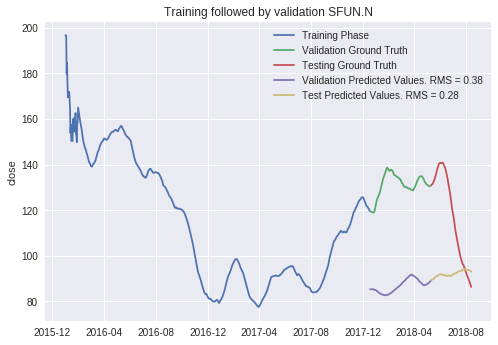

nan_company =====> []
Validation RMS acheived ===>  0.375988805795039
Test RMS acheived ===>  0.2774081847772368
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 15s - loss: 0.8554
Epoch 2/10
 - 0s - loss: 0.7720
Epoch 3/10
 - 0s - loss: 0.6877
Epoch 4/10
 - 0s - loss: 0.6111
Epoch 5/10
 - 0s - loss: 0.5445
Epoch 6/10
 - 0s - loss: 0.4882
Epoch 7/10
 - 0s - loss: 0.4419
Epoch 8/10
 - 0s - loss: 0.4051
Epoch 9/10
 - 0s - loss: 0.3768
Epoch 10/10
 - 0s - loss: 0.3558
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

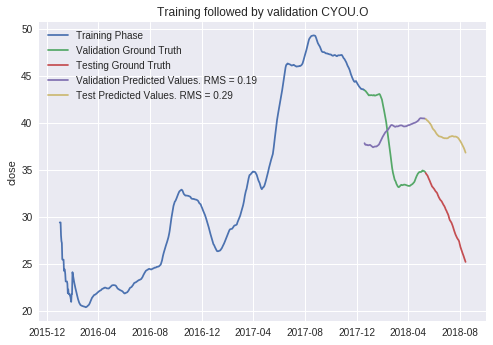

nan_company =====> []
Validation RMS acheived ===>  0.18715273367801818
Test RMS acheived ===>  0.2940836877306662
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 15s - loss: 0.3579
Epoch 2/10
 - 0s - loss: 0.2939
Epoch 3/10
 - 0s - loss: 0.2468
Epoch 4/10
 - 0s - loss: 0.2211
Epoch 5/10
 - 0s - loss: 0.2113
Epoch 6/10
 - 0s - loss: 0.2097
Epoch 7/10
 - 0s - loss: 0.2099
Epoch 8/10
 - 0s - loss: 0.2084
Epoch 9/10
 - 0s - loss: 0.2043
Epoch 10/10
 - 0s - loss: 0.1979
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

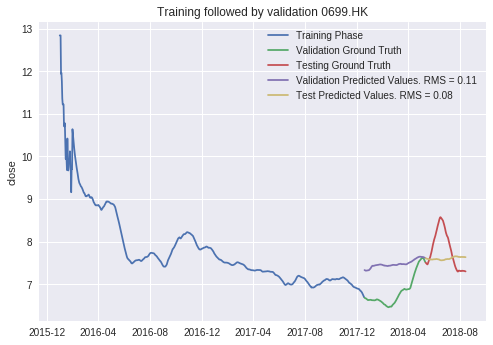

nan_company =====> []
Validation RMS acheived ===>  0.10985345958561427
Test RMS acheived ===>  0.07980941363411874
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 15s - loss: 0.1296
Epoch 2/10
 - 0s - loss: 0.1217
Epoch 3/10
 - 0s - loss: 0.1140
Epoch 4/10
 - 0s - loss: 0.1074
Epoch 5/10
 - 0s - loss: 0.1021
Epoch 6/10
 - 0s - loss: 0.0982
Epoch 7/10
 - 0s - loss: 0.0953
Epoch 8/10
 - 0s - loss: 0.0932
Epoch 9/10
 - 0s - loss: 0.0917
Epoch 10/10
 - 0s - loss: 0.0904
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

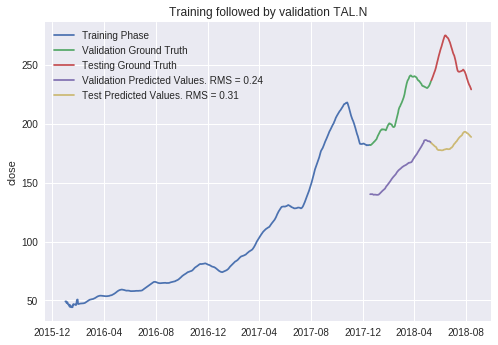

nan_company =====> []
Validation RMS acheived ===>  0.2352012593790181
Test RMS acheived ===>  0.30996385310038205
The train-test accuracy:  0.3174714932308971


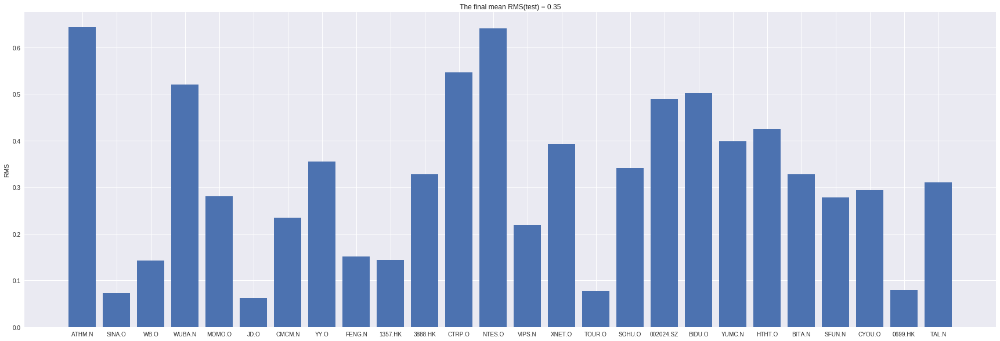

Iter Count======================> 2
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 16s - loss: 0.1973
Epoch 2/10
 - 0s - loss: 0.1859
Epoch 3/10
 - 0s - loss: 0.1738
Epoch 4/10
 - 0s - loss: 0.1622
Epoch 5/10
 - 0s - loss: 0.1515
Epoch 6/10
 - 0s - loss: 0.1418
Epoch 7/10
 - 0s - loss: 0.1334
Epoch 8/10
 - 0s - loss: 0.1266
Epoch 9/10
 - 0s - loss: 0.1214
Epoch 10/10
 - 0s - loss: 0.1179
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
______________

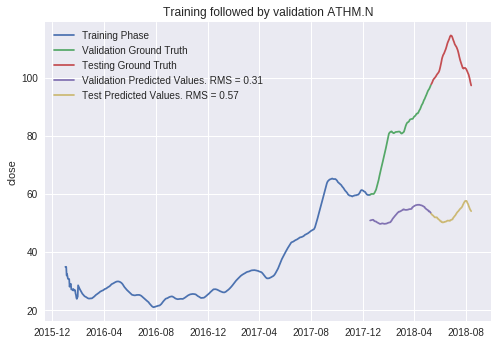

nan_company =====> []
Validation RMS acheived ===>  0.3064817099983188
Test RMS acheived ===>  0.5696841442390602
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 16s - loss: 0.7083
Epoch 2/10
 - 0s - loss: 0.6453
Epoch 3/10
 - 0s - loss: 0.5817
Epoch 4/10
 - 0s - loss: 0.5241
Epoch 5/10
 - 0s - loss: 0.4742
Epoch 6/10
 - 0s - loss: 0.4323
Epoch 7/10
 - 0s - loss: 0.3978
Epoch 8/10
 - 0s - loss: 0.3697
Epoch 9/10
 - 0s - loss: 0.3470
Epoch 10/10
 - 0s - loss: 0.3285
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

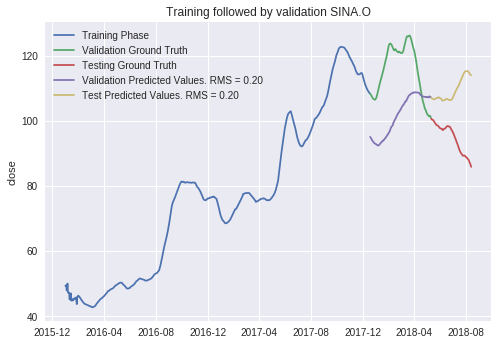

nan_company =====> []
Validation RMS acheived ===>  0.20086975844725424
Test RMS acheived ===>  0.19729082137046597
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 16s - loss: 0.0857
Epoch 2/10
 - 0s - loss: 0.0722
Epoch 3/10
 - 0s - loss: 0.0631
Epoch 4/10
 - 0s - loss: 0.0578
Epoch 5/10
 - 0s - loss: 0.0543
Epoch 6/10
 - 0s - loss: 0.0512
Epoch 7/10
 - 0s - loss: 0.0482
Epoch 8/10
 - 0s - loss: 0.0456
Epoch 9/10
 - 0s - loss: 0.0438
Epoch 10/10
 - 0s - loss: 0.0428
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

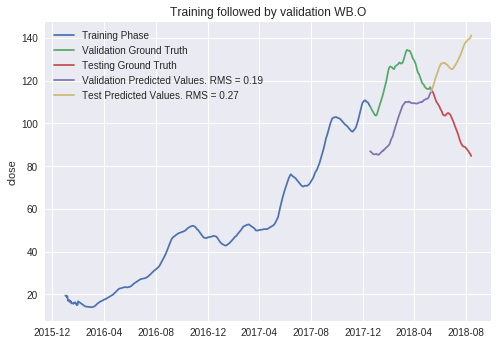

nan_company =====> []
Validation RMS acheived ===>  0.18574975179944786
Test RMS acheived ===>  0.2697703648883332
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 17s - loss: 0.4918
Epoch 2/10
 - 0s - loss: 0.3890
Epoch 3/10
 - 0s - loss: 0.3001
Epoch 4/10
 - 0s - loss: 0.2343
Epoch 5/10
 - 0s - loss: 0.1898
Epoch 6/10
 - 0s - loss: 0.1621
Epoch 7/10
 - 0s - loss: 0.1458
Epoch 8/10
 - 0s - loss: 0.1365
Epoch 9/10
 - 0s - loss: 0.1308
Epoch 10/10
 - 0s - loss: 0.1265
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

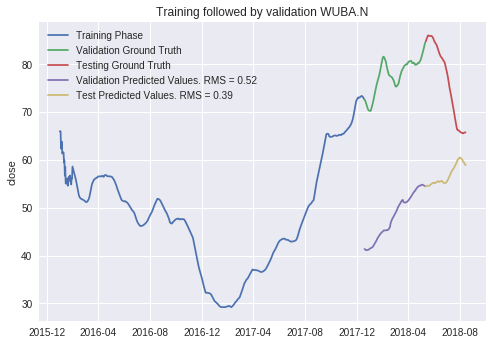

nan_company =====> []
Validation RMS acheived ===>  0.5231732914873508
Test RMS acheived ===>  0.39272301770631585
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 17s - loss: 0.4783
Epoch 2/10
 - 0s - loss: 0.4249
Epoch 3/10
 - 0s - loss: 0.3666
Epoch 4/10
 - 0s - loss: 0.3092
Epoch 5/10
 - 0s - loss: 0.2556
Epoch 6/10
 - 0s - loss: 0.2080
Epoch 7/10
 - 0s - loss: 0.1682
Epoch 8/10
 - 0s - loss: 0.1383
Epoch 9/10
 - 0s - loss: 0.1199
Epoch 10/10
 - 0s - loss: 0.1138
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

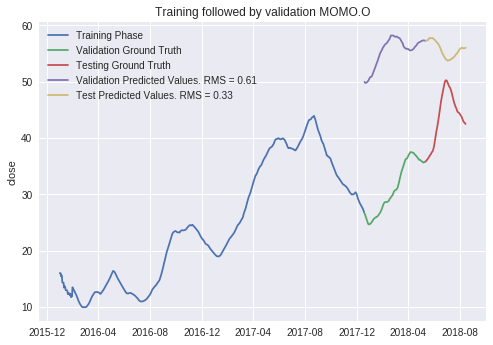

nan_company =====> []
Validation RMS acheived ===>  0.6076907464365692
Test RMS acheived ===>  0.3302415370277172
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 17s - loss: 0.3010
Epoch 2/10
 - 0s - loss: 0.2563
Epoch 3/10
 - 0s - loss: 0.2230
Epoch 4/10
 - 0s - loss: 0.2024
Epoch 5/10
 - 0s - loss: 0.1893
Epoch 6/10
 - 0s - loss: 0.1787
Epoch 7/10
 - 0s - loss: 0.1680
Epoch 8/10
 - 0s - loss: 0.1566
Epoch 9/10
 - 0s - loss: 0.1451
Epoch 10/10
 - 0s - loss: 0.1349
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

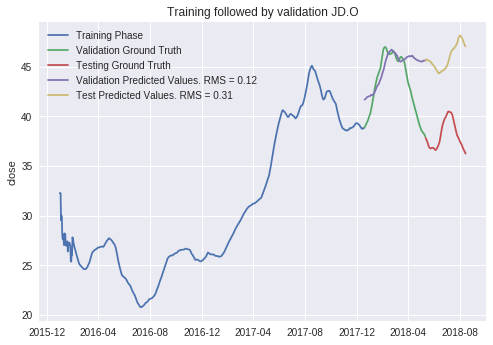

nan_company =====> []
Validation RMS acheived ===>  0.12236116920967187
Test RMS acheived ===>  0.3067046975458475
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 18s - loss: 0.7201
Epoch 2/10
 - 0s - loss: 0.5883
Epoch 3/10
 - 0s - loss: 0.4831
Epoch 4/10
 - 0s - loss: 0.4139
Epoch 5/10
 - 0s - loss: 0.3725
Epoch 6/10
 - 0s - loss: 0.3471
Epoch 7/10
 - 0s - loss: 0.3281
Epoch 8/10
 - 0s - loss: 0.3101
Epoch 9/10
 - 0s - loss: 0.2917
Epoch 10/10
 - 0s - loss: 0.2735
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

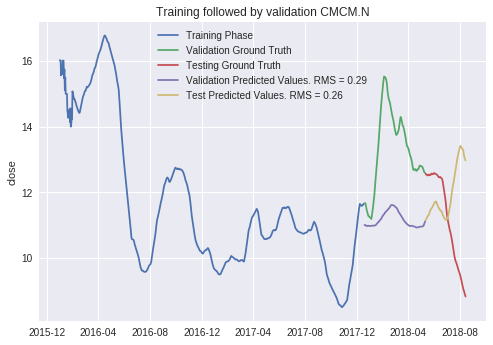

nan_company =====> []
Validation RMS acheived ===>  0.2890499212494019
Test RMS acheived ===>  0.26171647062862646
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 18s - loss: 0.1685
Epoch 2/10
 - 0s - loss: 0.1507
Epoch 3/10
 - 0s - loss: 0.1318
Epoch 4/10
 - 0s - loss: 0.1135
Epoch 5/10
 - 0s - loss: 0.0964
Epoch 6/10
 - 0s - loss: 0.0810
Epoch 7/10
 - 0s - loss: 0.0678
Epoch 8/10
 - 0s - loss: 0.0572
Epoch 9/10
 - 0s - loss: 0.0501
Epoch 10/10
 - 0s - loss: 0.0466
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

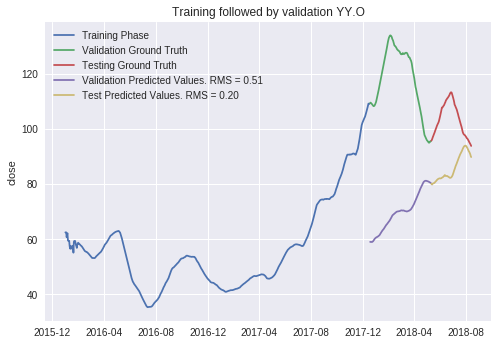

nan_company =====> []
Validation RMS acheived ===>  0.5132718474728827
Test RMS acheived ===>  0.20396231092553482
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 18s - loss: 0.3263
Epoch 2/10
 - 0s - loss: 0.2889
Epoch 3/10
 - 0s - loss: 0.2593
Epoch 4/10
 - 0s - loss: 0.2385
Epoch 5/10
 - 0s - loss: 0.2237
Epoch 6/10
 - 0s - loss: 0.2129
Epoch 7/10
 - 0s - loss: 0.2047
Epoch 8/10
 - 0s - loss: 0.1987
Epoch 9/10
 - 0s - loss: 0.1949
Epoch 10/10
 - 0s - loss: 0.1925
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

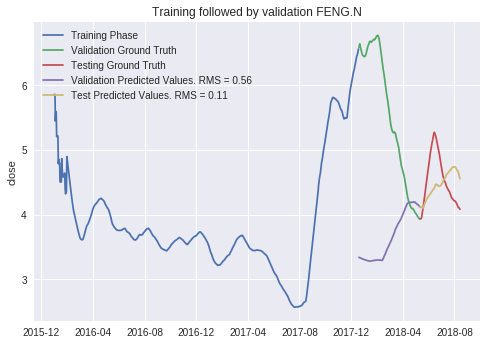

nan_company =====> []
Validation RMS acheived ===>  0.555386518685367
Test RMS acheived ===>  0.1109680708374729
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 19s - loss: 1.1355
Epoch 2/10
 - 0s - loss: 1.0883
Epoch 3/10
 - 0s - loss: 1.0372
Epoch 4/10
 - 0s - loss: 0.9867
Epoch 5/10
 - 0s - loss: 0.9382
Epoch 6/10
 - 0s - loss: 0.8920
Epoch 7/10
 - 0s - loss: 0.8483
Epoch 8/10
 - 0s - loss: 0.8069
Epoch 9/10
 - 0s - loss: 0.7678
Epoch 10/10
 - 0s - loss: 0.7308
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

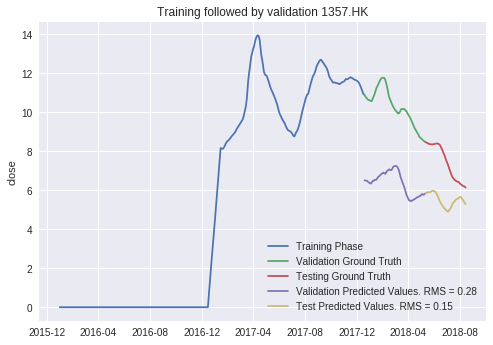

nan_company =====> []
Validation RMS acheived ===>  0.28199296047252814
Test RMS acheived ===>  0.15171916661089244
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 19s - loss: 0.2701
Epoch 2/10
 - 0s - loss: 0.2515
Epoch 3/10
 - 0s - loss: 0.2341
Epoch 4/10
 - 0s - loss: 0.2193
Epoch 5/10
 - 0s - loss: 0.2075
Epoch 6/10
 - 0s - loss: 0.1987
Epoch 7/10
 - 0s - loss: 0.1929
Epoch 8/10
 - 0s - loss: 0.1900
Epoch 9/10
 - 0s - loss: 0.1892
Epoch 10/10
 - 0s - loss: 0.1897
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

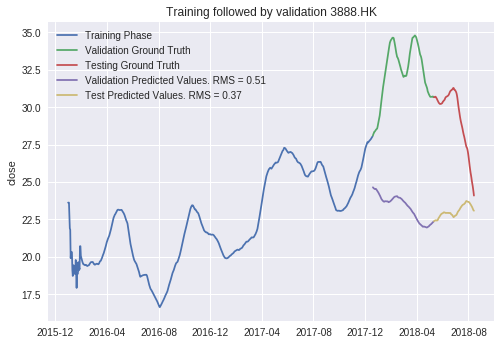

nan_company =====> []
Validation RMS acheived ===>  0.5111180265123163
Test RMS acheived ===>  0.36967992238089664
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 19s - loss: 0.5194
Epoch 2/10
 - 0s - loss: 0.4566
Epoch 3/10
 - 0s - loss: 0.3964
Epoch 4/10
 - 0s - loss: 0.3473
Epoch 5/10
 - 0s - loss: 0.3120
Epoch 6/10
 - 0s - loss: 0.2896
Epoch 7/10
 - 0s - loss: 0.2765
Epoch 8/10
 - 0s - loss: 0.2678
Epoch 9/10
 - 0s - loss: 0.2597
Epoch 10/10
 - 0s - loss: 0.2507
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

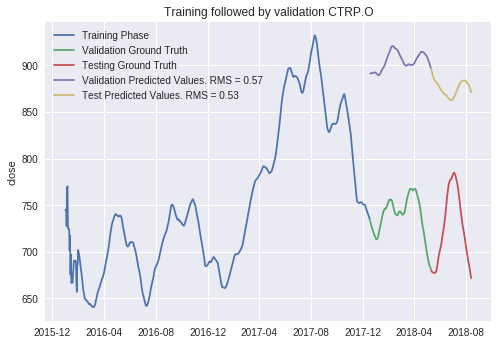

nan_company =====> []
Validation RMS acheived ===>  0.5749002642848615
Test RMS acheived ===>  0.5317336516482355
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 19s - loss: 0.1730
Epoch 2/10
 - 0s - loss: 0.1541
Epoch 3/10
 - 0s - loss: 0.1399
Epoch 4/10
 - 0s - loss: 0.1296
Epoch 5/10
 - 0s - loss: 0.1219
Epoch 6/10
 - 0s - loss: 0.1167
Epoch 7/10
 - 0s - loss: 0.1139
Epoch 8/10
 - 0s - loss: 0.1123
Epoch 9/10
 - 0s - loss: 0.1108
Epoch 10/10
 - 0s - loss: 0.1090
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

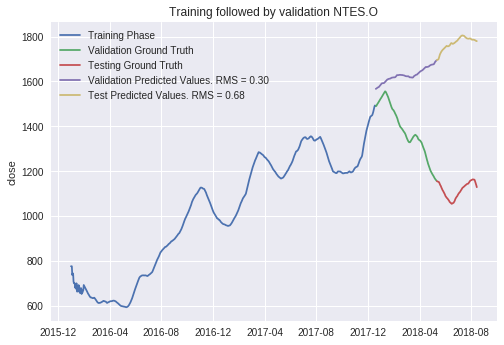

nan_company =====> []
Validation RMS acheived ===>  0.2958595407936663
Test RMS acheived ===>  0.6818536917248225
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 20s - loss: 0.5752
Epoch 2/10
 - 0s - loss: 0.4459
Epoch 3/10
 - 0s - loss: 0.3465
Epoch 4/10
 - 0s - loss: 0.2895
Epoch 5/10
 - 0s - loss: 0.2695
Epoch 6/10
 - 0s - loss: 0.2745
Epoch 7/10
 - 0s - loss: 0.2905
Epoch 8/10
 - 0s - loss: 0.3062
Epoch 9/10
 - 0s - loss: 0.3151
Epoch 10/10
 - 0s - loss: 0.3155
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

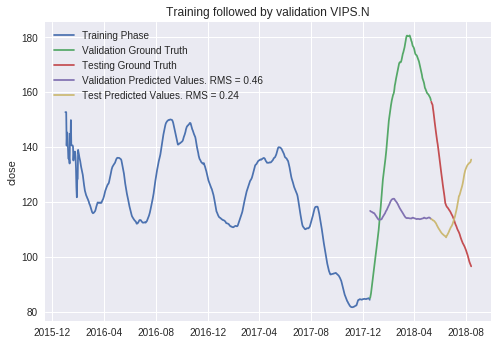

nan_company =====> []
Validation RMS acheived ===>  0.46134943158726655
Test RMS acheived ===>  0.24382101734700307
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 20s - loss: 0.1333
Epoch 2/10
 - 0s - loss: 0.1093
Epoch 3/10
 - 0s - loss: 0.0876
Epoch 4/10
 - 0s - loss: 0.0705
Epoch 5/10
 - 0s - loss: 0.0578
Epoch 6/10
 - 0s - loss: 0.0490
Epoch 7/10
 - 0s - loss: 0.0433
Epoch 8/10
 - 0s - loss: 0.0398
Epoch 9/10
 - 0s - loss: 0.0380
Epoch 10/10
 - 0s - loss: 0.0375
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

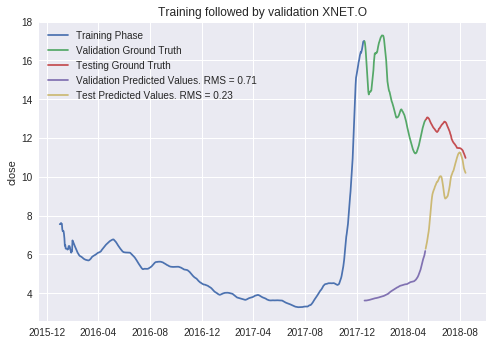

nan_company =====> []
Validation RMS acheived ===>  0.7121019630443933
Test RMS acheived ===>  0.225889264316513
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 20s - loss: 0.4781
Epoch 2/10
 - 0s - loss: 0.4173
Epoch 3/10
 - 0s - loss: 0.3630
Epoch 4/10
 - 0s - loss: 0.3215
Epoch 5/10
 - 0s - loss: 0.2918
Epoch 6/10
 - 0s - loss: 0.2711
Epoch 7/10
 - 0s - loss: 0.2565
Epoch 8/10
 - 0s - loss: 0.2456
Epoch 9/10
 - 0s - loss: 0.2369
Epoch 10/10
 - 0s - loss: 0.2296
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

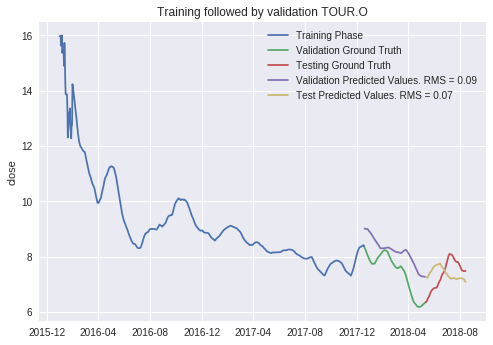

nan_company =====> []
Validation RMS acheived ===>  0.08634681404982282
Test RMS acheived ===>  0.06525185360612511
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 21s - loss: 0.5167
Epoch 2/10
 - 0s - loss: 0.4448
Epoch 3/10
 - 0s - loss: 0.3744
Epoch 4/10
 - 0s - loss: 0.3138
Epoch 5/10
 - 0s - loss: 0.2655
Epoch 6/10
 - 0s - loss: 0.2293
Epoch 7/10
 - 0s - loss: 0.2039
Epoch 8/10
 - 0s - loss: 0.1871
Epoch 9/10
 - 0s - loss: 0.1762
Epoch 10/10
 - 0s - loss: 0.1689
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

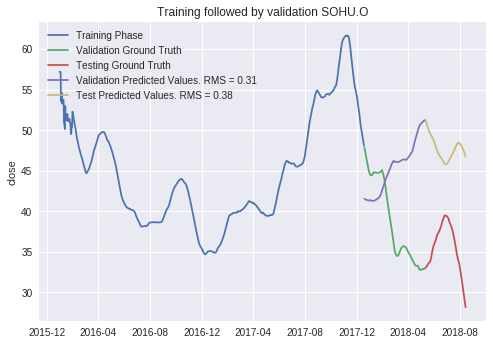

nan_company =====> []
Validation RMS acheived ===>  0.31300037609856174
Test RMS acheived ===>  0.378124033065161
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 21s - loss: 0.3556
Epoch 2/10
 - 0s - loss: 0.3080
Epoch 3/10
 - 0s - loss: 0.2638
Epoch 4/10
 - 0s - loss: 0.2278
Epoch 5/10
 - 0s - loss: 0.2001
Epoch 6/10
 - 0s - loss: 0.1800
Epoch 7/10
 - 0s - loss: 0.1662
Epoch 8/10
 - 0s - loss: 0.1574
Epoch 9/10
 - 0s - loss: 0.1526
Epoch 10/10
 - 0s - loss: 0.1508
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
To

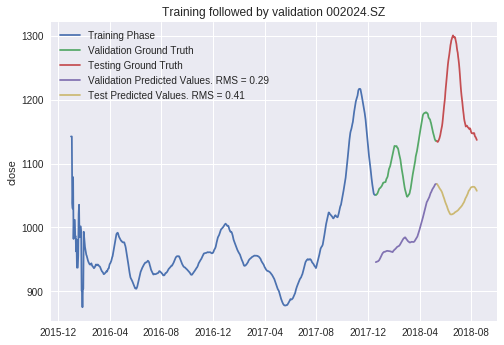

nan_company =====> []
Validation RMS acheived ===>  0.28633845323311474
Test RMS acheived ===>  0.41136010130910133
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 21s - loss: 0.1348
Epoch 2/10
 - 0s - loss: 0.1179
Epoch 3/10
 - 0s - loss: 0.1034
Epoch 4/10
 - 0s - loss: 0.0930
Epoch 5/10
 - 0s - loss: 0.0864
Epoch 6/10
 - 0s - loss: 0.0826
Epoch 7/10
 - 0s - loss: 0.0806
Epoch 8/10
 - 0s - loss: 0.0796
Epoch 9/10
 - 0s - loss: 0.0790
Epoch 10/10
 - 0s - loss: 0.0786
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

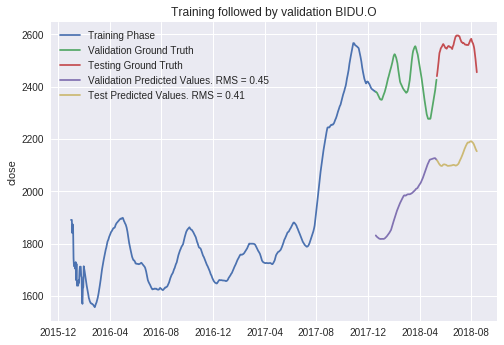

nan_company =====> []
Validation RMS acheived ===>  0.4526816779167395
Test RMS acheived ===>  0.41091737217922975
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 22s - loss: 0.9656
Epoch 2/10
 - 0s - loss: 0.8984
Epoch 3/10
 - 0s - loss: 0.8238
Epoch 4/10
 - 0s - loss: 0.7486
Epoch 5/10
 - 0s - loss: 0.6756
Epoch 6/10
 - 0s - loss: 0.6069
Epoch 7/10
 - 0s - loss: 0.5440
Epoch 8/10
 - 0s - loss: 0.4884
Epoch 9/10
 - 0s - loss: 0.4415
Epoch 10/10
 - 0s - loss: 0.4045
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

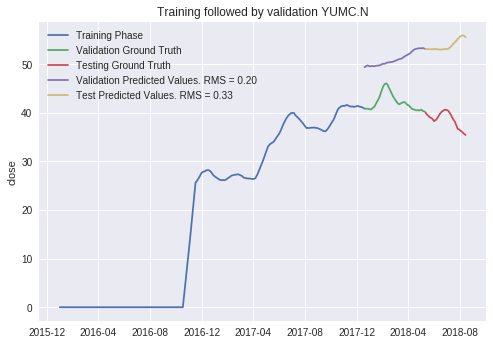

nan_company =====> []
Validation RMS acheived ===>  0.20223154400539148
Test RMS acheived ===>  0.33410155475747444
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 22s - loss: 0.2748
Epoch 2/10
 - 0s - loss: 0.2304
Epoch 3/10
 - 0s - loss: 0.1894
Epoch 4/10
 - 0s - loss: 0.1562
Epoch 5/10
 - 0s - loss: 0.1310
Epoch 6/10
 - 0s - loss: 0.1128
Epoch 7/10
 - 0s - loss: 0.1005
Epoch 8/10
 - 0s - loss: 0.0928
Epoch 9/10
 - 0s - loss: 0.0886
Epoch 10/10
 - 0s - loss: 0.0868
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

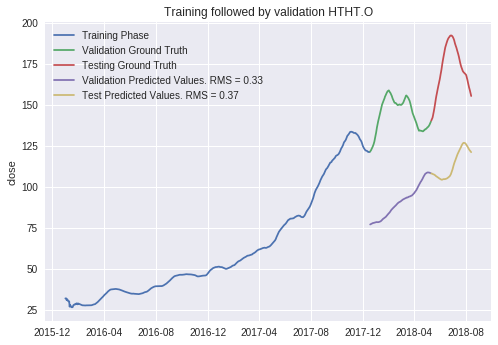

nan_company =====> []
Validation RMS acheived ===>  0.3343028915253334
Test RMS acheived ===>  0.3702427629306404
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 22s - loss: 0.4920
Epoch 2/10
 - 0s - loss: 0.4450
Epoch 3/10
 - 0s - loss: 0.3949
Epoch 4/10
 - 0s - loss: 0.3465
Epoch 5/10
 - 0s - loss: 0.3017
Epoch 6/10
 - 0s - loss: 0.2615
Epoch 7/10
 - 0s - loss: 0.2266
Epoch 8/10
 - 0s - loss: 0.1974
Epoch 9/10
 - 0s - loss: 0.1744
Epoch 10/10
 - 0s - loss: 0.1575
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

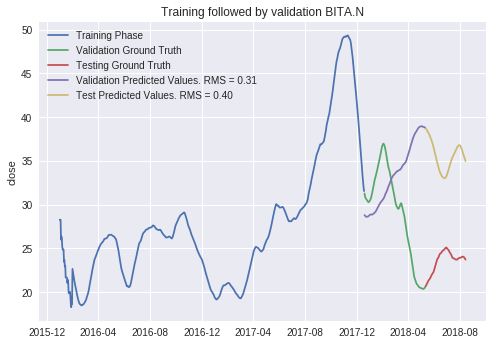

nan_company =====> []
Validation RMS acheived ===>  0.30522359322426235
Test RMS acheived ===>  0.39561520026428915
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 22s - loss: 0.5281
Epoch 2/10
 - 0s - loss: 0.4493
Epoch 3/10
 - 0s - loss: 0.3762
Epoch 4/10
 - 0s - loss: 0.3173
Epoch 5/10
 - 0s - loss: 0.2739
Epoch 6/10
 - 0s - loss: 0.2451
Epoch 7/10
 - 0s - loss: 0.2288
Epoch 8/10
 - 0s - loss: 0.2217
Epoch 9/10
 - 0s - loss: 0.2201
Epoch 10/10
 - 0s - loss: 0.2203
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

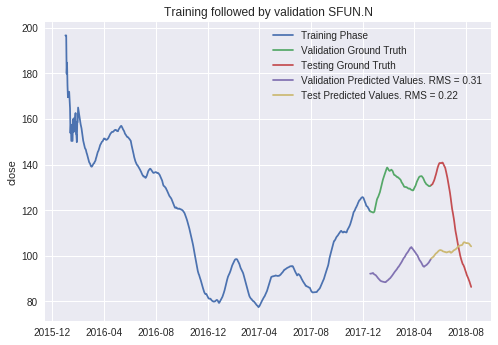

nan_company =====> []
Validation RMS acheived ===>  0.3077179957951851
Test RMS acheived ===>  0.21701641725962842
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 23s - loss: 0.7642
Epoch 2/10
 - 0s - loss: 0.6896
Epoch 3/10
 - 0s - loss: 0.6154
Epoch 4/10
 - 0s - loss: 0.5493
Epoch 5/10
 - 0s - loss: 0.4931
Epoch 6/10
 - 0s - loss: 0.4467
Epoch 7/10
 - 0s - loss: 0.4095
Epoch 8/10
 - 0s - loss: 0.3807
Epoch 9/10
 - 0s - loss: 0.3588
Epoch 10/10
 - 0s - loss: 0.3429
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

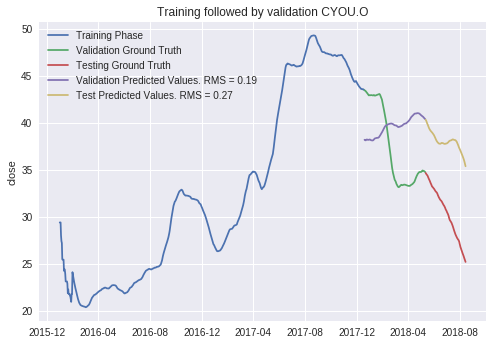

nan_company =====> []
Validation RMS acheived ===>  0.1885500167105982
Test RMS acheived ===>  0.2713006045366057
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 23s - loss: 0.3590
Epoch 2/10
 - 0s - loss: 0.3018
Epoch 3/10
 - 0s - loss: 0.2609
Epoch 4/10
 - 0s - loss: 0.2384
Epoch 5/10
 - 0s - loss: 0.2276
Epoch 6/10
 - 0s - loss: 0.2217
Epoch 7/10
 - 0s - loss: 0.2161
Epoch 8/10
 - 0s - loss: 0.2091
Epoch 9/10
 - 0s - loss: 0.2005
Epoch 10/10
 - 0s - loss: 0.1914
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

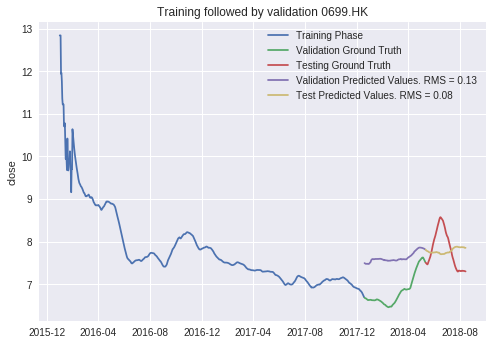

nan_company =====> []
Validation RMS acheived ===>  0.129755428985203
Test RMS acheived ===>  0.076961230165896
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 24s - loss: 0.1156
Epoch 2/10
 - 0s - loss: 0.1089
Epoch 3/10
 - 0s - loss: 0.1025
Epoch 4/10
 - 0s - loss: 0.0972
Epoch 5/10
 - 0s - loss: 0.0931
Epoch 6/10
 - 0s - loss: 0.0902
Epoch 7/10
 - 0s - loss: 0.0881
Epoch 8/10
 - 0s - loss: 0.0867
Epoch 9/10
 - 0s - loss: 0.0856
Epoch 10/10
 - 0s - loss: 0.0845
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

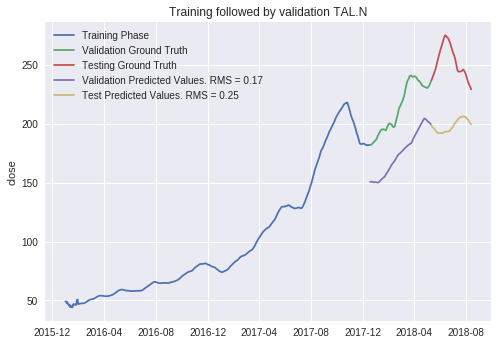

nan_company =====> []
Validation RMS acheived ===>  0.17451537136037054
Test RMS acheived ===>  0.2480679505157666
The train-test accuracy:  0.3087198934533714


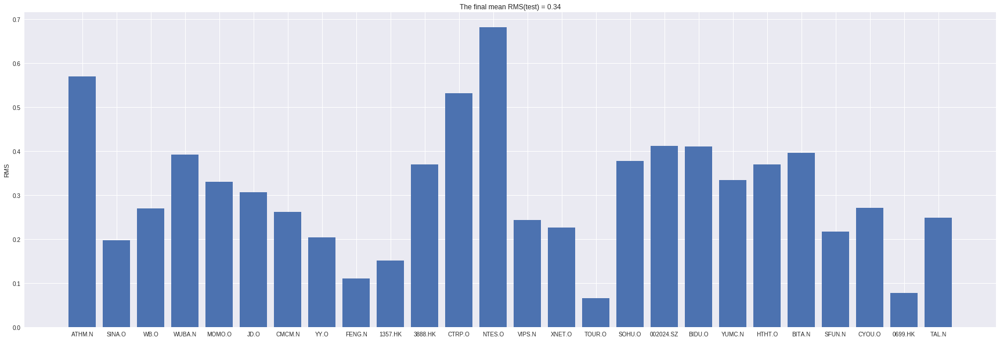

Saved model to disk
Iter Count======================> 3
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 24s - loss: 0.1861
Epoch 2/10
 - 0s - loss: 0.1744
Epoch 3/10
 - 0s - loss: 0.1621
Epoch 4/10
 - 0s - loss: 0.1504
Epoch 5/10
 - 0s - loss: 0.1398
Epoch 6/10
 - 0s - loss: 0.1307
Epoch 7/10
 - 0s - loss: 0.1233
Epoch 8/10
 - 0s - loss: 0.1177
Epoch 9/10
 - 0s - loss: 0.1140
Epoch 10/10
 - 0s - loss: 0.1119
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable para

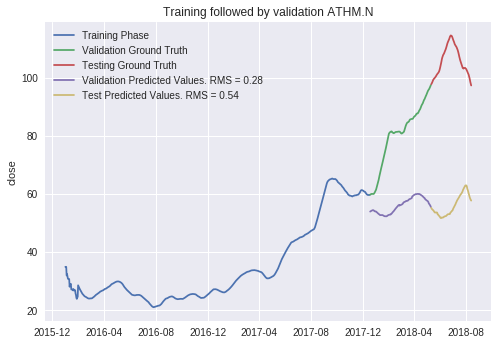

nan_company =====> []
Validation RMS acheived ===>  0.2767165440055509
Test RMS acheived ===>  0.5381527829460274
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 24s - loss: 0.6462
Epoch 2/10
 - 0s - loss: 0.5877
Epoch 3/10
 - 0s - loss: 0.5296
Epoch 4/10
 - 0s - loss: 0.4782
Epoch 5/10
 - 0s - loss: 0.4351
Epoch 6/10
 - 0s - loss: 0.4000
Epoch 7/10
 - 0s - loss: 0.3717
Epoch 8/10
 - 0s - loss: 0.3489
Epoch 9/10
 - 0s - loss: 0.3302
Epoch 10/10
 - 0s - loss: 0.3146
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

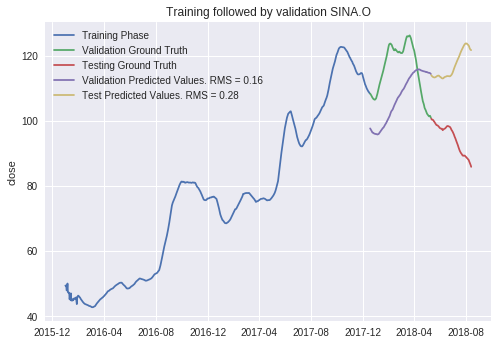

nan_company =====> []
Validation RMS acheived ===>  0.16393093886587337
Test RMS acheived ===>  0.2833263880815385
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 24s - loss: 0.0985
Epoch 2/10
 - 0s - loss: 0.0829
Epoch 3/10
 - 0s - loss: 0.0715
Epoch 4/10
 - 0s - loss: 0.0646
Epoch 5/10
 - 0s - loss: 0.0601
Epoch 6/10
 - 0s - loss: 0.0565
Epoch 7/10
 - 0s - loss: 0.0531
Epoch 8/10
 - 0s - loss: 0.0498
Epoch 9/10
 - 0s - loss: 0.0470
Epoch 10/10
 - 0s - loss: 0.0450
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

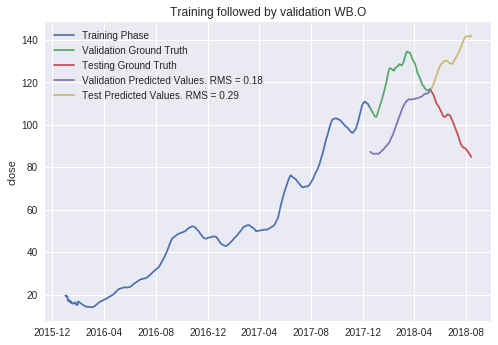

nan_company =====> []
Validation RMS acheived ===>  0.17730550742121576
Test RMS acheived ===>  0.28995998178597326
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 25s - loss: 0.4983
Epoch 2/10
 - 0s - loss: 0.3944
Epoch 3/10
 - 0s - loss: 0.3041
Epoch 4/10
 - 0s - loss: 0.2373
Epoch 5/10
 - 0s - loss: 0.1926
Epoch 6/10
 - 0s - loss: 0.1650
Epoch 7/10
 - 0s - loss: 0.1489
Epoch 8/10
 - 0s - loss: 0.1396
Epoch 9/10
 - 0s - loss: 0.1337
Epoch 10/10
 - 0s - loss: 0.1293
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

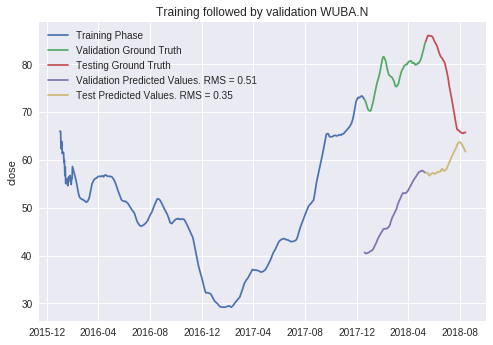

nan_company =====> []
Validation RMS acheived ===>  0.5077789109625009
Test RMS acheived ===>  0.3545477415971666
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 25s - loss: 0.4479
Epoch 2/10
 - 0s - loss: 0.3967
Epoch 3/10
 - 0s - loss: 0.3417
Epoch 4/10
 - 0s - loss: 0.2885
Epoch 5/10
 - 0s - loss: 0.2397
Epoch 6/10
 - 0s - loss: 0.1973
Epoch 7/10
 - 0s - loss: 0.1629
Epoch 8/10
 - 0s - loss: 0.1377
Epoch 9/10
 - 0s - loss: 0.1229
Epoch 10/10
 - 0s - loss: 0.1186
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

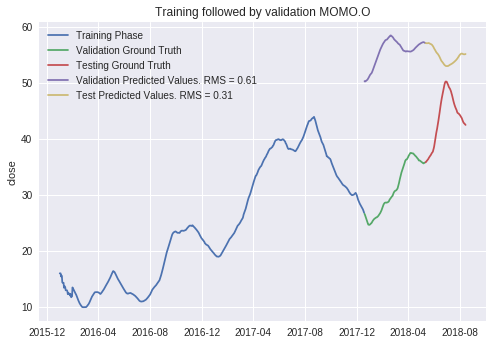

nan_company =====> []
Validation RMS acheived ===>  0.6138185734293939
Test RMS acheived ===>  0.3098908824854898
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 25s - loss: 0.2412
Epoch 2/10
 - 0s - loss: 0.2138
Epoch 3/10
 - 0s - loss: 0.1912
Epoch 4/10
 - 0s - loss: 0.1731
Epoch 5/10
 - 0s - loss: 0.1576
Epoch 6/10
 - 0s - loss: 0.1436
Epoch 7/10
 - 0s - loss: 0.1313
Epoch 8/10
 - 0s - loss: 0.1216
Epoch 9/10
 - 0s - loss: 0.1149
Epoch 10/10
 - 0s - loss: 0.1113
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

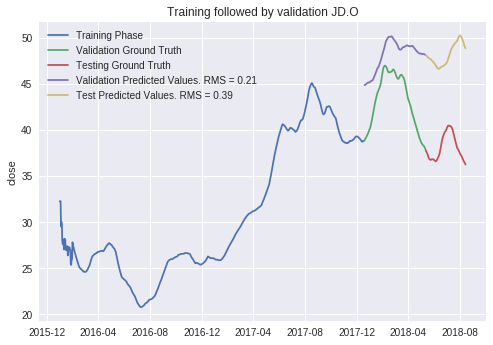

nan_company =====> []
Validation RMS acheived ===>  0.21024475328007683
Test RMS acheived ===>  0.3893915302654065
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 26s - loss: 1.0246
Epoch 2/10
 - 0s - loss: 0.8402
Epoch 3/10
 - 0s - loss: 0.6832
Epoch 4/10
 - 0s - loss: 0.5711
Epoch 5/10
 - 0s - loss: 0.4988
Epoch 6/10
 - 0s - loss: 0.4540
Epoch 7/10
 - 0s - loss: 0.4239
Epoch 8/10
 - 0s - loss: 0.3992
Epoch 9/10
 - 0s - loss: 0.3749
Epoch 10/10
 - 0s - loss: 0.3496
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

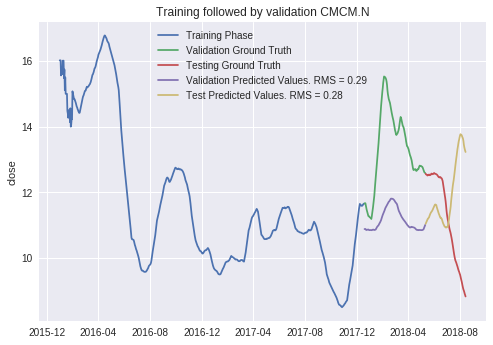

nan_company =====> []
Validation RMS acheived ===>  0.28661566682472667
Test RMS acheived ===>  0.28285423696405626
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 26s - loss: 0.1409
Epoch 2/10
 - 0s - loss: 0.1240
Epoch 3/10
 - 0s - loss: 0.1067
Epoch 4/10
 - 0s - loss: 0.0907
Epoch 5/10
 - 0s - loss: 0.0765
Epoch 6/10
 - 0s - loss: 0.0643
Epoch 7/10
 - 0s - loss: 0.0546
Epoch 8/10
 - 0s - loss: 0.0477
Epoch 9/10
 - 0s - loss: 0.0440
Epoch 10/10
 - 0s - loss: 0.0436
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

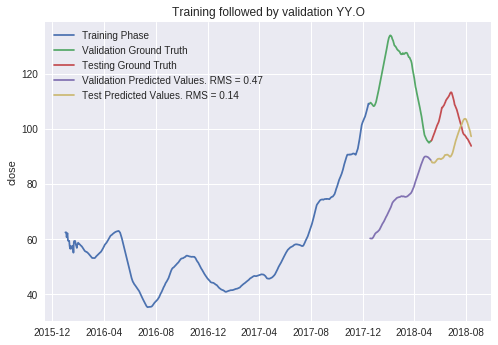

nan_company =====> []
Validation RMS acheived ===>  0.4718591413571571
Test RMS acheived ===>  0.13964462275801373
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 26s - loss: 0.3701
Epoch 2/10
 - 0s - loss: 0.3335
Epoch 3/10
 - 0s - loss: 0.2990
Epoch 4/10
 - 0s - loss: 0.2701
Epoch 5/10
 - 0s - loss: 0.2470
Epoch 6/10
 - 0s - loss: 0.2292
Epoch 7/10
 - 0s - loss: 0.2159
Epoch 8/10
 - 0s - loss: 0.2062
Epoch 9/10
 - 0s - loss: 0.1992
Epoch 10/10
 - 0s - loss: 0.1943
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

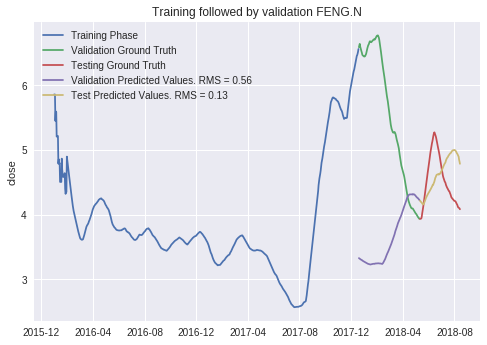

nan_company =====> []
Validation RMS acheived ===>  0.5638533050519976
Test RMS acheived ===>  0.12598719148024592
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 26s - loss: 1.1883
Epoch 2/10
 - 0s - loss: 1.1311
Epoch 3/10
 - 0s - loss: 1.0699
Epoch 4/10
 - 0s - loss: 1.0101
Epoch 5/10
 - 0s - loss: 0.9534
Epoch 6/10
 - 0s - loss: 0.9000
Epoch 7/10
 - 0s - loss: 0.8501
Epoch 8/10
 - 0s - loss: 0.8033
Epoch 9/10
 - 0s - loss: 0.7595
Epoch 10/10
 - 0s - loss: 0.7185
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

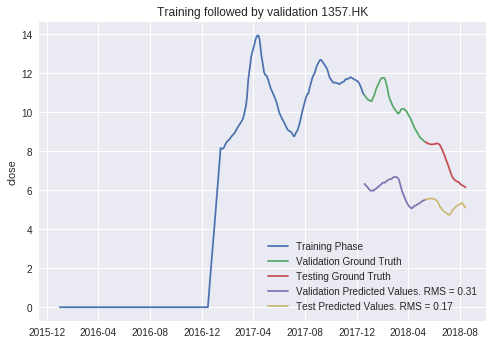

nan_company =====> []
Validation RMS acheived ===>  0.3121311632253366
Test RMS acheived ===>  0.17087809121229106
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 27s - loss: 0.2658
Epoch 2/10
 - 0s - loss: 0.2471
Epoch 3/10
 - 0s - loss: 0.2285
Epoch 4/10
 - 0s - loss: 0.2124
Epoch 5/10
 - 0s - loss: 0.1995
Epoch 6/10
 - 0s - loss: 0.1903
Epoch 7/10
 - 0s - loss: 0.1848
Epoch 8/10
 - 0s - loss: 0.1824
Epoch 9/10
 - 0s - loss: 0.1822
Epoch 10/10
 - 0s - loss: 0.1831
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

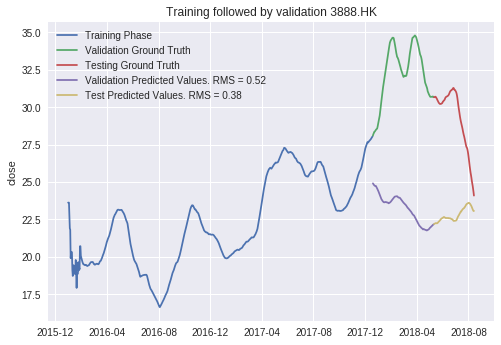

nan_company =====> []
Validation RMS acheived ===>  0.5158859135407157
Test RMS acheived ===>  0.3840228505581306
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 27s - loss: 0.5025
Epoch 2/10
 - 0s - loss: 0.4414
Epoch 3/10
 - 0s - loss: 0.3814
Epoch 4/10
 - 0s - loss: 0.3305
Epoch 5/10
 - 0s - loss: 0.2917
Epoch 6/10
 - 0s - loss: 0.2657
Epoch 7/10
 - 0s - loss: 0.2507
Epoch 8/10
 - 0s - loss: 0.2430
Epoch 9/10
 - 0s - loss: 0.2383
Epoch 10/10
 - 0s - loss: 0.2333
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

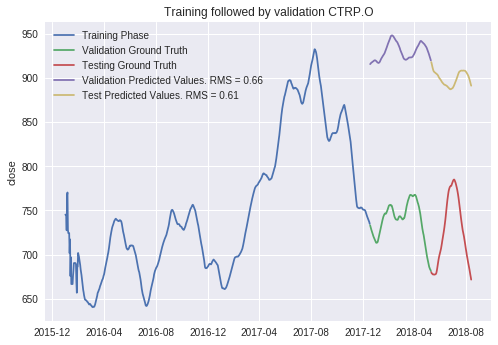

nan_company =====> []
Validation RMS acheived ===>  0.6598850726344629
Test RMS acheived ===>  0.6092118045447787
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 27s - loss: 0.1672
Epoch 2/10
 - 0s - loss: 0.1518
Epoch 3/10
 - 0s - loss: 0.1381
Epoch 4/10
 - 0s - loss: 0.1279
Epoch 5/10
 - 0s - loss: 0.1210
Epoch 6/10
 - 0s - loss: 0.1166
Epoch 7/10
 - 0s - loss: 0.1134
Epoch 8/10
 - 0s - loss: 0.1106
Epoch 9/10
 - 0s - loss: 0.1077
Epoch 10/10
 - 0s - loss: 0.1044
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

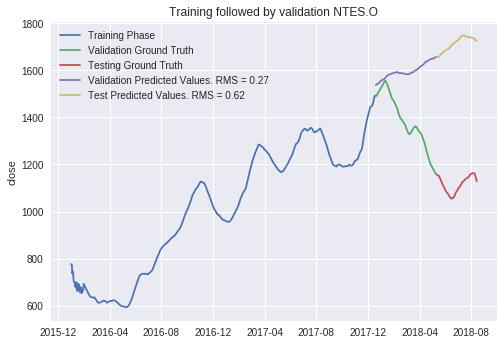

nan_company =====> []
Validation RMS acheived ===>  0.26842507340937855
Test RMS acheived ===>  0.6225954583982061
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 28s - loss: 0.6275
Epoch 2/10
 - 0s - loss: 0.4942
Epoch 3/10
 - 0s - loss: 0.3879
Epoch 4/10
 - 0s - loss: 0.3222
Epoch 5/10
 - 0s - loss: 0.2925
Epoch 6/10
 - 0s - loss: 0.2870
Epoch 7/10
 - 0s - loss: 0.2929
Epoch 8/10
 - 0s - loss: 0.3001
Epoch 9/10
 - 0s - loss: 0.3030
Epoch 10/10
 - 0s - loss: 0.3001
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

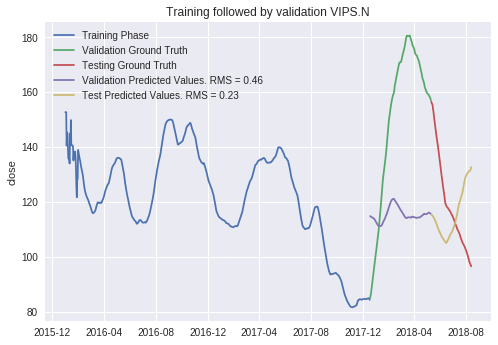

nan_company =====> []
Validation RMS acheived ===>  0.4579481473103747
Test RMS acheived ===>  0.2344401799341997
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 28s - loss: 0.1413
Epoch 2/10
 - 0s - loss: 0.1148
Epoch 3/10
 - 0s - loss: 0.0906
Epoch 4/10
 - 0s - loss: 0.0718
Epoch 5/10
 - 0s - loss: 0.0583
Epoch 6/10
 - 0s - loss: 0.0494
Epoch 7/10
 - 0s - loss: 0.0439
Epoch 8/10
 - 0s - loss: 0.0407
Epoch 9/10
 - 0s - loss: 0.0389
Epoch 10/10
 - 0s - loss: 0.0379
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

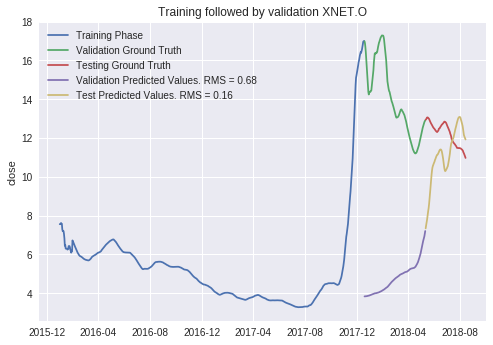

nan_company =====> []
Validation RMS acheived ===>  0.6810868154034929
Test RMS acheived ===>  0.16025909781436018
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 29s - loss: 0.5081
Epoch 2/10
 - 0s - loss: 0.4443
Epoch 3/10
 - 0s - loss: 0.3862
Epoch 4/10
 - 0s - loss: 0.3402
Epoch 5/10
 - 0s - loss: 0.3061
Epoch 6/10
 - 0s - loss: 0.2817
Epoch 7/10
 - 0s - loss: 0.2643
Epoch 8/10
 - 0s - loss: 0.2517
Epoch 9/10
 - 0s - loss: 0.2423
Epoch 10/10
 - 0s - loss: 0.2349
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

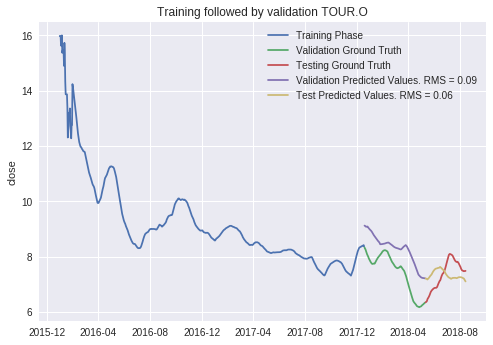

nan_company =====> []
Validation RMS acheived ===>  0.09421532489497562
Test RMS acheived ===>  0.059552906506925095
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 29s - loss: 0.5823
Epoch 2/10
 - 0s - loss: 0.4961
Epoch 3/10
 - 0s - loss: 0.4119
Epoch 4/10
 - 0s - loss: 0.3395
Epoch 5/10
 - 0s - loss: 0.2814
Epoch 6/10
 - 0s - loss: 0.2377
Epoch 7/10
 - 0s - loss: 0.2073
Epoch 8/10
 - 0s - loss: 0.1878
Epoch 9/10
 - 0s - loss: 0.1767
Epoch 10/10
 - 0s - loss: 0.1710
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

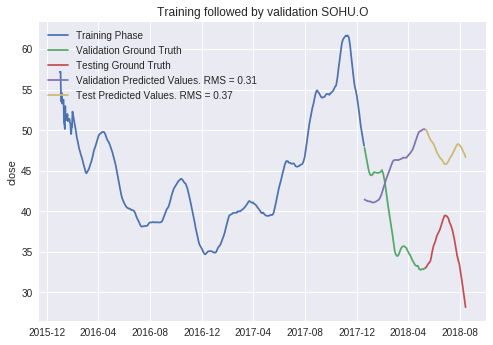

nan_company =====> []
Validation RMS acheived ===>  0.30922424107318347
Test RMS acheived ===>  0.369647241485659
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 29s - loss: 0.3869
Epoch 2/10
 - 0s - loss: 0.3400
Epoch 3/10
 - 0s - loss: 0.2951
Epoch 4/10
 - 0s - loss: 0.2568
Epoch 5/10
 - 0s - loss: 0.2256
Epoch 6/10
 - 0s - loss: 0.2011
Epoch 7/10
 - 0s - loss: 0.1825
Epoch 8/10
 - 0s - loss: 0.1690
Epoch 9/10
 - 0s - loss: 0.1598
Epoch 10/10
 - 0s - loss: 0.1542
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
To

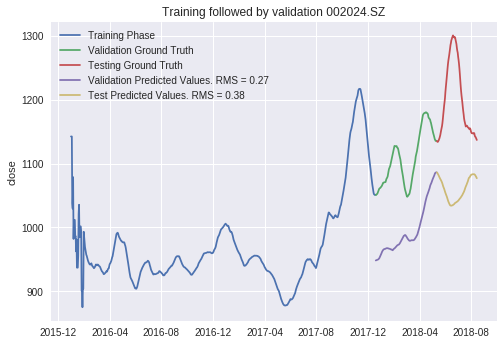

nan_company =====> []
Validation RMS acheived ===>  0.2749870995493217
Test RMS acheived ===>  0.37882700833984445
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 30s - loss: 0.1331
Epoch 2/10
 - 0s - loss: 0.1168
Epoch 3/10
 - 0s - loss: 0.1024
Epoch 4/10
 - 0s - loss: 0.0917
Epoch 5/10
 - 0s - loss: 0.0847
Epoch 6/10
 - 0s - loss: 0.0807
Epoch 7/10
 - 0s - loss: 0.0788
Epoch 8/10
 - 0s - loss: 0.0780
Epoch 9/10
 - 0s - loss: 0.0777
Epoch 10/10
 - 0s - loss: 0.0773
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

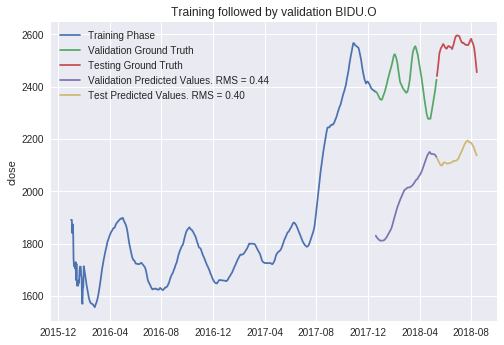

nan_company =====> []
Validation RMS acheived ===>  0.44047351923143996
Test RMS acheived ===>  0.4029471942408245
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 30s - loss: 0.8748
Epoch 2/10
 - 0s - loss: 0.8103
Epoch 3/10
 - 0s - loss: 0.7395
Epoch 4/10
 - 0s - loss: 0.6692
Epoch 5/10
 - 0s - loss: 0.6024
Epoch 6/10
 - 0s - loss: 0.5410
Epoch 7/10
 - 0s - loss: 0.4867
Epoch 8/10
 - 0s - loss: 0.4407
Epoch 9/10
 - 0s - loss: 0.4040
Epoch 10/10
 - 0s - loss: 0.3768
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

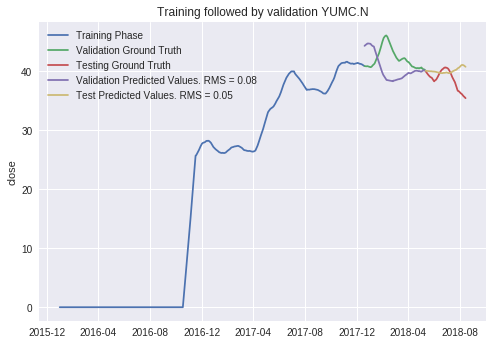

nan_company =====> []
Validation RMS acheived ===>  0.0796088061192928
Test RMS acheived ===>  0.05225465814132206
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 30s - loss: 0.2903
Epoch 2/10
 - 0s - loss: 0.2419
Epoch 3/10
 - 0s - loss: 0.1971
Epoch 4/10
 - 0s - loss: 0.1606
Epoch 5/10
 - 0s - loss: 0.1327
Epoch 6/10
 - 0s - loss: 0.1124
Epoch 7/10
 - 0s - loss: 0.0985
Epoch 8/10
 - 0s - loss: 0.0897
Epoch 9/10
 - 0s - loss: 0.0848
Epoch 10/10
 - 0s - loss: 0.0828
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

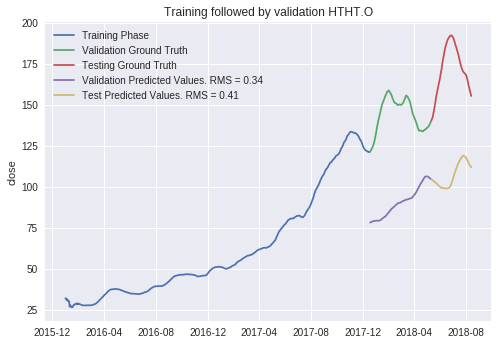

nan_company =====> []
Validation RMS acheived ===>  0.33569776982559185
Test RMS acheived ===>  0.4068030794179809
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 30s - loss: 0.5813
Epoch 2/10
 - 0s - loss: 0.5271
Epoch 3/10
 - 0s - loss: 0.4694
Epoch 4/10
 - 0s - loss: 0.4137
Epoch 5/10
 - 0s - loss: 0.3619
Epoch 6/10
 - 0s - loss: 0.3148
Epoch 7/10
 - 0s - loss: 0.2730
Epoch 8/10
 - 0s - loss: 0.2368
Epoch 9/10
 - 0s - loss: 0.2065
Epoch 10/10
 - 0s - loss: 0.1825
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

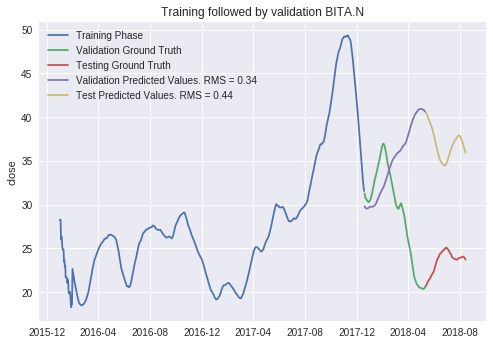

nan_company =====> []
Validation RMS acheived ===>  0.3433947500425617
Test RMS acheived ===>  0.43984543353925054
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 31s - loss: 0.6815
Epoch 2/10
 - 0s - loss: 0.5717
Epoch 3/10
 - 0s - loss: 0.4675
Epoch 4/10
 - 0s - loss: 0.3809
Epoch 5/10
 - 0s - loss: 0.3145
Epoch 6/10
 - 0s - loss: 0.2673
Epoch 7/10
 - 0s - loss: 0.2375
Epoch 8/10
 - 0s - loss: 0.2219
Epoch 9/10
 - 0s - loss: 0.2169
Epoch 10/10
 - 0s - loss: 0.2182
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

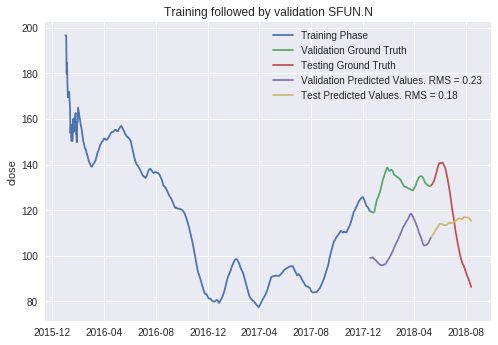

nan_company =====> []
Validation RMS acheived ===>  0.22581896426210948
Test RMS acheived ===>  0.1773506152681385
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 31s - loss: 0.6792
Epoch 2/10
 - 0s - loss: 0.6127
Epoch 3/10
 - 0s - loss: 0.5472
Epoch 4/10
 - 0s - loss: 0.4898
Epoch 5/10
 - 0s - loss: 0.4420
Epoch 6/10
 - 0s - loss: 0.4038
Epoch 7/10
 - 0s - loss: 0.3743
Epoch 8/10
 - 0s - loss: 0.3522
Epoch 9/10
 - 0s - loss: 0.3363
Epoch 10/10
 - 0s - loss: 0.3249
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

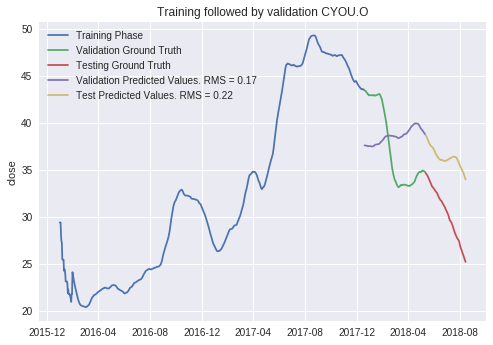

nan_company =====> []
Validation RMS acheived ===>  0.1701917110244187
Test RMS acheived ===>  0.21501016004592935
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 32s - loss: 0.4041
Epoch 2/10
 - 0s - loss: 0.3470
Epoch 3/10
 - 0s - loss: 0.3002
Epoch 4/10
 - 0s - loss: 0.2674
Epoch 5/10
 - 0s - loss: 0.2452
Epoch 6/10
 - 0s - loss: 0.2295
Epoch 7/10
 - 0s - loss: 0.2173
Epoch 8/10
 - 0s - loss: 0.2065
Epoch 9/10
 - 0s - loss: 0.1964
Epoch 10/10
 - 0s - loss: 0.1871
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

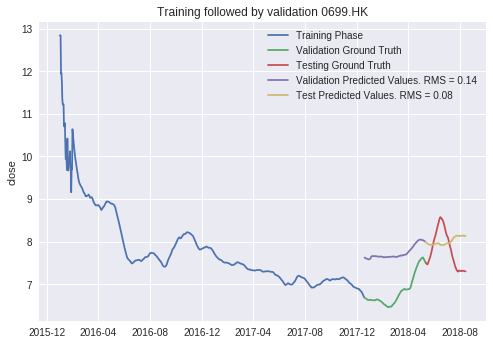

nan_company =====> []
Validation RMS acheived ===>  0.14452639705998407
Test RMS acheived ===>  0.08458364558031402
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 31s - loss: 0.1116
Epoch 2/10
 - 0s - loss: 0.1047
Epoch 3/10
 - 0s - loss: 0.0985
Epoch 4/10
 - 0s - loss: 0.0937
Epoch 5/10
 - 0s - loss: 0.0904
Epoch 6/10
 - 0s - loss: 0.0881
Epoch 7/10
 - 0s - loss: 0.0867
Epoch 8/10
 - 0s - loss: 0.0856
Epoch 9/10
 - 0s - loss: 0.0846
Epoch 10/10
 - 0s - loss: 0.0834
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

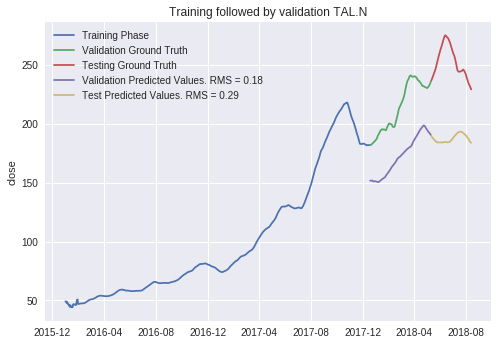

nan_company =====> []
Validation RMS acheived ===>  0.1848975001337403
Test RMS acheived ===>  0.29109821073058323
The train-test accuracy:  0.298964730543179


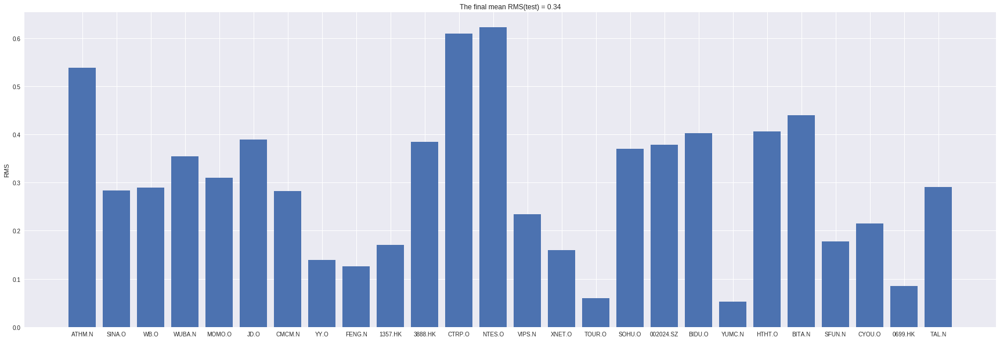

Saved model to disk
Iter Count======================> 4
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 32s - loss: 0.1821
Epoch 2/10
 - 0s - loss: 0.1692
Epoch 3/10
 - 0s - loss: 0.1560
Epoch 4/10
 - 0s - loss: 0.1439
Epoch 5/10
 - 0s - loss: 0.1335
Epoch 6/10
 - 0s - loss: 0.1250
Epoch 7/10
 - 0s - loss: 0.1186
Epoch 8/10
 - 0s - loss: 0.1143
Epoch 9/10
 - 0s - loss: 0.1118
Epoch 10/10
 - 0s - loss: 0.1107
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable para

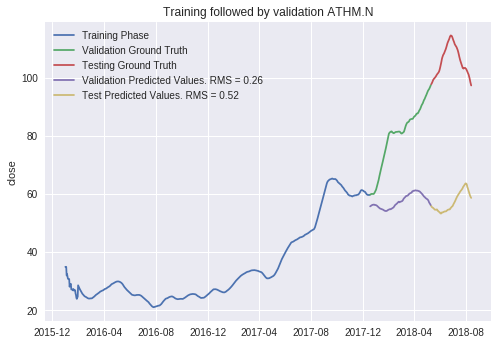

nan_company =====> []
Validation RMS acheived ===>  0.263769791702903
Test RMS acheived ===>  0.5248656627115895
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 32s - loss: 0.5949
Epoch 2/10
 - 0s - loss: 0.5410
Epoch 3/10
 - 0s - loss: 0.4873
Epoch 4/10
 - 0s - loss: 0.4400
Epoch 5/10
 - 0s - loss: 0.4011
Epoch 6/10
 - 0s - loss: 0.3708
Epoch 7/10
 - 0s - loss: 0.3479
Epoch 8/10
 - 0s - loss: 0.3306
Epoch 9/10
 - 0s - loss: 0.3172
Epoch 10/10
 - 0s - loss: 0.3060
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

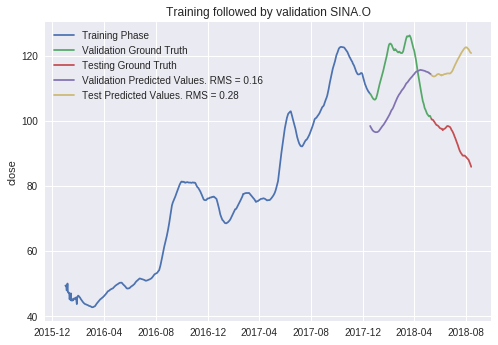

nan_company =====> []
Validation RMS acheived ===>  0.16073095010530214
Test RMS acheived ===>  0.28168214064047764
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 32s - loss: 0.1071
Epoch 2/10
 - 0s - loss: 0.0894
Epoch 3/10
 - 0s - loss: 0.0763
Epoch 4/10
 - 0s - loss: 0.0683
Epoch 5/10
 - 0s - loss: 0.0635
Epoch 6/10
 - 0s - loss: 0.0601
Epoch 7/10
 - 0s - loss: 0.0569
Epoch 8/10
 - 0s - loss: 0.0536
Epoch 9/10
 - 0s - loss: 0.0502
Epoch 10/10
 - 0s - loss: 0.0474
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

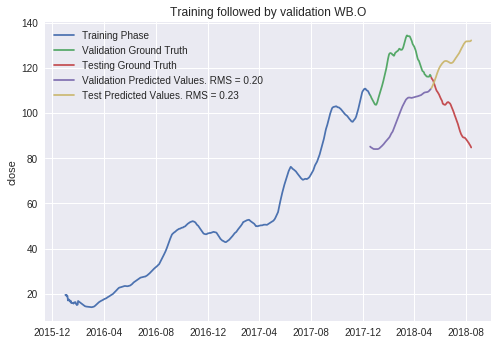

nan_company =====> []
Validation RMS acheived ===>  0.20469064984418228
Test RMS acheived ===>  0.2304321681947334
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 33s - loss: 0.5166
Epoch 2/10
 - 0s - loss: 0.4104
Epoch 3/10
 - 0s - loss: 0.3167
Epoch 4/10
 - 0s - loss: 0.2460
Epoch 5/10
 - 0s - loss: 0.1978
Epoch 6/10
 - 0s - loss: 0.1678
Epoch 7/10
 - 0s - loss: 0.1507
Epoch 8/10
 - 0s - loss: 0.1416
Epoch 9/10
 - 0s - loss: 0.1367
Epoch 10/10
 - 0s - loss: 0.1333
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

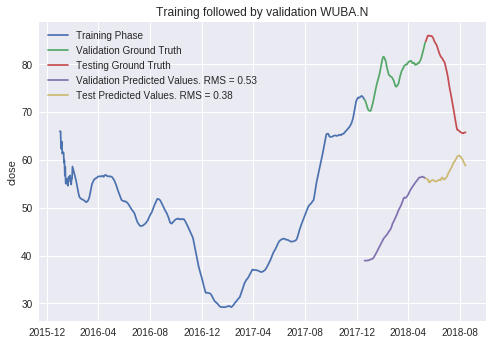

nan_company =====> []
Validation RMS acheived ===>  0.534072870859665
Test RMS acheived ===>  0.3812153148531792
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 33s - loss: 0.4610
Epoch 2/10
 - 0s - loss: 0.4108
Epoch 3/10
 - 0s - loss: 0.3567
Epoch 4/10
 - 0s - loss: 0.3043
Epoch 5/10
 - 0s - loss: 0.2558
Epoch 6/10
 - 0s - loss: 0.2129
Epoch 7/10
 - 0s - loss: 0.1770
Epoch 8/10
 - 0s - loss: 0.1494
Epoch 9/10
 - 0s - loss: 0.1312
Epoch 10/10
 - 0s - loss: 0.1229
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

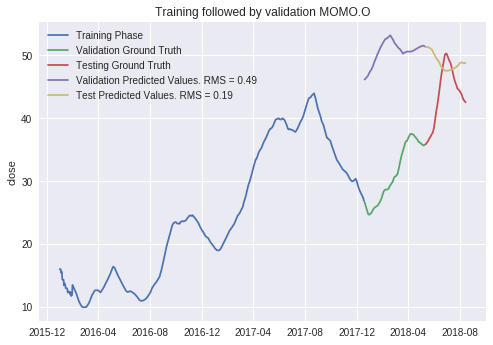

nan_company =====> []
Validation RMS acheived ===>  0.490904182659895
Test RMS acheived ===>  0.19069442407594636
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 33s - loss: 0.2267
Epoch 2/10
 - 0s - loss: 0.2039
Epoch 3/10
 - 0s - loss: 0.1812
Epoch 4/10
 - 0s - loss: 0.1608
Epoch 5/10
 - 0s - loss: 0.1433
Epoch 6/10
 - 0s - loss: 0.1290
Epoch 7/10
 - 0s - loss: 0.1180
Epoch 8/10
 - 0s - loss: 0.1102
Epoch 9/10
 - 0s - loss: 0.1050
Epoch 10/10
 - 0s - loss: 0.1019
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

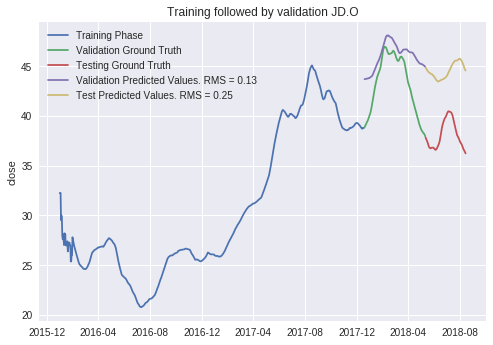

nan_company =====> []
Validation RMS acheived ===>  0.13321079340327138
Test RMS acheived ===>  0.2519925330393276
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 34s - loss: 1.0319
Epoch 2/10
 - 0s - loss: 0.8617
Epoch 3/10
 - 0s - loss: 0.7126
Epoch 4/10
 - 0s - loss: 0.6024
Epoch 5/10
 - 0s - loss: 0.5287
Epoch 6/10
 - 0s - loss: 0.4813
Epoch 7/10
 - 0s - loss: 0.4487
Epoch 8/10
 - 0s - loss: 0.4220
Epoch 9/10
 - 0s - loss: 0.3959
Epoch 10/10
 - 0s - loss: 0.3687
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

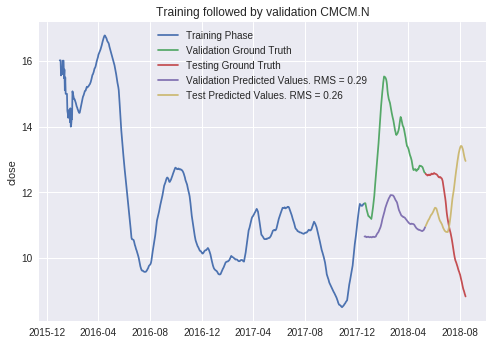

nan_company =====> []
Validation RMS acheived ===>  0.2864465223969423
Test RMS acheived ===>  0.2645159329266471
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 34s - loss: 0.1361
Epoch 2/10
 - 0s - loss: 0.1185
Epoch 3/10
 - 0s - loss: 0.1010
Epoch 4/10
 - 0s - loss: 0.0852
Epoch 5/10
 - 0s - loss: 0.0715
Epoch 6/10
 - 0s - loss: 0.0601
Epoch 7/10
 - 0s - loss: 0.0511
Epoch 8/10
 - 0s - loss: 0.0446
Epoch 9/10
 - 0s - loss: 0.0412
Epoch 10/10
 - 0s - loss: 0.0406
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

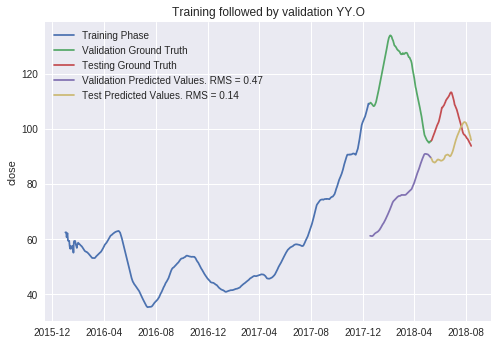

nan_company =====> []
Validation RMS acheived ===>  0.4684957412526975
Test RMS acheived ===>  0.13926731507336712
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 34s - loss: 0.3613
Epoch 2/10
 - 0s - loss: 0.3268
Epoch 3/10
 - 0s - loss: 0.2936
Epoch 4/10
 - 0s - loss: 0.2649
Epoch 5/10
 - 0s - loss: 0.2415
Epoch 6/10
 - 0s - loss: 0.2229
Epoch 7/10
 - 0s - loss: 0.2085
Epoch 8/10
 - 0s - loss: 0.1978
Epoch 9/10
 - 0s - loss: 0.1901
Epoch 10/10
 - 0s - loss: 0.1847
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

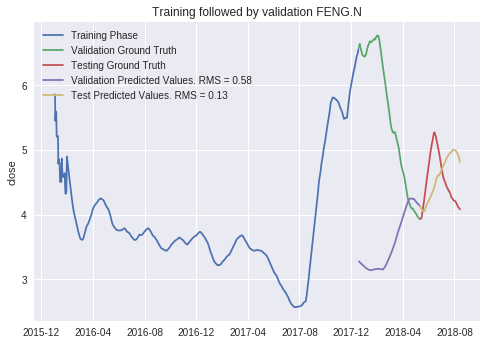

nan_company =====> []
Validation RMS acheived ===>  0.5821402059047998
Test RMS acheived ===>  0.1343706432489956
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 35s - loss: 1.1686
Epoch 2/10
 - 0s - loss: 1.1092
Epoch 3/10
 - 0s - loss: 1.0456
Epoch 4/10
 - 0s - loss: 0.9834
Epoch 5/10
 - 0s - loss: 0.9240
Epoch 6/10
 - 0s - loss: 0.8679
Epoch 7/10
 - 0s - loss: 0.8151
Epoch 8/10
 - 0s - loss: 0.7654
Epoch 9/10
 - 0s - loss: 0.7187
Epoch 10/10
 - 0s - loss: 0.6746
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

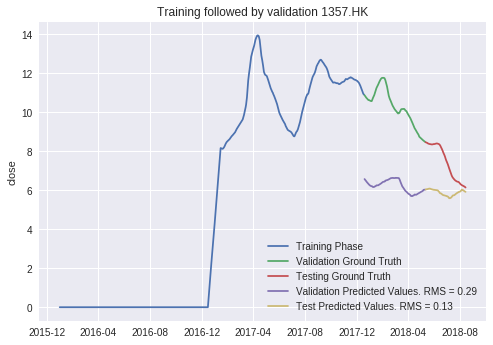

nan_company =====> []
Validation RMS acheived ===>  0.29466176301350494
Test RMS acheived ===>  0.1279361111698597
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 35s - loss: 0.2747
Epoch 2/10
 - 0s - loss: 0.2532
Epoch 3/10
 - 0s - loss: 0.2321
Epoch 4/10
 - 0s - loss: 0.2138
Epoch 5/10
 - 0s - loss: 0.1993
Epoch 6/10
 - 0s - loss: 0.1888
Epoch 7/10
 - 0s - loss: 0.1822
Epoch 8/10
 - 0s - loss: 0.1790
Epoch 9/10
 - 0s - loss: 0.1783
Epoch 10/10
 - 0s - loss: 0.1788
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

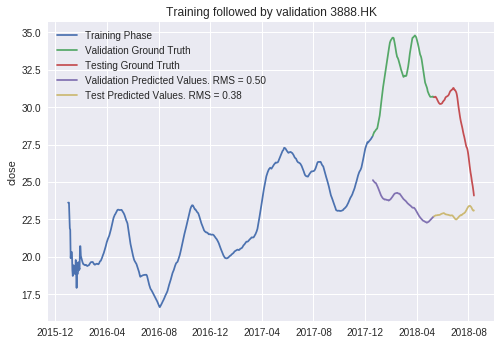

nan_company =====> []
Validation RMS acheived ===>  0.49663733737963783
Test RMS acheived ===>  0.37616121224451915
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 35s - loss: 0.4492
Epoch 2/10
 - 0s - loss: 0.3904
Epoch 3/10
 - 0s - loss: 0.3323
Epoch 4/10
 - 0s - loss: 0.2833
Epoch 5/10
 - 0s - loss: 0.2470
Epoch 6/10
 - 0s - loss: 0.2248
Epoch 7/10
 - 0s - loss: 0.2151
Epoch 8/10
 - 0s - loss: 0.2133
Epoch 9/10
 - 0s - loss: 0.2135
Epoch 10/10
 - 0s - loss: 0.2113
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

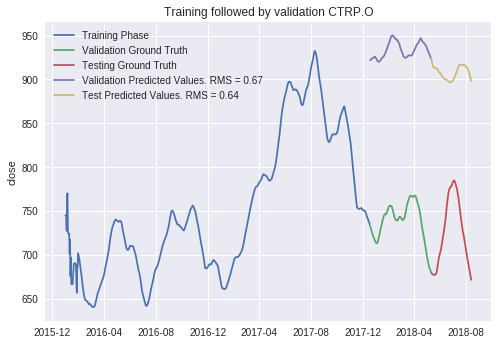

nan_company =====> []
Validation RMS acheived ===>  0.6720244847250249
Test RMS acheived ===>  0.6362394938603231
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 35s - loss: 0.1569
Epoch 2/10
 - 0s - loss: 0.1423
Epoch 3/10
 - 0s - loss: 0.1296
Epoch 4/10
 - 0s - loss: 0.1205
Epoch 5/10
 - 0s - loss: 0.1144
Epoch 6/10
 - 0s - loss: 0.1104
Epoch 7/10
 - 0s - loss: 0.1070
Epoch 8/10
 - 0s - loss: 0.1034
Epoch 9/10
 - 0s - loss: 0.0994
Epoch 10/10
 - 0s - loss: 0.0949
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

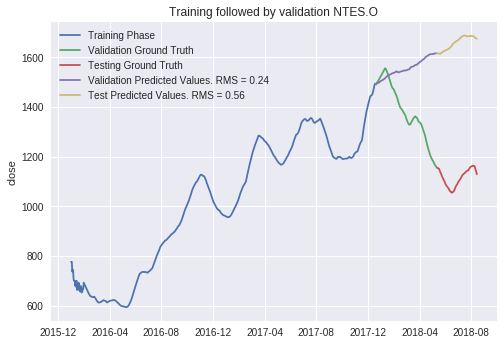

nan_company =====> []
Validation RMS acheived ===>  0.23811971135689555
Test RMS acheived ===>  0.5646667514159336
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 36s - loss: 0.7693
Epoch 2/10
 - 0s - loss: 0.6084
Epoch 3/10
 - 0s - loss: 0.4748
Epoch 4/10
 - 0s - loss: 0.3845
Epoch 5/10
 - 0s - loss: 0.3336
Epoch 6/10
 - 0s - loss: 0.3111
Epoch 7/10
 - 0s - loss: 0.3048
Epoch 8/10
 - 0s - loss: 0.3048
Epoch 9/10
 - 0s - loss: 0.3047
Epoch 10/10
 - 0s - loss: 0.3014
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

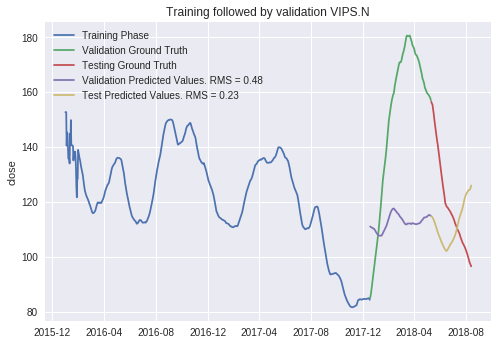

nan_company =====> []
Validation RMS acheived ===>  0.47745525477687634
Test RMS acheived ===>  0.22575470256973748
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 36s - loss: 0.1246
Epoch 2/10
 - 0s - loss: 0.1011
Epoch 3/10
 - 0s - loss: 0.0798
Epoch 4/10
 - 0s - loss: 0.0634
Epoch 5/10
 - 0s - loss: 0.0518
Epoch 6/10
 - 0s - loss: 0.0441
Epoch 7/10
 - 0s - loss: 0.0392
Epoch 8/10
 - 0s - loss: 0.0361
Epoch 9/10
 - 0s - loss: 0.0342
Epoch 10/10
 - 0s - loss: 0.0335
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

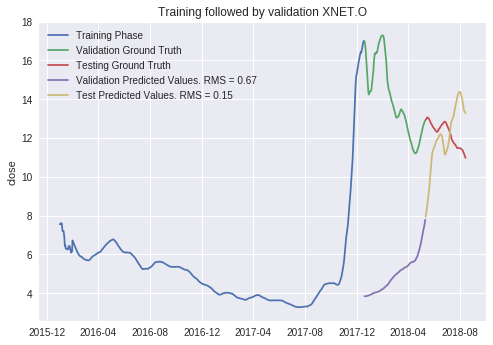

nan_company =====> []
Validation RMS acheived ===>  0.6705832279447324
Test RMS acheived ===>  0.1535147674716279
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 36s - loss: 0.4954
Epoch 2/10
 - 0s - loss: 0.4382
Epoch 3/10
 - 0s - loss: 0.3818
Epoch 4/10
 - 0s - loss: 0.3331
Epoch 5/10
 - 0s - loss: 0.2940
Epoch 6/10
 - 0s - loss: 0.2649
Epoch 7/10
 - 0s - loss: 0.2453
Epoch 8/10
 - 0s - loss: 0.2335
Epoch 9/10
 - 0s - loss: 0.2274
Epoch 10/10
 - 0s - loss: 0.2248
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

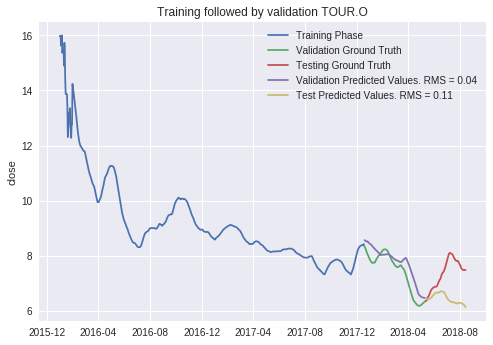

nan_company =====> []
Validation RMS acheived ===>  0.04338561257716745
Test RMS acheived ===>  0.11212293278613131
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 37s - loss: 0.7313
Epoch 2/10
 - 0s - loss: 0.6277
Epoch 3/10
 - 0s - loss: 0.5250
Epoch 4/10
 - 0s - loss: 0.4347
Epoch 5/10
 - 0s - loss: 0.3599
Epoch 6/10
 - 0s - loss: 0.3011
Epoch 7/10
 - 0s - loss: 0.2573
Epoch 8/10
 - 0s - loss: 0.2268
Epoch 9/10
 - 0s - loss: 0.2071
Epoch 10/10
 - 0s - loss: 0.1953
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

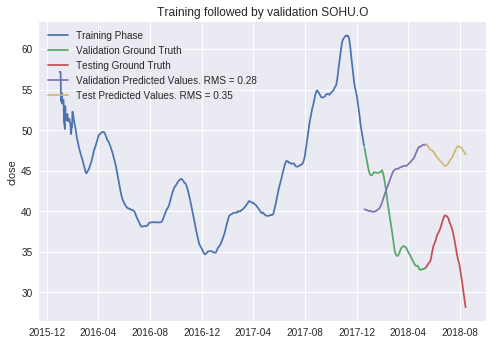

nan_company =====> []
Validation RMS acheived ===>  0.28316613408732055
Test RMS acheived ===>  0.35453987181487545
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 37s - loss: 0.4169
Epoch 2/10
 - 0s - loss: 0.3679
Epoch 3/10
 - 0s - loss: 0.3201
Epoch 4/10
 - 0s - loss: 0.2786
Epoch 5/10
 - 0s - loss: 0.2442
Epoch 6/10
 - 0s - loss: 0.2164
Epoch 7/10
 - 0s - loss: 0.1946
Epoch 8/10
 - 0s - loss: 0.1778
Epoch 9/10
 - 0s - loss: 0.1655
Epoch 10/10
 - 0s - loss: 0.1573
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       


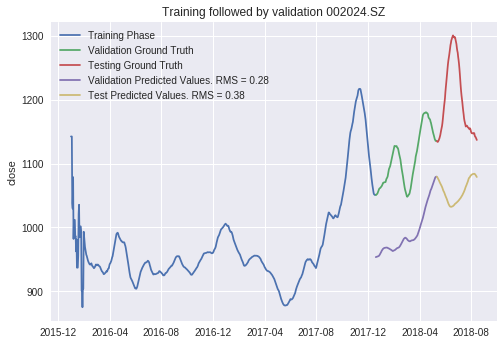

nan_company =====> []
Validation RMS acheived ===>  0.2813933458711316
Test RMS acheived ===>  0.3828291009933312
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 37s - loss: 0.1207
Epoch 2/10
 - 0s - loss: 0.1055
Epoch 3/10
 - 0s - loss: 0.0925
Epoch 4/10
 - 0s - loss: 0.0835
Epoch 5/10
 - 0s - loss: 0.0784
Epoch 6/10
 - 0s - loss: 0.0764
Epoch 7/10
 - 0s - loss: 0.0761
Epoch 8/10
 - 0s - loss: 0.0764
Epoch 9/10
 - 0s - loss: 0.0764
Epoch 10/10
 - 0s - loss: 0.0758
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

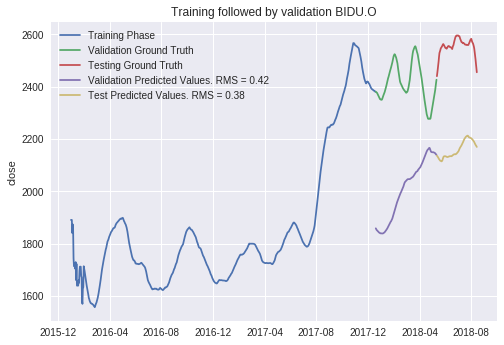

nan_company =====> []
Validation RMS acheived ===>  0.41668876561118173
Test RMS acheived ===>  0.3815611645506232
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 38s - loss: 0.8327
Epoch 2/10
 - 0s - loss: 0.7660
Epoch 3/10
 - 0s - loss: 0.6938
Epoch 4/10
 - 0s - loss: 0.6236
Epoch 5/10
 - 0s - loss: 0.5587
Epoch 6/10
 - 0s - loss: 0.5012
Epoch 7/10
 - 0s - loss: 0.4526
Epoch 8/10
 - 0s - loss: 0.4139
Epoch 9/10
 - 0s - loss: 0.3851
Epoch 10/10
 - 0s - loss: 0.3651
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

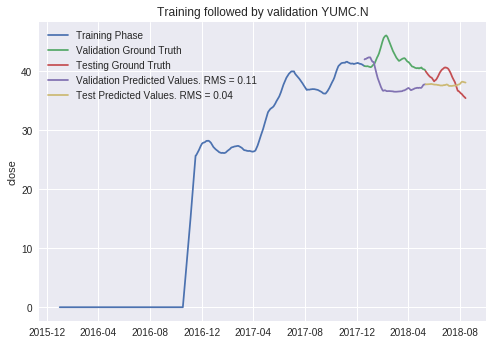

nan_company =====> []
Validation RMS acheived ===>  0.11281573345564
Test RMS acheived ===>  0.04162125906870065
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 38s - loss: 0.3103
Epoch 2/10
 - 0s - loss: 0.2547
Epoch 3/10
 - 0s - loss: 0.2036
Epoch 4/10
 - 0s - loss: 0.1627
Epoch 5/10
 - 0s - loss: 0.1321
Epoch 6/10
 - 0s - loss: 0.1106
Epoch 7/10
 - 0s - loss: 0.0965
Epoch 8/10
 - 0s - loss: 0.0880
Epoch 9/10
 - 0s - loss: 0.0839
Epoch 10/10
 - 0s - loss: 0.0827
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

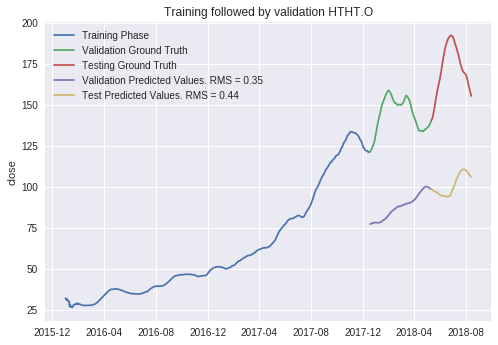

nan_company =====> []
Validation RMS acheived ===>  0.34964223230674335
Test RMS acheived ===>  0.4420422209027814
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 39s - loss: 0.6927
Epoch 2/10
 - 0s - loss: 0.6281
Epoch 3/10
 - 0s - loss: 0.5597
Epoch 4/10
 - 0s - loss: 0.4941
Epoch 5/10
 - 0s - loss: 0.4332
Epoch 6/10
 - 0s - loss: 0.3777
Epoch 7/10
 - 0s - loss: 0.3282
Epoch 8/10
 - 0s - loss: 0.2850
Epoch 9/10
 - 0s - loss: 0.2481
Epoch 10/10
 - 0s - loss: 0.2178
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

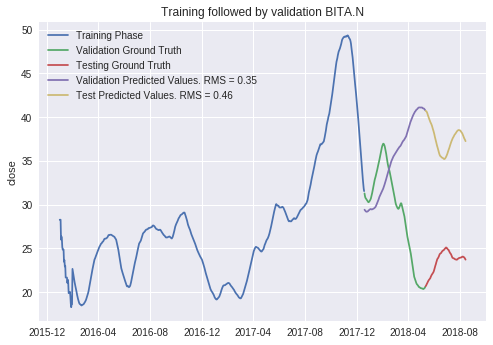

nan_company =====> []
Validation RMS acheived ===>  0.35157311014870285
Test RMS acheived ===>  0.45777224706562475
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 39s - loss: 0.8256
Epoch 2/10
 - 0s - loss: 0.6959
Epoch 3/10
 - 0s - loss: 0.5728
Epoch 4/10
 - 0s - loss: 0.4696
Epoch 5/10
 - 0s - loss: 0.3881
Epoch 6/10
 - 0s - loss: 0.3265
Epoch 7/10
 - 0s - loss: 0.2818
Epoch 8/10
 - 0s - loss: 0.2511
Epoch 9/10
 - 0s - loss: 0.2319
Epoch 10/10
 - 0s - loss: 0.2216
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

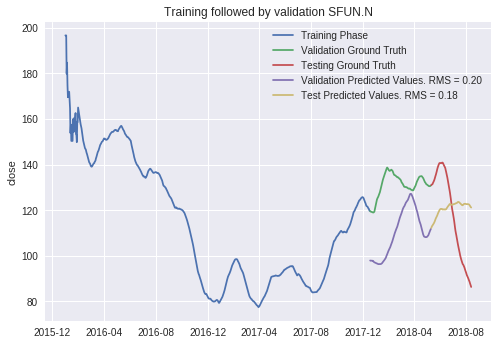

nan_company =====> []
Validation RMS acheived ===>  0.1975562789956646
Test RMS acheived ===>  0.176176580258622
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 39s - loss: 0.5965
Epoch 2/10
 - 0s - loss: 0.5415
Epoch 3/10
 - 0s - loss: 0.4867
Epoch 4/10
 - 0s - loss: 0.4385
Epoch 5/10
 - 0s - loss: 0.3988
Epoch 6/10
 - 0s - loss: 0.3678
Epoch 7/10
 - 0s - loss: 0.3448
Epoch 8/10
 - 0s - loss: 0.3285
Epoch 9/10
 - 0s - loss: 0.3171
Epoch 10/10
 - 0s - loss: 0.3089
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

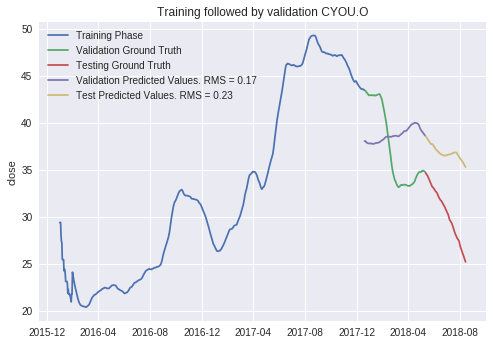

nan_company =====> []
Validation RMS acheived ===>  0.17023395638966407
Test RMS acheived ===>  0.2342838889415221
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 39s - loss: 0.4164
Epoch 2/10
 - 0s - loss: 0.3550
Epoch 3/10
 - 0s - loss: 0.3023
Epoch 4/10
 - 0s - loss: 0.2632
Epoch 5/10
 - 0s - loss: 0.2355
Epoch 6/10
 - 0s - loss: 0.2156
Epoch 7/10
 - 0s - loss: 0.2005
Epoch 8/10
 - 0s - loss: 0.1884
Epoch 9/10
 - 0s - loss: 0.1782
Epoch 10/10
 - 0s - loss: 0.1699
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

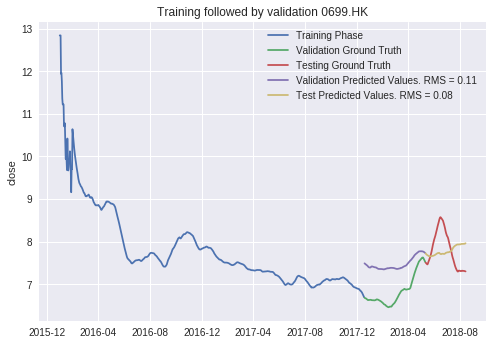

nan_company =====> []
Validation RMS acheived ===>  0.10580133802798304
Test RMS acheived ===>  0.0805298301688998
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 40s - loss: 0.1119
Epoch 2/10
 - 0s - loss: 0.1040
Epoch 3/10
 - 0s - loss: 0.0971
Epoch 4/10
 - 0s - loss: 0.0922
Epoch 5/10
 - 0s - loss: 0.0890
Epoch 6/10
 - 0s - loss: 0.0870
Epoch 7/10
 - 0s - loss: 0.0858
Epoch 8/10
 - 0s - loss: 0.0849
Epoch 9/10
 - 0s - loss: 0.0838
Epoch 10/10
 - 0s - loss: 0.0825
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

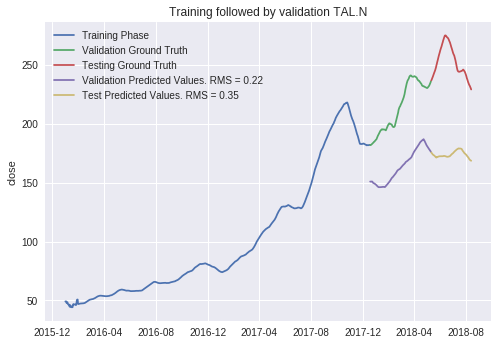

nan_company =====> []
Validation RMS acheived ===>  0.22398231299116145
Test RMS acheived ===>  0.3473649074328208
The train-test accuracy:  0.28823666067231535


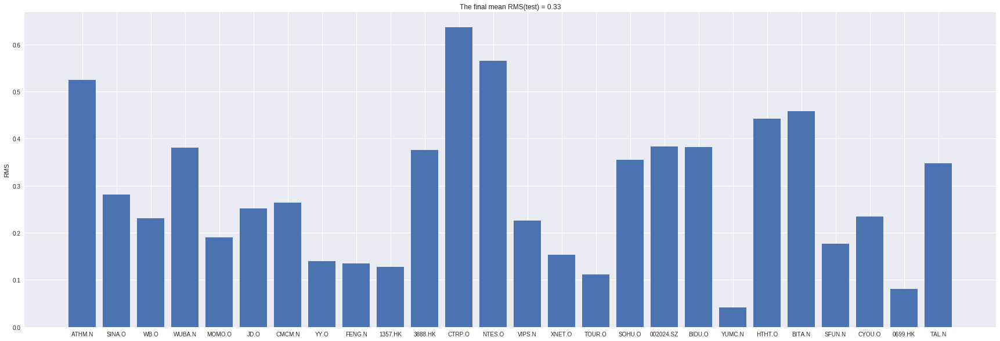

Saved model to disk
Iter Count======================> 5
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 40s - loss: 0.1817
Epoch 2/10
 - 0s - loss: 0.1672
Epoch 3/10
 - 0s - loss: 0.1528
Epoch 4/10
 - 0s - loss: 0.1400
Epoch 5/10
 - 0s - loss: 0.1294
Epoch 6/10
 - 0s - loss: 0.1211
Epoch 7/10
 - 0s - loss: 0.1151
Epoch 8/10
 - 0s - loss: 0.1115
Epoch 9/10
 - 0s - loss: 0.1098
Epoch 10/10
 - 0s - loss: 0.1094
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable para

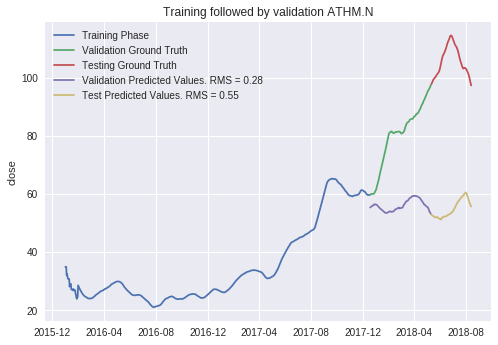

nan_company =====> []
Validation RMS acheived ===>  0.28136730650041897
Test RMS acheived ===>  0.5494486356848214
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 40s - loss: 0.5795
Epoch 2/10
 - 0s - loss: 0.5260
Epoch 3/10
 - 0s - loss: 0.4727
Epoch 4/10
 - 0s - loss: 0.4259
Epoch 5/10
 - 0s - loss: 0.3880
Epoch 6/10
 - 0s - loss: 0.3592
Epoch 7/10
 - 0s - loss: 0.3385
Epoch 8/10
 - 0s - loss: 0.3241
Epoch 9/10
 - 0s - loss: 0.3135
Epoch 10/10
 - 0s - loss: 0.3049
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

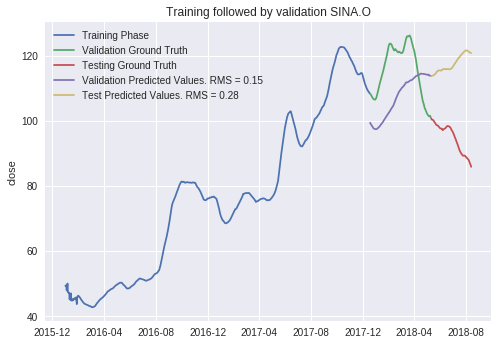

nan_company =====> []
Validation RMS acheived ===>  0.1534405836949241
Test RMS acheived ===>  0.28437603377665177
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 40s - loss: 0.1205
Epoch 2/10
 - 0s - loss: 0.0987
Epoch 3/10
 - 0s - loss: 0.0824
Epoch 4/10
 - 0s - loss: 0.0727
Epoch 5/10
 - 0s - loss: 0.0675
Epoch 6/10
 - 0s - loss: 0.0643
Epoch 7/10
 - 0s - loss: 0.0613
Epoch 8/10
 - 0s - loss: 0.0578
Epoch 9/10
 - 0s - loss: 0.0539
Epoch 10/10
 - 0s - loss: 0.0499
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

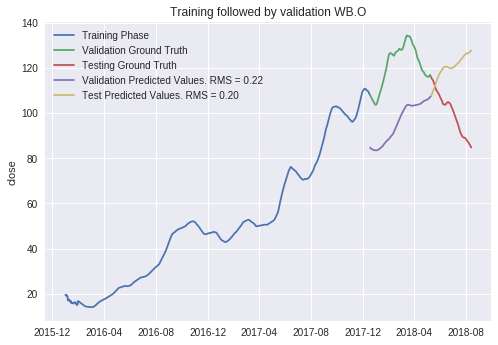

nan_company =====> []
Validation RMS acheived ===>  0.2193680088683038
Test RMS acheived ===>  0.20270954875705854
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 41s - loss: 0.5781
Epoch 2/10
 - 0s - loss: 0.4565
Epoch 3/10
 - 0s - loss: 0.3482
Epoch 4/10
 - 0s - loss: 0.2662
Epoch 5/10
 - 0s - loss: 0.2105
Epoch 6/10
 - 0s - loss: 0.1769
Epoch 7/10
 - 0s - loss: 0.1593
Epoch 8/10
 - 0s - loss: 0.1516
Epoch 9/10
 - 0s - loss: 0.1488
Epoch 10/10
 - 0s - loss: 0.1475
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

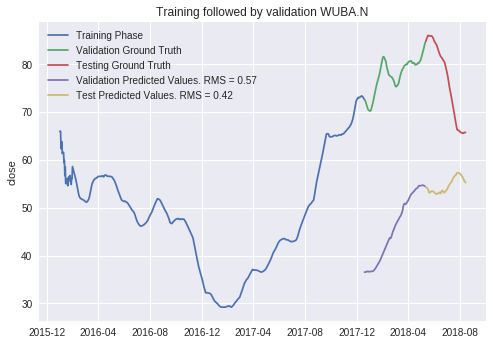

nan_company =====> []
Validation RMS acheived ===>  0.5702798281453174
Test RMS acheived ===>  0.42318542242664986
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 41s - loss: 0.4943
Epoch 2/10
 - 0s - loss: 0.4414
Epoch 3/10
 - 0s - loss: 0.3841
Epoch 4/10
 - 0s - loss: 0.3281
Epoch 5/10
 - 0s - loss: 0.2761
Epoch 6/10
 - 0s - loss: 0.2300
Epoch 7/10
 - 0s - loss: 0.1913
Epoch 8/10
 - 0s - loss: 0.1616
Epoch 9/10
 - 0s - loss: 0.1417
Epoch 10/10
 - 0s - loss: 0.1319
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

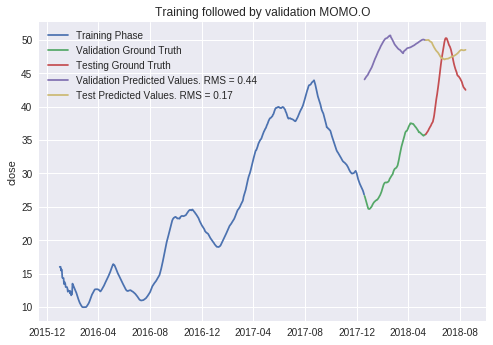

nan_company =====> []
Validation RMS acheived ===>  0.43986208395396215
Test RMS acheived ===>  0.1727846483044375
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 42s - loss: 0.2199
Epoch 2/10
 - 0s - loss: 0.1958
Epoch 3/10
 - 0s - loss: 0.1723
Epoch 4/10
 - 0s - loss: 0.1518
Epoch 5/10
 - 0s - loss: 0.1350
Epoch 6/10
 - 0s - loss: 0.1215
Epoch 7/10
 - 0s - loss: 0.1112
Epoch 8/10
 - 0s - loss: 0.1037
Epoch 9/10
 - 0s - loss: 0.0987
Epoch 10/10
 - 0s - loss: 0.0958
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

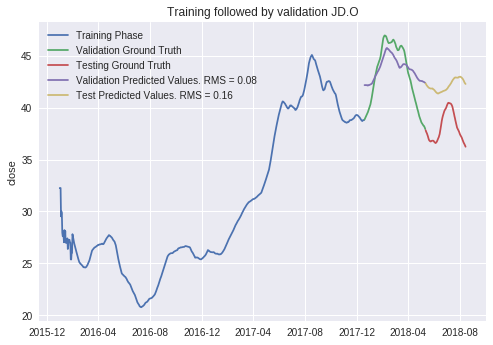

nan_company =====> []
Validation RMS acheived ===>  0.07847933286561536
Test RMS acheived ===>  0.16331921366554983
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 42s - loss: 1.1290
Epoch 2/10
 - 0s - loss: 0.9418
Epoch 3/10
 - 0s - loss: 0.7733
Epoch 4/10
 - 0s - loss: 0.6448
Epoch 5/10
 - 0s - loss: 0.5569
Epoch 6/10
 - 0s - loss: 0.5013
Epoch 7/10
 - 0s - loss: 0.4664
Epoch 8/10
 - 0s - loss: 0.4413
Epoch 9/10
 - 0s - loss: 0.4183
Epoch 10/10
 - 0s - loss: 0.3936
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

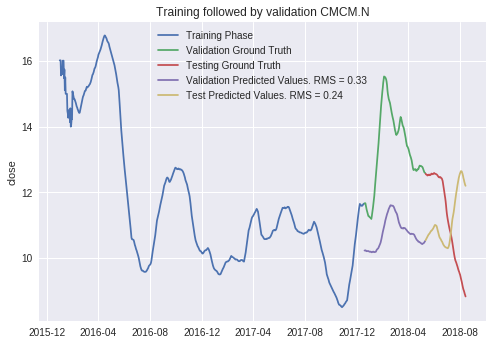

nan_company =====> []
Validation RMS acheived ===>  0.32901149384177725
Test RMS acheived ===>  0.2445484229878523
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 43s - loss: 0.1322
Epoch 2/10
 - 0s - loss: 0.1146
Epoch 3/10
 - 0s - loss: 0.0975
Epoch 4/10
 - 0s - loss: 0.0822
Epoch 5/10
 - 0s - loss: 0.0688
Epoch 6/10
 - 0s - loss: 0.0576
Epoch 7/10
 - 0s - loss: 0.0488
Epoch 8/10
 - 0s - loss: 0.0426
Epoch 9/10
 - 0s - loss: 0.0393
Epoch 10/10
 - 0s - loss: 0.0389
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

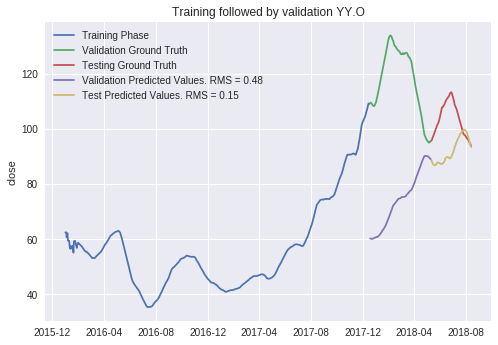

nan_company =====> []
Validation RMS acheived ===>  0.47991926164002713
Test RMS acheived ===>  0.14673853857237706
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 43s - loss: 0.3442
Epoch 2/10
 - 0s - loss: 0.3108
Epoch 3/10
 - 0s - loss: 0.2787
Epoch 4/10
 - 0s - loss: 0.2512
Epoch 5/10
 - 0s - loss: 0.2286
Epoch 6/10
 - 0s - loss: 0.2108
Epoch 7/10
 - 0s - loss: 0.1972
Epoch 8/10
 - 0s - loss: 0.1873
Epoch 9/10
 - 0s - loss: 0.1805
Epoch 10/10
 - 0s - loss: 0.1762
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

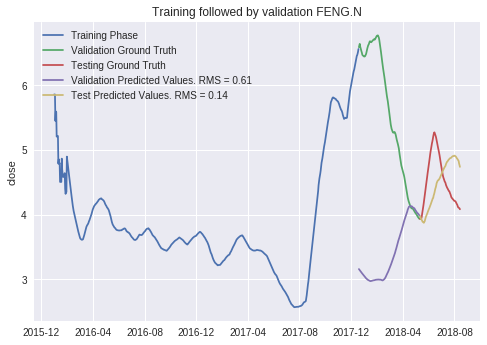

nan_company =====> []
Validation RMS acheived ===>  0.6131498792669899
Test RMS acheived ===>  0.13748152247519937
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 43s - loss: 1.1218
Epoch 2/10
 - 0s - loss: 1.0591
Epoch 3/10
 - 0s - loss: 0.9920
Epoch 4/10
 - 0s - loss: 0.9263
Epoch 5/10
 - 0s - loss: 0.8638
Epoch 6/10
 - 0s - loss: 0.8050
Epoch 7/10
 - 0s - loss: 0.7499
Epoch 8/10
 - 0s - loss: 0.6986
Epoch 9/10
 - 0s - loss: 0.6508
Epoch 10/10
 - 0s - loss: 0.6064
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

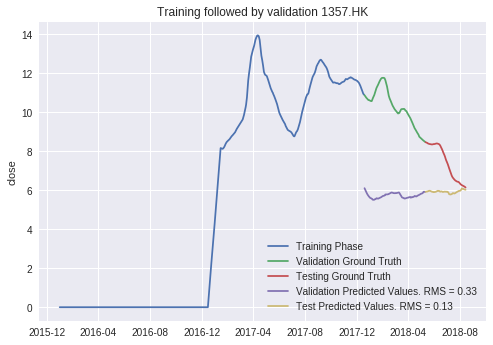

nan_company =====> []
Validation RMS acheived ===>  0.33203078332539276
Test RMS acheived ===>  0.12674369871713825
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 43s - loss: 0.2898
Epoch 2/10
 - 0s - loss: 0.2658
Epoch 3/10
 - 0s - loss: 0.2417
Epoch 4/10
 - 0s - loss: 0.2204
Epoch 5/10
 - 0s - loss: 0.2027
Epoch 6/10
 - 0s - loss: 0.1891
Epoch 7/10
 - 0s - loss: 0.1798
Epoch 8/10
 - 0s - loss: 0.1744
Epoch 9/10
 - 0s - loss: 0.1724
Epoch 10/10
 - 0s - loss: 0.1728
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

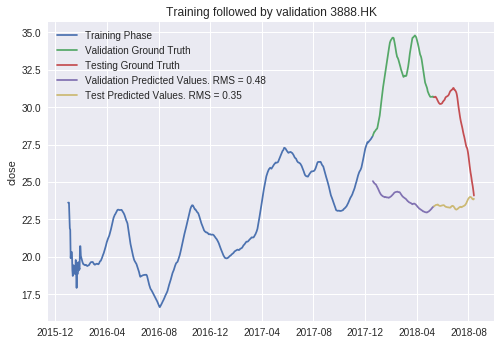

nan_company =====> []
Validation RMS acheived ===>  0.48163452608722446
Test RMS acheived ===>  0.34570142954241445
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 44s - loss: 0.4463
Epoch 2/10
 - 0s - loss: 0.3841
Epoch 3/10
 - 0s - loss: 0.3231
Epoch 4/10
 - 0s - loss: 0.2717
Epoch 5/10
 - 0s - loss: 0.2335
Epoch 6/10
 - 0s - loss: 0.2097
Epoch 7/10
 - 0s - loss: 0.1989
Epoch 8/10
 - 0s - loss: 0.1969
Epoch 9/10
 - 0s - loss: 0.1976
Epoch 10/10
 - 0s - loss: 0.1962
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

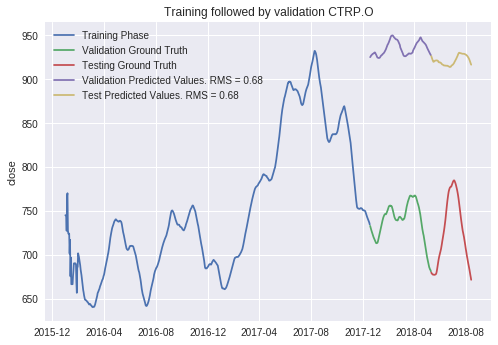

nan_company =====> []
Validation RMS acheived ===>  0.6783153251121847
Test RMS acheived ===>  0.6797395927803808
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 45s - loss: 0.1667
Epoch 2/10
 - 0s - loss: 0.1498
Epoch 3/10
 - 0s - loss: 0.1351
Epoch 4/10
 - 0s - loss: 0.1235
Epoch 5/10
 - 0s - loss: 0.1149
Epoch 6/10
 - 0s - loss: 0.1087
Epoch 7/10
 - 0s - loss: 0.1043
Epoch 8/10
 - 0s - loss: 0.1006
Epoch 9/10
 - 0s - loss: 0.0972
Epoch 10/10
 - 0s - loss: 0.0937
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

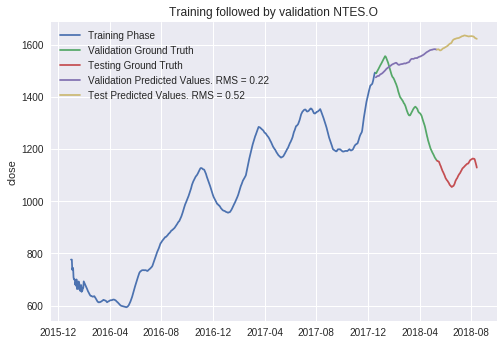

nan_company =====> []
Validation RMS acheived ===>  0.21756127686010643
Test RMS acheived ===>  0.519202291440544
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 45s - loss: 0.9519
Epoch 2/10
 - 0s - loss: 0.7556
Epoch 3/10
 - 0s - loss: 0.5836
Epoch 4/10
 - 0s - loss: 0.4581
Epoch 5/10
 - 0s - loss: 0.3794
Epoch 6/10
 - 0s - loss: 0.3389
Epoch 7/10
 - 0s - loss: 0.3243
Epoch 8/10
 - 0s - loss: 0.3232
Epoch 9/10
 - 0s - loss: 0.3258
Epoch 10/10
 - 0s - loss: 0.3261
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

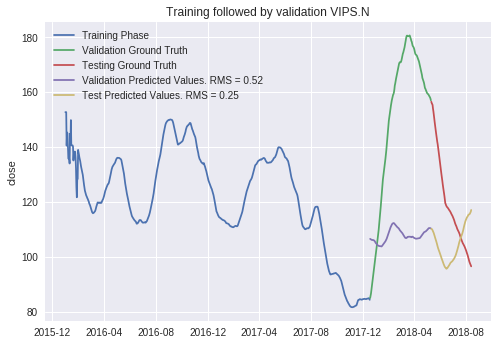

nan_company =====> []
Validation RMS acheived ===>  0.520661517130718
Test RMS acheived ===>  0.2487668021491128
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 45s - loss: 0.1045
Epoch 2/10
 - 0s - loss: 0.0842
Epoch 3/10
 - 0s - loss: 0.0666
Epoch 4/10
 - 0s - loss: 0.0533
Epoch 5/10
 - 0s - loss: 0.0438
Epoch 6/10
 - 0s - loss: 0.0371
Epoch 7/10
 - 0s - loss: 0.0325
Epoch 8/10
 - 0s - loss: 0.0297
Epoch 9/10
 - 0s - loss: 0.0289
Epoch 10/10
 - 0s - loss: 0.0299
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

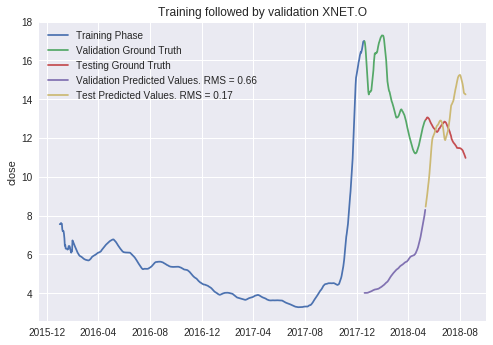

nan_company =====> []
Validation RMS acheived ===>  0.6559276257386861
Test RMS acheived ===>  0.16549825933711712
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 45s - loss: 0.5387
Epoch 2/10
 - 0s - loss: 0.4693
Epoch 3/10
 - 0s - loss: 0.4035
Epoch 4/10
 - 0s - loss: 0.3477
Epoch 5/10
 - 0s - loss: 0.3025
Epoch 6/10
 - 0s - loss: 0.2675
Epoch 7/10
 - 0s - loss: 0.2423
Epoch 8/10
 - 0s - loss: 0.2263
Epoch 9/10
 - 0s - loss: 0.2184
Epoch 10/10
 - 0s - loss: 0.2166
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

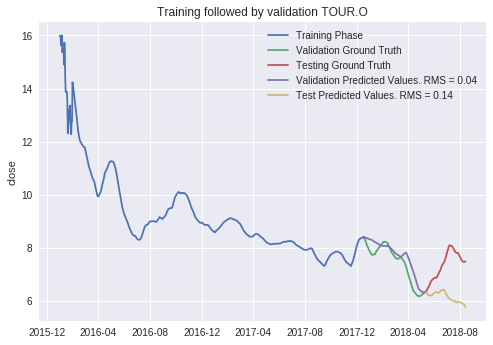

nan_company =====> []
Validation RMS acheived ===>  0.035960272838200226
Test RMS acheived ===>  0.13869528547532498
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 46s - loss: 0.7966
Epoch 2/10
 - 0s - loss: 0.6791
Epoch 3/10
 - 0s - loss: 0.5627
Epoch 4/10
 - 0s - loss: 0.4606
Epoch 5/10
 - 0s - loss: 0.3763
Epoch 6/10
 - 0s - loss: 0.3102
Epoch 7/10
 - 0s - loss: 0.2609
Epoch 8/10
 - 0s - loss: 0.2263
Epoch 9/10
 - 0s - loss: 0.2035
Epoch 10/10
 - 0s - loss: 0.1895
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

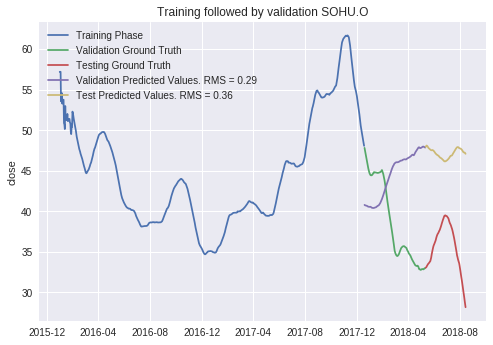

nan_company =====> []
Validation RMS acheived ===>  0.2901683753411516
Test RMS acheived ===>  0.3573895976598382
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 46s - loss: 0.4444
Epoch 2/10
 - 0s - loss: 0.3932
Epoch 3/10
 - 0s - loss: 0.3435
Epoch 4/10
 - 0s - loss: 0.3004
Epoch 5/10
 - 0s - loss: 0.2642
Epoch 6/10
 - 0s - loss: 0.2343
Epoch 7/10
 - 0s - loss: 0.2098
Epoch 8/10
 - 0s - loss: 0.1900
Epoch 9/10
 - 0s - loss: 0.1746
Epoch 10/10
 - 0s - loss: 0.1632
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
To

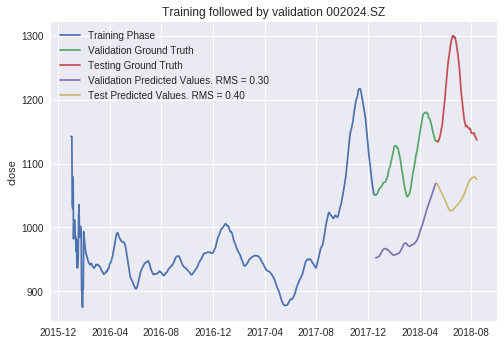

nan_company =====> []
Validation RMS acheived ===>  0.2973115294189562
Test RMS acheived ===>  0.3959500650797438
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 47s - loss: 0.1242
Epoch 2/10
 - 0s - loss: 0.1068
Epoch 3/10
 - 0s - loss: 0.0922
Epoch 4/10
 - 0s - loss: 0.0821
Epoch 5/10
 - 0s - loss: 0.0762
Epoch 6/10
 - 0s - loss: 0.0735
Epoch 7/10
 - 0s - loss: 0.0731
Epoch 8/10
 - 0s - loss: 0.0741
Epoch 9/10
 - 0s - loss: 0.0753
Epoch 10/10
 - 0s - loss: 0.0757
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

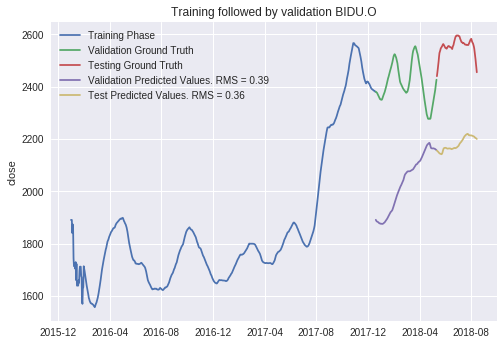

nan_company =====> []
Validation RMS acheived ===>  0.38939301640801793
Test RMS acheived ===>  0.3611682099601175
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 47s - loss: 0.7770
Epoch 2/10
 - 0s - loss: 0.7080
Epoch 3/10
 - 0s - loss: 0.6361
Epoch 4/10
 - 0s - loss: 0.5691
Epoch 5/10
 - 0s - loss: 0.5104
Epoch 6/10
 - 0s - loss: 0.4615
Epoch 7/10
 - 0s - loss: 0.4228
Epoch 8/10
 - 0s - loss: 0.3937
Epoch 9/10
 - 0s - loss: 0.3721
Epoch 10/10
 - 0s - loss: 0.3556
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

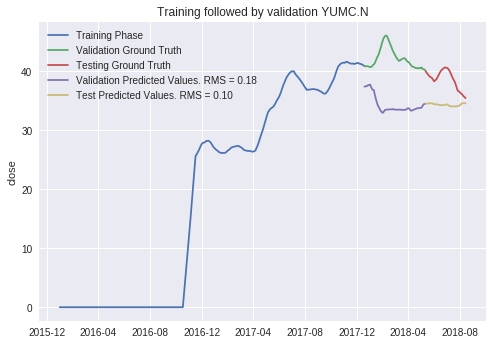

nan_company =====> []
Validation RMS acheived ===>  0.18010205748402944
Test RMS acheived ===>  0.1003678669694578
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 47s - loss: 0.3544
Epoch 2/10
 - 0s - loss: 0.2904
Epoch 3/10
 - 0s - loss: 0.2312
Epoch 4/10
 - 0s - loss: 0.1832
Epoch 5/10
 - 0s - loss: 0.1469
Epoch 6/10
 - 0s - loss: 0.1210
Epoch 7/10
 - 0s - loss: 0.1037
Epoch 8/10
 - 0s - loss: 0.0932
Epoch 9/10
 - 0s - loss: 0.0879
Epoch 10/10
 - 0s - loss: 0.0862
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

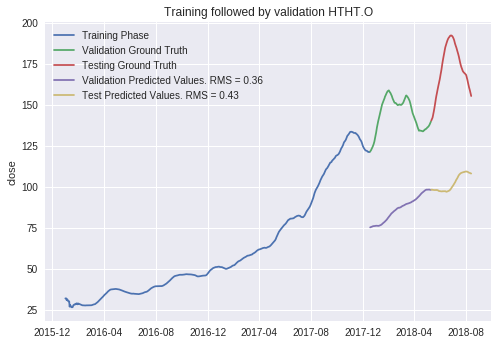

nan_company =====> []
Validation RMS acheived ===>  0.35634140642559875
Test RMS acheived ===>  0.4343700926186914
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 48s - loss: 0.7536
Epoch 2/10
 - 0s - loss: 0.6826
Epoch 3/10
 - 0s - loss: 0.6080
Epoch 4/10
 - 0s - loss: 0.5368
Epoch 5/10
 - 0s - loss: 0.4711
Epoch 6/10
 - 0s - loss: 0.4117
Epoch 7/10
 - 0s - loss: 0.3590
Epoch 8/10
 - 0s - loss: 0.3130
Epoch 9/10
 - 0s - loss: 0.2736
Epoch 10/10
 - 0s - loss: 0.2406
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

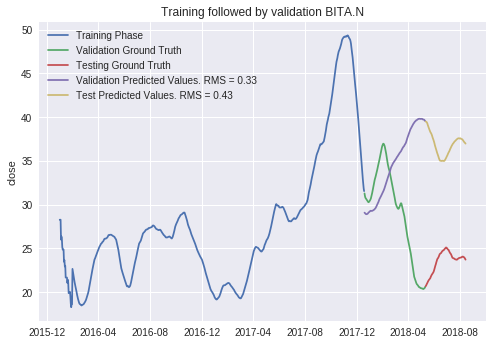

nan_company =====> []
Validation RMS acheived ===>  0.3308820773594821
Test RMS acheived ===>  0.43380310646084175
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 48s - loss: 0.9392
Epoch 2/10
 - 0s - loss: 0.8015
Epoch 3/10
 - 0s - loss: 0.6703
Epoch 4/10
 - 0s - loss: 0.5591
Epoch 5/10
 - 0s - loss: 0.4691
Epoch 6/10
 - 0s - loss: 0.3981
Epoch 7/10
 - 0s - loss: 0.3426
Epoch 8/10
 - 0s - loss: 0.2998
Epoch 9/10
 - 0s - loss: 0.2675
Epoch 10/10
 - 0s - loss: 0.2442
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

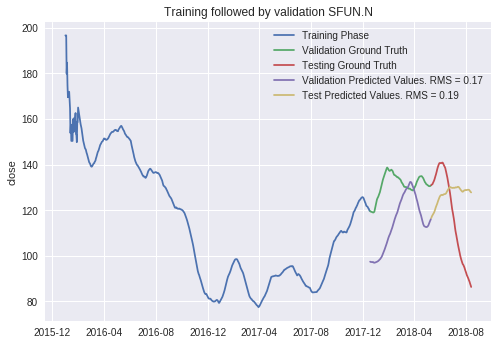

nan_company =====> []
Validation RMS acheived ===>  0.1684157205390818
Test RMS acheived ===>  0.1916046824253094
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 48s - loss: 0.5406
Epoch 2/10
 - 0s - loss: 0.4884
Epoch 3/10
 - 0s - loss: 0.4384
Epoch 4/10
 - 0s - loss: 0.3968
Epoch 5/10
 - 0s - loss: 0.3650
Epoch 6/10
 - 0s - loss: 0.3419
Epoch 7/10
 - 0s - loss: 0.3256
Epoch 8/10
 - 0s - loss: 0.3136
Epoch 9/10
 - 0s - loss: 0.3041
Epoch 10/10
 - 0s - loss: 0.2959
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

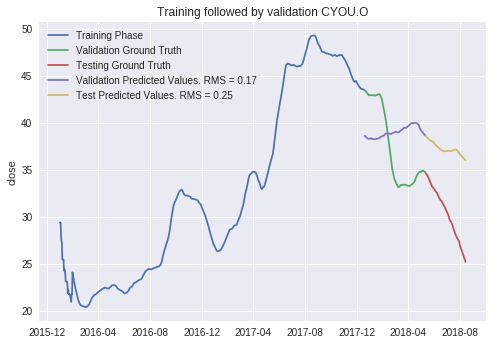

nan_company =====> []
Validation RMS acheived ===>  0.16942088706535366
Test RMS acheived ===>  0.24731905799350548
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 49s - loss: 0.4363
Epoch 2/10
 - 0s - loss: 0.3680
Epoch 3/10
 - 0s - loss: 0.3088
Epoch 4/10
 - 0s - loss: 0.2640
Epoch 5/10
 - 0s - loss: 0.2316
Epoch 6/10
 - 0s - loss: 0.2082
Epoch 7/10
 - 0s - loss: 0.1910
Epoch 8/10
 - 0s - loss: 0.1781
Epoch 9/10
 - 0s - loss: 0.1685
Epoch 10/10
 - 0s - loss: 0.1620
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

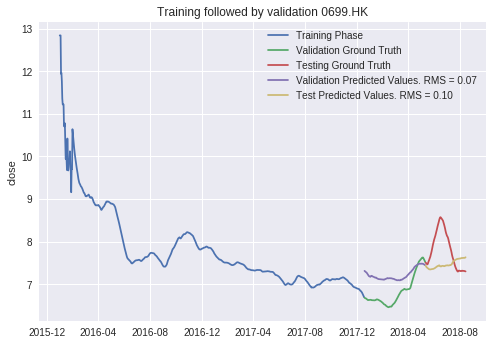

nan_company =====> []
Validation RMS acheived ===>  0.07115082397337412
Test RMS acheived ===>  0.09550389700682729
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 50s - loss: 0.1191
Epoch 2/10
 - 0s - loss: 0.1092
Epoch 3/10
 - 0s - loss: 0.1008
Epoch 4/10
 - 0s - loss: 0.0947
Epoch 5/10
 - 0s - loss: 0.0909
Epoch 6/10
 - 0s - loss: 0.0887
Epoch 7/10
 - 0s - loss: 0.0875
Epoch 8/10
 - 0s - loss: 0.0866
Epoch 9/10
 - 0s - loss: 0.0856
Epoch 10/10
 - 0s - loss: 0.0843
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

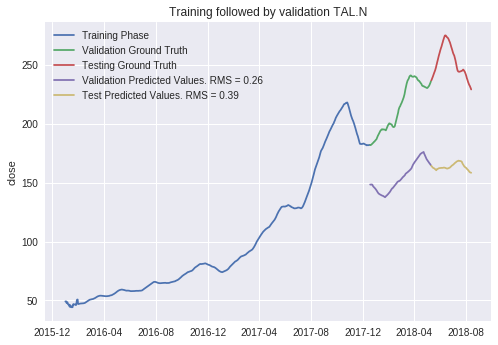

nan_company =====> []
Validation RMS acheived ===>  0.2626782119518019
Test RMS acheived ===>  0.39159968099474995
The train-test accuracy:  0.2906929078177582


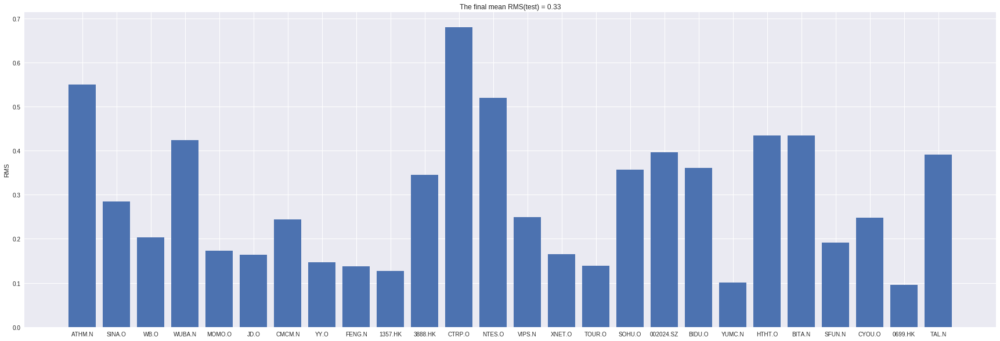

Iter Count======================> 6
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 50s - loss: 0.1860
Epoch 2/10
 - 0s - loss: 0.1685
Epoch 3/10
 - 0s - loss: 0.1517
Epoch 4/10
 - 0s - loss: 0.1374
Epoch 5/10
 - 0s - loss: 0.1262
Epoch 6/10
 - 0s - loss: 0.1181
Epoch 7/10
 - 0s - loss: 0.1128
Epoch 8/10
 - 0s - loss: 0.1101
Epoch 9/10
 - 0s - loss: 0.1093
Epoch 10/10
 - 0s - loss: 0.1095
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
______________

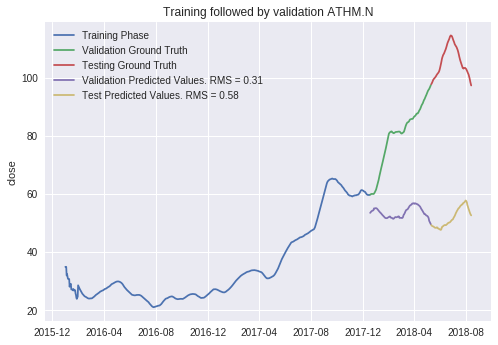

nan_company =====> []
Validation RMS acheived ===>  0.30813843778850747
Test RMS acheived ===>  0.5813502392369712
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 50s - loss: 0.5837
Epoch 2/10
 - 0s - loss: 0.5268
Epoch 3/10
 - 0s - loss: 0.4704
Epoch 4/10
 - 0s - loss: 0.4216
Epoch 5/10
 - 0s - loss: 0.3830
Epoch 6/10
 - 0s - loss: 0.3551
Epoch 7/10
 - 0s - loss: 0.3365
Epoch 8/10
 - 0s - loss: 0.3249
Epoch 9/10
 - 0s - loss: 0.3172
Epoch 10/10
 - 0s - loss: 0.3108
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

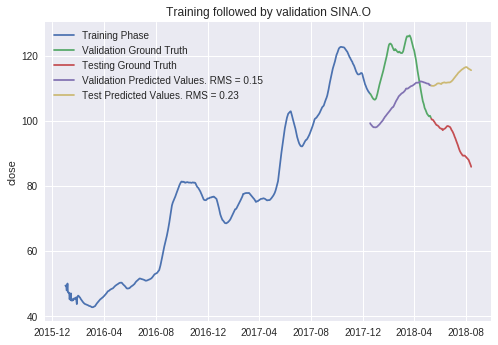

nan_company =====> []
Validation RMS acheived ===>  0.154997553996044
Test RMS acheived ===>  0.23359904738177978
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 51s - loss: 0.1319
Epoch 2/10
 - 0s - loss: 0.1055
Epoch 3/10
 - 0s - loss: 0.0851
Epoch 4/10
 - 0s - loss: 0.0727
Epoch 5/10
 - 0s - loss: 0.0664
Epoch 6/10
 - 0s - loss: 0.0633
Epoch 7/10
 - 0s - loss: 0.0609
Epoch 8/10
 - 0s - loss: 0.0578
Epoch 9/10
 - 0s - loss: 0.0537
Epoch 10/10
 - 0s - loss: 0.0491
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

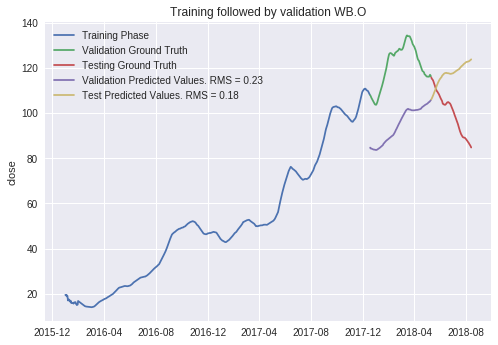

nan_company =====> []
Validation RMS acheived ===>  0.22755348670819733
Test RMS acheived ===>  0.18076093770502785
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 51s - loss: 0.6949
Epoch 2/10
 - 0s - loss: 0.5511
Epoch 3/10
 - 0s - loss: 0.4201
Epoch 4/10
 - 0s - loss: 0.3181
Epoch 5/10
 - 0s - loss: 0.2469
Epoch 6/10
 - 0s - loss: 0.2034
Epoch 7/10
 - 0s - loss: 0.1810
Epoch 8/10
 - 0s - loss: 0.1724
Epoch 9/10
 - 0s - loss: 0.1707
Epoch 10/10
 - 0s - loss: 0.1705
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

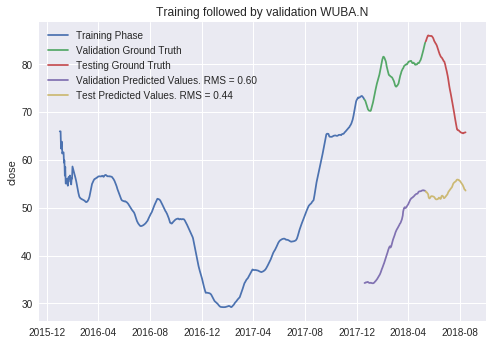

nan_company =====> []
Validation RMS acheived ===>  0.6018576816387337
Test RMS acheived ===>  0.44213655141635194
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 51s - loss: 0.5177
Epoch 2/10
 - 0s - loss: 0.4591
Epoch 3/10
 - 0s - loss: 0.3965
Epoch 4/10
 - 0s - loss: 0.3363
Epoch 5/10
 - 0s - loss: 0.2814
Epoch 6/10
 - 0s - loss: 0.2333
Epoch 7/10
 - 0s - loss: 0.1935
Epoch 8/10
 - 0s - loss: 0.1630
Epoch 9/10
 - 0s - loss: 0.1426
Epoch 10/10
 - 0s - loss: 0.1320
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

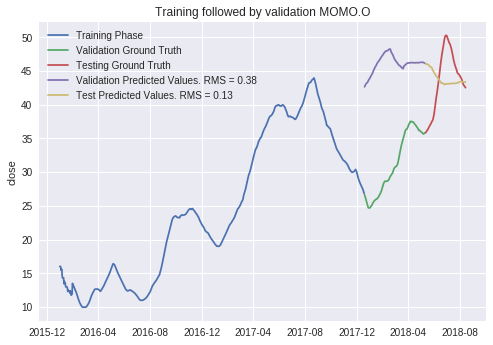

nan_company =====> []
Validation RMS acheived ===>  0.3833946373381919
Test RMS acheived ===>  0.13458318585571344
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 52s - loss: 0.2316
Epoch 2/10
 - 0s - loss: 0.2030
Epoch 3/10
 - 0s - loss: 0.1765
Epoch 4/10
 - 0s - loss: 0.1548
Epoch 5/10
 - 0s - loss: 0.1376
Epoch 6/10
 - 0s - loss: 0.1241
Epoch 7/10
 - 0s - loss: 0.1132
Epoch 8/10
 - 0s - loss: 0.1045
Epoch 9/10
 - 0s - loss: 0.0979
Epoch 10/10
 - 0s - loss: 0.0931
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

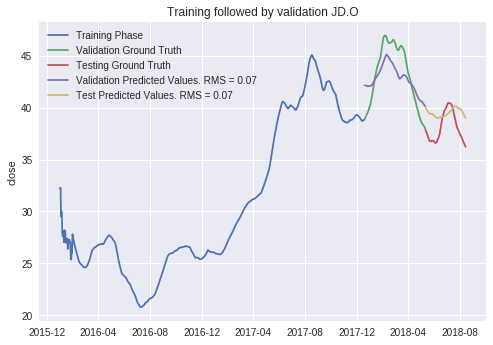

nan_company =====> []
Validation RMS acheived ===>  0.07149792726423762
Test RMS acheived ===>  0.07357390112325313
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 52s - loss: 0.9866
Epoch 2/10
 - 0s - loss: 0.8128
Epoch 3/10
 - 0s - loss: 0.6617
Epoch 4/10
 - 0s - loss: 0.5537
Epoch 5/10
 - 0s - loss: 0.4867
Epoch 6/10
 - 0s - loss: 0.4478
Epoch 7/10
 - 0s - loss: 0.4222
Epoch 8/10
 - 0s - loss: 0.3988
Epoch 9/10
 - 0s - loss: 0.3724
Epoch 10/10
 - 0s - loss: 0.3423
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

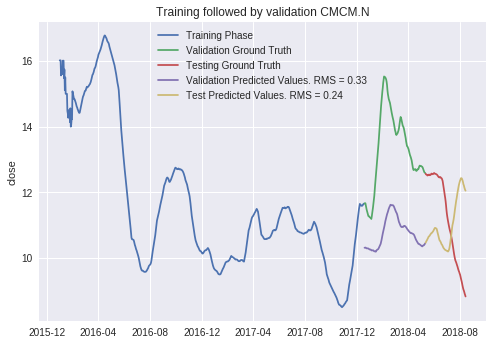

nan_company =====> []
Validation RMS acheived ===>  0.32896019071912247
Test RMS acheived ===>  0.2393200387388408
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 53s - loss: 0.1617
Epoch 2/10
 - 0s - loss: 0.1378
Epoch 3/10
 - 0s - loss: 0.1154
Epoch 4/10
 - 0s - loss: 0.0966
Epoch 5/10
 - 0s - loss: 0.0812
Epoch 6/10
 - 0s - loss: 0.0686
Epoch 7/10
 - 0s - loss: 0.0583
Epoch 8/10
 - 0s - loss: 0.0501
Epoch 9/10
 - 0s - loss: 0.0440
Epoch 10/10
 - 0s - loss: 0.0401
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

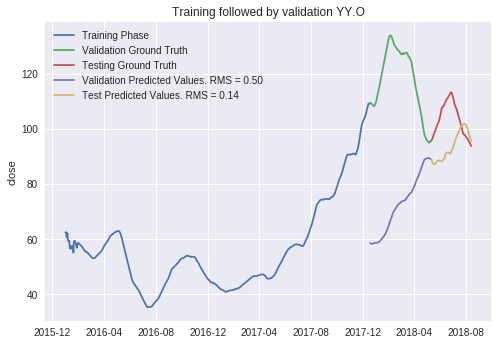

nan_company =====> []
Validation RMS acheived ===>  0.49802154664947845
Test RMS acheived ===>  0.13637940076392102
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 53s - loss: 0.3318
Epoch 2/10
 - 0s - loss: 0.2968
Epoch 3/10
 - 0s - loss: 0.2644
Epoch 4/10
 - 0s - loss: 0.2379
Epoch 5/10
 - 0s - loss: 0.2175
Epoch 6/10
 - 0s - loss: 0.2026
Epoch 7/10
 - 0s - loss: 0.1923
Epoch 8/10
 - 0s - loss: 0.1858
Epoch 9/10
 - 0s - loss: 0.1820
Epoch 10/10
 - 0s - loss: 0.1800
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

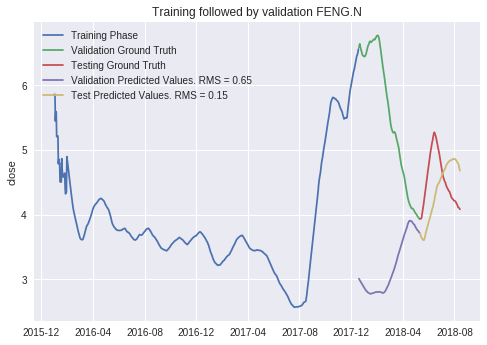

nan_company =====> []
Validation RMS acheived ===>  0.6520074780587266
Test RMS acheived ===>  0.15310967596596353
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 53s - loss: 1.0617
Epoch 2/10
 - 0s - loss: 0.9951
Epoch 3/10
 - 0s - loss: 0.9242
Epoch 4/10
 - 0s - loss: 0.8553
Epoch 5/10
 - 0s - loss: 0.7904
Epoch 6/10
 - 0s - loss: 0.7300
Epoch 7/10
 - 0s - loss: 0.6744
Epoch 8/10
 - 0s - loss: 0.6234
Epoch 9/10
 - 0s - loss: 0.5771
Epoch 10/10
 - 0s - loss: 0.5353
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

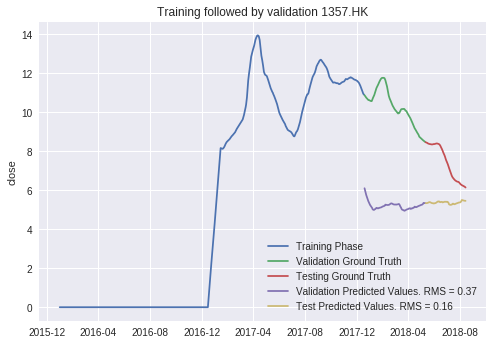

nan_company =====> []
Validation RMS acheived ===>  0.36835521302685414
Test RMS acheived ===>  0.16266959120789234
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 53s - loss: 0.2958
Epoch 2/10
 - 0s - loss: 0.2699
Epoch 3/10
 - 0s - loss: 0.2441
Epoch 4/10
 - 0s - loss: 0.2215
Epoch 5/10
 - 0s - loss: 0.2029
Epoch 6/10
 - 0s - loss: 0.1886
Epoch 7/10
 - 0s - loss: 0.1782
Epoch 8/10
 - 0s - loss: 0.1714
Epoch 9/10
 - 0s - loss: 0.1677
Epoch 10/10
 - 0s - loss: 0.1664
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

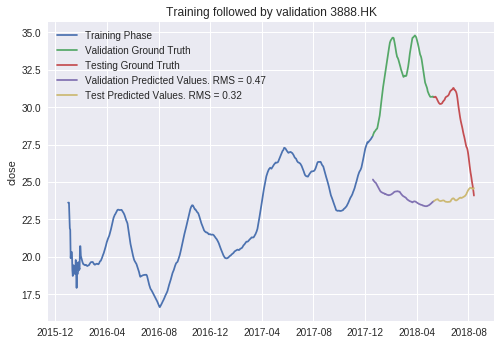

nan_company =====> []
Validation RMS acheived ===>  0.47178042939552817
Test RMS acheived ===>  0.32225807080681035
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 54s - loss: 0.4189
Epoch 2/10
 - 0s - loss: 0.3583
Epoch 3/10
 - 0s - loss: 0.3001
Epoch 4/10
 - 0s - loss: 0.2525
Epoch 5/10
 - 0s - loss: 0.2185
Epoch 6/10
 - 0s - loss: 0.1980
Epoch 7/10
 - 0s - loss: 0.1887
Epoch 8/10
 - 0s - loss: 0.1859
Epoch 9/10
 - 0s - loss: 0.1843
Epoch 10/10
 - 0s - loss: 0.1802
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

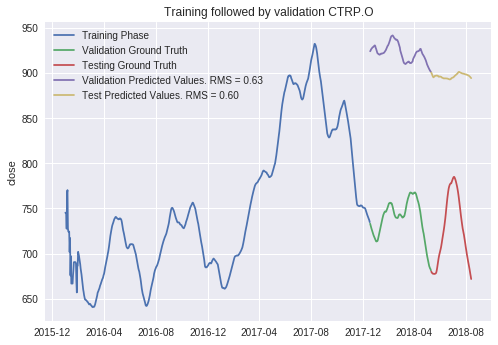

nan_company =====> []
Validation RMS acheived ===>  0.6345849336695306
Test RMS acheived ===>  0.5959814102413514
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 54s - loss: 0.1711
Epoch 2/10
 - 0s - loss: 0.1512
Epoch 3/10
 - 0s - loss: 0.1341
Epoch 4/10
 - 0s - loss: 0.1207
Epoch 5/10
 - 0s - loss: 0.1107
Epoch 6/10
 - 0s - loss: 0.1040
Epoch 7/10
 - 0s - loss: 0.0999
Epoch 8/10
 - 0s - loss: 0.0971
Epoch 9/10
 - 0s - loss: 0.0943
Epoch 10/10
 - 0s - loss: 0.0912
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

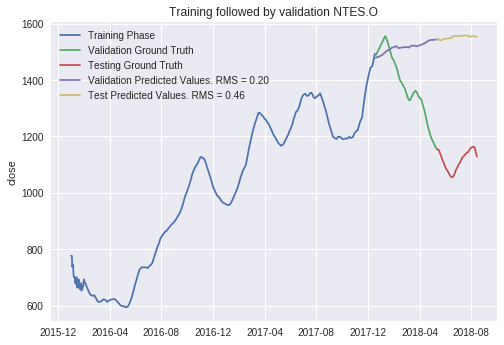

nan_company =====> []
Validation RMS acheived ===>  0.19504511038313332
Test RMS acheived ===>  0.4556303026918047
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 54s - loss: 1.0650
Epoch 2/10
 - 0s - loss: 0.8494
Epoch 3/10
 - 0s - loss: 0.6555
Epoch 4/10
 - 0s - loss: 0.5091
Epoch 5/10
 - 0s - loss: 0.4130
Epoch 6/10
 - 0s - loss: 0.3605
Epoch 7/10
 - 0s - loss: 0.3393
Epoch 8/10
 - 0s - loss: 0.3357
Epoch 9/10
 - 0s - loss: 0.3380
Epoch 10/10
 - 0s - loss: 0.3383
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

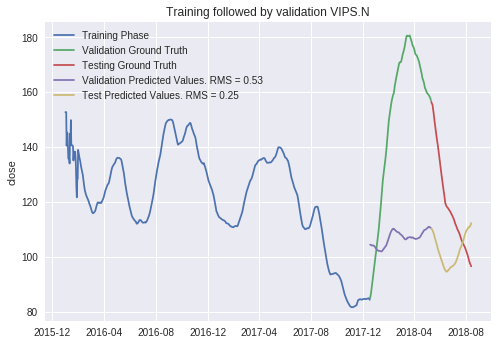

nan_company =====> []
Validation RMS acheived ===>  0.525780074583729
Test RMS acheived ===>  0.251331979849131
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 55s - loss: 0.1203
Epoch 2/10
 - 0s - loss: 0.0907
Epoch 3/10
 - 0s - loss: 0.0671
Epoch 4/10
 - 0s - loss: 0.0524
Epoch 5/10
 - 0s - loss: 0.0450
Epoch 6/10
 - 0s - loss: 0.0417
Epoch 7/10
 - 0s - loss: 0.0395
Epoch 8/10
 - 0s - loss: 0.0369
Epoch 9/10
 - 0s - loss: 0.0342
Epoch 10/10
 - 0s - loss: 0.0323
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

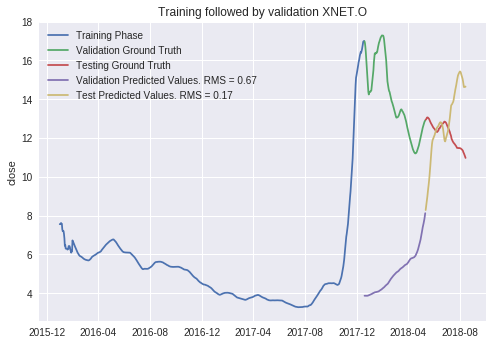

nan_company =====> []
Validation RMS acheived ===>  0.6652951535184023
Test RMS acheived ===>  0.17335282510746175
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 56s - loss: 0.4404
Epoch 2/10
 - 0s - loss: 0.3841
Epoch 3/10
 - 0s - loss: 0.3304
Epoch 4/10
 - 0s - loss: 0.2857
Epoch 5/10
 - 0s - loss: 0.2519
Epoch 6/10
 - 0s - loss: 0.2290
Epoch 7/10
 - 0s - loss: 0.2157
Epoch 8/10
 - 0s - loss: 0.2099
Epoch 9/10
 - 0s - loss: 0.2085
Epoch 10/10
 - 0s - loss: 0.2086
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

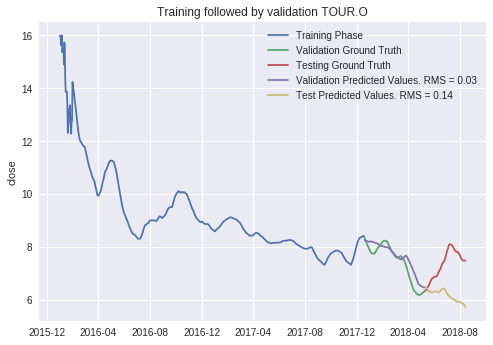

nan_company =====> []
Validation RMS acheived ===>  0.0334458949491659
Test RMS acheived ===>  0.13922993901468195
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 56s - loss: 0.8240
Epoch 2/10
 - 0s - loss: 0.6978
Epoch 3/10
 - 0s - loss: 0.5751
Epoch 4/10
 - 0s - loss: 0.4692
Epoch 5/10
 - 0s - loss: 0.3831
Epoch 6/10
 - 0s - loss: 0.3160
Epoch 7/10
 - 0s - loss: 0.2660
Epoch 8/10
 - 0s - loss: 0.2305
Epoch 9/10
 - 0s - loss: 0.2062
Epoch 10/10
 - 0s - loss: 0.1900
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

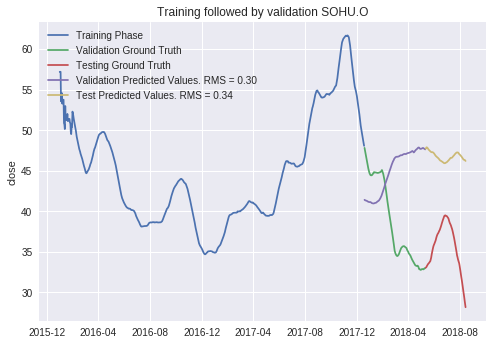

nan_company =====> []
Validation RMS acheived ===>  0.2961120959233897
Test RMS acheived ===>  0.3445591731959234
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 57s - loss: 0.4148
Epoch 2/10
 - 0s - loss: 0.3678
Epoch 3/10
 - 0s - loss: 0.3227
Epoch 4/10
 - 0s - loss: 0.2836
Epoch 5/10
 - 0s - loss: 0.2509
Epoch 6/10
 - 0s - loss: 0.2239
Epoch 7/10
 - 0s - loss: 0.2018
Epoch 8/10
 - 0s - loss: 0.1840
Epoch 9/10
 - 0s - loss: 0.1699
Epoch 10/10
 - 0s - loss: 0.1593
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
To

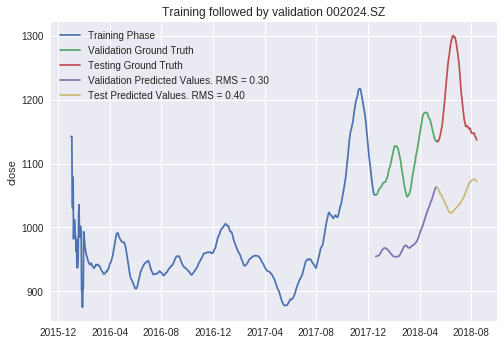

nan_company =====> []
Validation RMS acheived ===>  0.303170213321427
Test RMS acheived ===>  0.40282424902150127
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 57s - loss: 0.1300
Epoch 2/10
 - 0s - loss: 0.1110
Epoch 3/10
 - 0s - loss: 0.0948
Epoch 4/10
 - 0s - loss: 0.0831
Epoch 5/10
 - 0s - loss: 0.0756
Epoch 6/10
 - 0s - loss: 0.0715
Epoch 7/10
 - 0s - loss: 0.0701
Epoch 8/10
 - 0s - loss: 0.0705
Epoch 9/10
 - 0s - loss: 0.0721
Epoch 10/10
 - 0s - loss: 0.0736
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

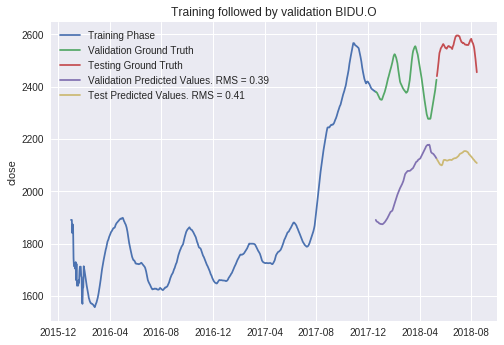

nan_company =====> []
Validation RMS acheived ===>  0.38957122502790037
Test RMS acheived ===>  0.4118282386598825
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 58s - loss: 0.7757
Epoch 2/10
 - 0s - loss: 0.6950
Epoch 3/10
 - 0s - loss: 0.6135
Epoch 4/10
 - 0s - loss: 0.5405
Epoch 5/10
 - 0s - loss: 0.4793
Epoch 6/10
 - 0s - loss: 0.4304
Epoch 7/10
 - 0s - loss: 0.3933
Epoch 8/10
 - 0s - loss: 0.3663
Epoch 9/10
 - 0s - loss: 0.3465
Epoch 10/10
 - 0s - loss: 0.3308
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

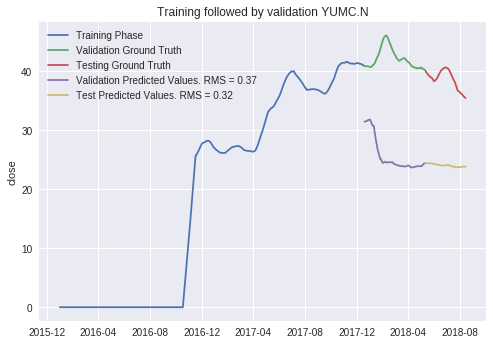

nan_company =====> []
Validation RMS acheived ===>  0.3667687724928908
Test RMS acheived ===>  0.31895552363883817
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 58s - loss: 0.4106
Epoch 2/10
 - 0s - loss: 0.3360
Epoch 3/10
 - 0s - loss: 0.2661
Epoch 4/10
 - 0s - loss: 0.2087
Epoch 5/10
 - 0s - loss: 0.1646
Epoch 6/10
 - 0s - loss: 0.1329
Epoch 7/10
 - 0s - loss: 0.1116
Epoch 8/10
 - 0s - loss: 0.0989
Epoch 9/10
 - 0s - loss: 0.0929
Epoch 10/10
 - 0s - loss: 0.0915
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

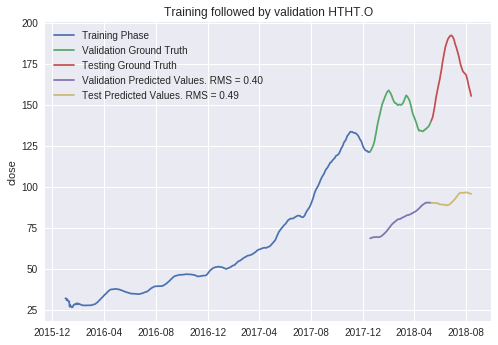

nan_company =====> []
Validation RMS acheived ===>  0.39822426338856876
Test RMS acheived ===>  0.49196629280123416
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 58s - loss: 0.7143
Epoch 2/10
 - 0s - loss: 0.6453
Epoch 3/10
 - 0s - loss: 0.5736
Epoch 4/10
 - 0s - loss: 0.5062
Epoch 5/10
 - 0s - loss: 0.4450
Epoch 6/10
 - 0s - loss: 0.3905
Epoch 7/10
 - 0s - loss: 0.3428
Epoch 8/10
 - 0s - loss: 0.3017
Epoch 9/10
 - 0s - loss: 0.2668
Epoch 10/10
 - 0s - loss: 0.2376
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

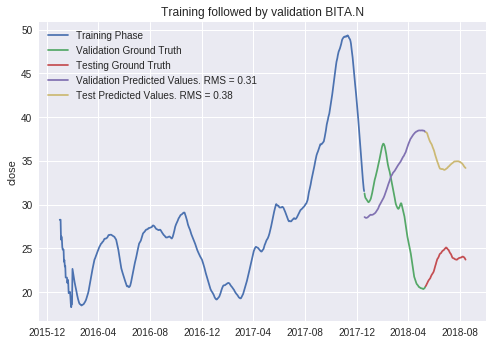

nan_company =====> []
Validation RMS acheived ===>  0.30895540407187844
Test RMS acheived ===>  0.3817957090634588
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 59s - loss: 0.8924
Epoch 2/10
 - 0s - loss: 0.7628
Epoch 3/10
 - 0s - loss: 0.6382
Epoch 4/10
 - 0s - loss: 0.5311
Epoch 5/10
 - 0s - loss: 0.4429
Epoch 6/10
 - 0s - loss: 0.3723
Epoch 7/10
 - 0s - loss: 0.3174
Epoch 8/10
 - 0s - loss: 0.2762
Epoch 9/10
 - 0s - loss: 0.2471
Epoch 10/10
 - 0s - loss: 0.2284
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

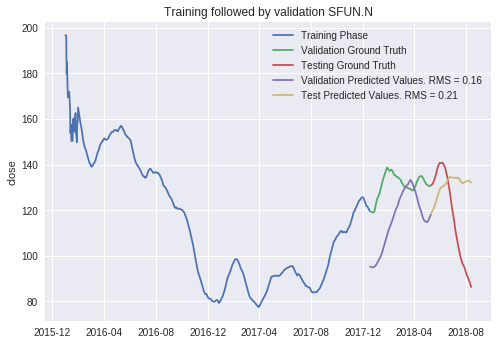

nan_company =====> []
Validation RMS acheived ===>  0.15846768804607614
Test RMS acheived ===>  0.20781737055191637
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 58s - loss: 0.4746
Epoch 2/10
 - 0s - loss: 0.4239
Epoch 3/10
 - 0s - loss: 0.3786
Epoch 4/10
 - 0s - loss: 0.3446
Epoch 5/10
 - 0s - loss: 0.3216
Epoch 6/10
 - 0s - loss: 0.3063
Epoch 7/10
 - 0s - loss: 0.2956
Epoch 8/10
 - 0s - loss: 0.2866
Epoch 9/10
 - 0s - loss: 0.2783
Epoch 10/10
 - 0s - loss: 0.2703
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

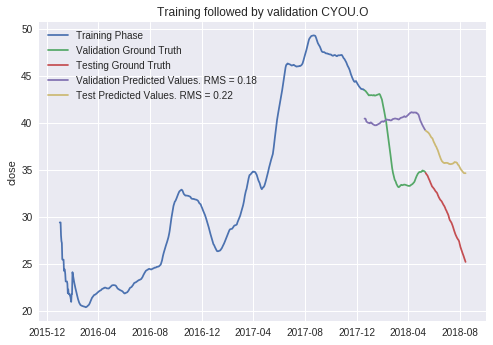

nan_company =====> []
Validation RMS acheived ===>  0.18426132278393123
Test RMS acheived ===>  0.21540398630045782
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 59s - loss: 0.4942
Epoch 2/10
 - 0s - loss: 0.4120
Epoch 3/10
 - 0s - loss: 0.3401
Epoch 4/10
 - 0s - loss: 0.2852
Epoch 5/10
 - 0s - loss: 0.2450
Epoch 6/10
 - 0s - loss: 0.2159
Epoch 7/10
 - 0s - loss: 0.1944
Epoch 8/10
 - 0s - loss: 0.1782
Epoch 9/10
 - 0s - loss: 0.1663
Epoch 10/10
 - 0s - loss: 0.1580
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

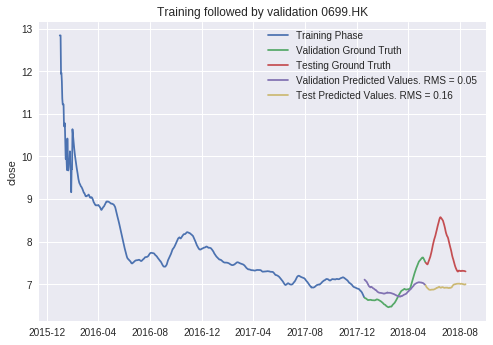

nan_company =====> []
Validation RMS acheived ===>  0.04683919348435705
Test RMS acheived ===>  0.15633928447343126
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 59s - loss: 0.1215
Epoch 2/10
 - 0s - loss: 0.1092
Epoch 3/10
 - 0s - loss: 0.0993
Epoch 4/10
 - 0s - loss: 0.0931
Epoch 5/10
 - 0s - loss: 0.0901
Epoch 6/10
 - 0s - loss: 0.0891
Epoch 7/10
 - 0s - loss: 0.0887
Epoch 8/10
 - 0s - loss: 0.0879
Epoch 9/10
 - 0s - loss: 0.0863
Epoch 10/10
 - 0s - loss: 0.0842
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

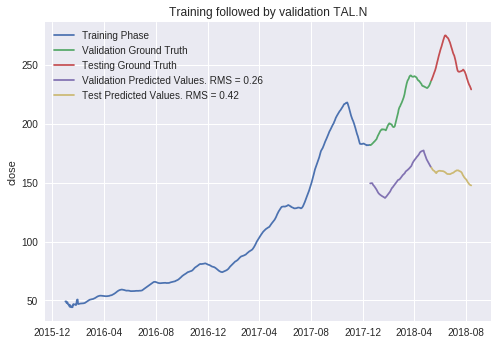

nan_company =====> []
Validation RMS acheived ===>  0.25869836858002787
Test RMS acheived ===>  0.4164652638880447
The train-test accuracy:  0.29320085341160174


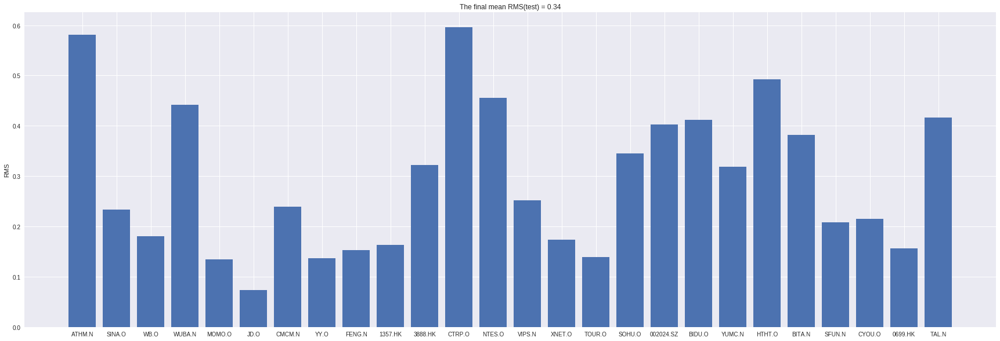

Saved model to disk
Iter Count======================> 7
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 60s - loss: 0.1876
Epoch 2/10
 - 0s - loss: 0.1683
Epoch 3/10
 - 0s - loss: 0.1503
Epoch 4/10
 - 0s - loss: 0.1357
Epoch 5/10
 - 0s - loss: 0.1251
Epoch 6/10
 - 0s - loss: 0.1182
Epoch 7/10
 - 0s - loss: 0.1146
Epoch 8/10
 - 0s - loss: 0.1135
Epoch 9/10
 - 0s - loss: 0.1135
Epoch 10/10
 - 0s - loss: 0.1135
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable para

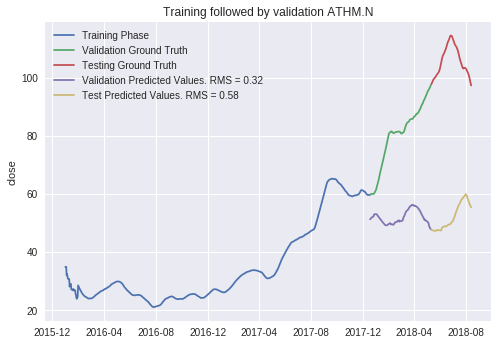

nan_company =====> []
Validation RMS acheived ===>  0.3233676094513777
Test RMS acheived ===>  0.5793782828285341
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 60s - loss: 0.5469
Epoch 2/10
 - 0s - loss: 0.4935
Epoch 3/10
 - 0s - loss: 0.4423
Epoch 4/10
 - 0s - loss: 0.4003
Epoch 5/10
 - 0s - loss: 0.3693
Epoch 6/10
 - 0s - loss: 0.3488
Epoch 7/10
 - 0s - loss: 0.3362
Epoch 8/10
 - 0s - loss: 0.3282
Epoch 9/10
 - 0s - loss: 0.3215
Epoch 10/10
 - 0s - loss: 0.3139
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

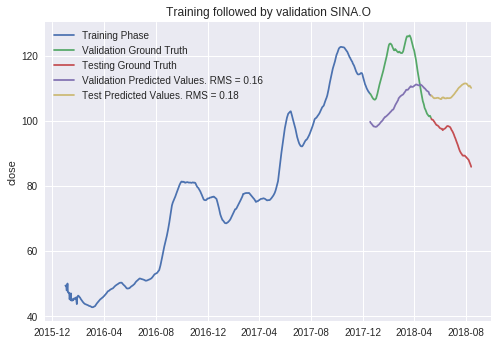

nan_company =====> []
Validation RMS acheived ===>  0.15613510372946884
Test RMS acheived ===>  0.18024358171403437
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 60s - loss: 0.1267
Epoch 2/10
 - 0s - loss: 0.1000
Epoch 3/10
 - 0s - loss: 0.0798
Epoch 4/10
 - 0s - loss: 0.0682
Epoch 5/10
 - 0s - loss: 0.0631
Epoch 6/10
 - 0s - loss: 0.0610
Epoch 7/10
 - 0s - loss: 0.0591
Epoch 8/10
 - 0s - loss: 0.0560
Epoch 9/10
 - 0s - loss: 0.0517
Epoch 10/10
 - 0s - loss: 0.0470
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

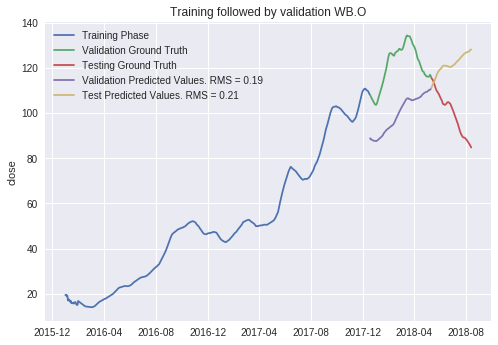

nan_company =====> []
Validation RMS acheived ===>  0.19046799569214104
Test RMS acheived ===>  0.20822091081337604
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 61s - loss: 0.7376
Epoch 2/10
 - 0s - loss: 0.5806
Epoch 3/10
 - 0s - loss: 0.4368
Epoch 4/10
 - 0s - loss: 0.3238
Epoch 5/10
 - 0s - loss: 0.2437
Epoch 6/10
 - 0s - loss: 0.1939
Epoch 7/10
 - 0s - loss: 0.1686
Epoch 8/10
 - 0s - loss: 0.1601
Epoch 9/10
 - 0s - loss: 0.1604
Epoch 10/10
 - 0s - loss: 0.1630
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

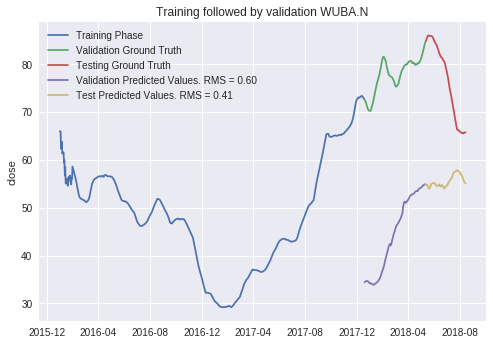

nan_company =====> []
Validation RMS acheived ===>  0.5967908388281935
Test RMS acheived ===>  0.4058395988149775
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 61s - loss: 0.4751
Epoch 2/10
 - 0s - loss: 0.4153
Epoch 3/10
 - 0s - loss: 0.3529
Epoch 4/10
 - 0s - loss: 0.2945
Epoch 5/10
 - 0s - loss: 0.2431
Epoch 6/10
 - 0s - loss: 0.2001
Epoch 7/10
 - 0s - loss: 0.1668
Epoch 8/10
 - 0s - loss: 0.1437
Epoch 9/10
 - 0s - loss: 0.1306
Epoch 10/10
 - 0s - loss: 0.1260
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

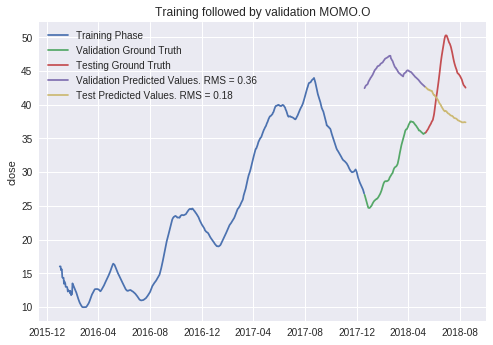

nan_company =====> []
Validation RMS acheived ===>  0.35907725567480564
Test RMS acheived ===>  0.18023548935117772
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 62s - loss: 0.2174
Epoch 2/10
 - 0s - loss: 0.1906
Epoch 3/10
 - 0s - loss: 0.1665
Epoch 4/10
 - 0s - loss: 0.1473
Epoch 5/10
 - 0s - loss: 0.1322
Epoch 6/10
 - 0s - loss: 0.1198
Epoch 7/10
 - 0s - loss: 0.1091
Epoch 8/10
 - 0s - loss: 0.1001
Epoch 9/10
 - 0s - loss: 0.0931
Epoch 10/10
 - 0s - loss: 0.0881
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

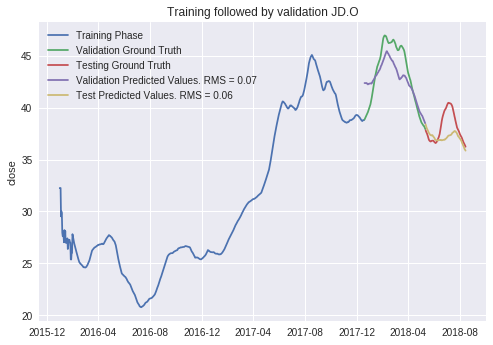

nan_company =====> []
Validation RMS acheived ===>  0.06595257993428723
Test RMS acheived ===>  0.06193403600336705
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 63s - loss: 0.7828
Epoch 2/10
 - 0s - loss: 0.6500
Epoch 3/10
 - 0s - loss: 0.5421
Epoch 4/10
 - 0s - loss: 0.4676
Epoch 5/10
 - 0s - loss: 0.4184
Epoch 6/10
 - 0s - loss: 0.3830
Epoch 7/10
 - 0s - loss: 0.3524
Epoch 8/10
 - 0s - loss: 0.3226
Epoch 9/10
 - 0s - loss: 0.2942
Epoch 10/10
 - 0s - loss: 0.2699
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

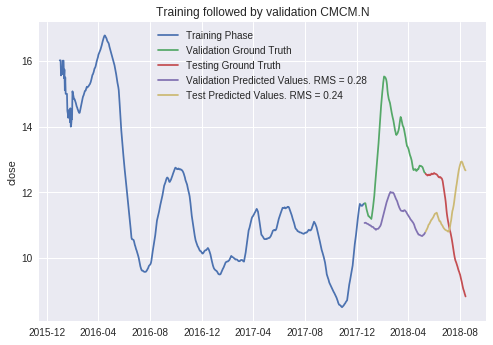

nan_company =====> []
Validation RMS acheived ===>  0.2781741116051886
Test RMS acheived ===>  0.24071484272110452
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 63s - loss: 0.1623
Epoch 2/10
 - 0s - loss: 0.1350
Epoch 3/10
 - 0s - loss: 0.1098
Epoch 4/10
 - 0s - loss: 0.0895
Epoch 5/10
 - 0s - loss: 0.0739
Epoch 6/10
 - 0s - loss: 0.0624
Epoch 7/10
 - 0s - loss: 0.0540
Epoch 8/10
 - 0s - loss: 0.0480
Epoch 9/10
 - 0s - loss: 0.0439
Epoch 10/10
 - 0s - loss: 0.0415
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

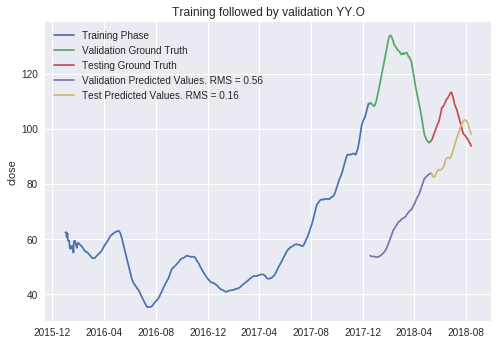

nan_company =====> []
Validation RMS acheived ===>  0.5554073370918162
Test RMS acheived ===>  0.1573404118340742
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 63s - loss: 0.3326
Epoch 2/10
 - 0s - loss: 0.2962
Epoch 3/10
 - 0s - loss: 0.2625
Epoch 4/10
 - 0s - loss: 0.2352
Epoch 5/10
 - 0s - loss: 0.2147
Epoch 6/10
 - 0s - loss: 0.2003
Epoch 7/10
 - 0s - loss: 0.1906
Epoch 8/10
 - 0s - loss: 0.1845
Epoch 9/10
 - 0s - loss: 0.1808
Epoch 10/10
 - 0s - loss: 0.1784
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

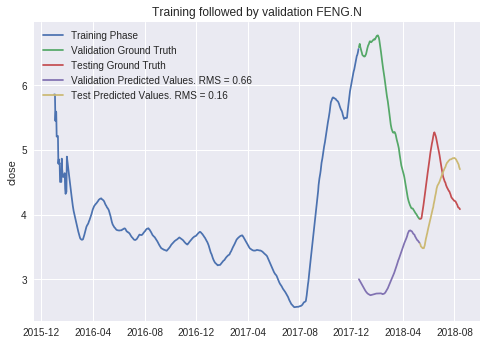

nan_company =====> []
Validation RMS acheived ===>  0.6592438198102052
Test RMS acheived ===>  0.1616854842336124
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 64s - loss: 1.0817
Epoch 2/10
 - 0s - loss: 1.0047
Epoch 3/10
 - 0s - loss: 0.9235
Epoch 4/10
 - 0s - loss: 0.8457
Epoch 5/10
 - 0s - loss: 0.7737
Epoch 6/10
 - 0s - loss: 0.7082
Epoch 7/10
 - 0s - loss: 0.6491
Epoch 8/10
 - 0s - loss: 0.5964
Epoch 9/10
 - 0s - loss: 0.5498
Epoch 10/10
 - 0s - loss: 0.5091
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

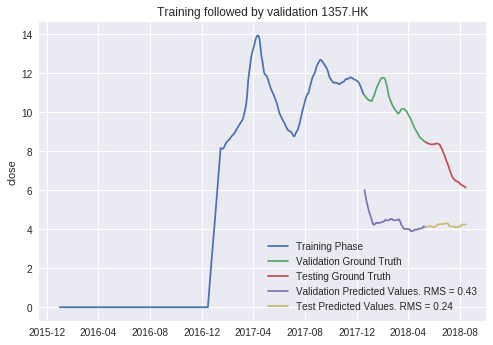

nan_company =====> []
Validation RMS acheived ===>  0.42768054469982386
Test RMS acheived ===>  0.24272172303173511
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 64s - loss: 0.2924
Epoch 2/10
 - 0s - loss: 0.2686
Epoch 3/10
 - 0s - loss: 0.2449
Epoch 4/10
 - 0s - loss: 0.2237
Epoch 5/10
 - 0s - loss: 0.2055
Epoch 6/10
 - 0s - loss: 0.1905
Epoch 7/10
 - 0s - loss: 0.1789
Epoch 8/10
 - 0s - loss: 0.1708
Epoch 9/10
 - 0s - loss: 0.1660
Epoch 10/10
 - 0s - loss: 0.1637
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

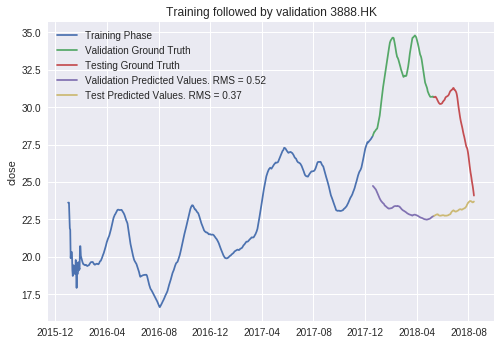

nan_company =====> []
Validation RMS acheived ===>  0.5183981115829251
Test RMS acheived ===>  0.36726177526576315
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 64s - loss: 0.3669
Epoch 2/10
 - 0s - loss: 0.3149
Epoch 3/10
 - 0s - loss: 0.2652
Epoch 4/10
 - 0s - loss: 0.2252
Epoch 5/10
 - 0s - loss: 0.1972
Epoch 6/10
 - 0s - loss: 0.1805
Epoch 7/10
 - 0s - loss: 0.1718
Epoch 8/10
 - 0s - loss: 0.1663
Epoch 9/10
 - 0s - loss: 0.1602
Epoch 10/10
 - 0s - loss: 0.1520
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

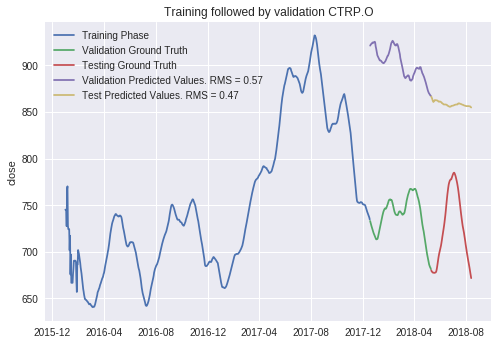

nan_company =====> []
Validation RMS acheived ===>  0.5662143760483633
Test RMS acheived ===>  0.47094859820240825
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 64s - loss: 0.1722
Epoch 2/10
 - 0s - loss: 0.1510
Epoch 3/10
 - 0s - loss: 0.1315
Epoch 4/10
 - 0s - loss: 0.1161
Epoch 5/10
 - 0s - loss: 0.1052
Epoch 6/10
 - 0s - loss: 0.0980
Epoch 7/10
 - 0s - loss: 0.0935
Epoch 8/10
 - 0s - loss: 0.0905
Epoch 9/10
 - 0s - loss: 0.0879
Epoch 10/10
 - 0s - loss: 0.0852
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

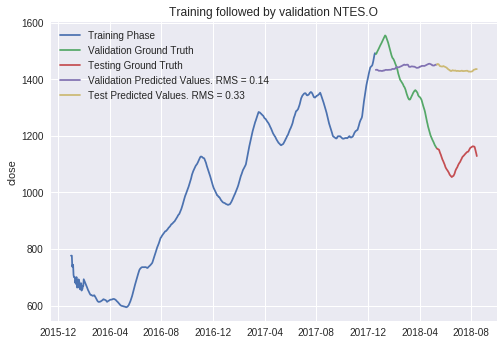

nan_company =====> []
Validation RMS acheived ===>  0.14066568950388755
Test RMS acheived ===>  0.33444632933391233
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 64s - loss: 0.9348
Epoch 2/10
 - 0s - loss: 0.7532
Epoch 3/10
 - 0s - loss: 0.5916
Epoch 4/10
 - 0s - loss: 0.4715
Epoch 5/10
 - 0s - loss: 0.3939
Epoch 6/10
 - 0s - loss: 0.3514
Epoch 7/10
 - 0s - loss: 0.3324
Epoch 8/10
 - 0s - loss: 0.3254
Epoch 9/10
 - 0s - loss: 0.3212
Epoch 10/10
 - 0s - loss: 0.3144
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

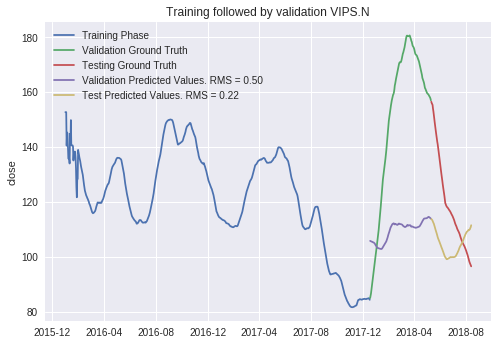

nan_company =====> []
Validation RMS acheived ===>  0.4951451348916541
Test RMS acheived ===>  0.2208869939749169
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 65s - loss: 0.1589
Epoch 2/10
 - 0s - loss: 0.1179
Epoch 3/10
 - 0s - loss: 0.0823
Epoch 4/10
 - 0s - loss: 0.0573
Epoch 5/10
 - 0s - loss: 0.0432
Epoch 6/10
 - 0s - loss: 0.0381
Epoch 7/10
 - 0s - loss: 0.0386
Epoch 8/10
 - 0s - loss: 0.0405
Epoch 9/10
 - 0s - loss: 0.0413
Epoch 10/10
 - 0s - loss: 0.0401
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

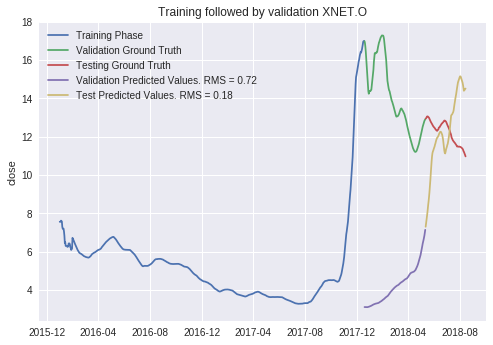

nan_company =====> []
Validation RMS acheived ===>  0.7218258191530252
Test RMS acheived ===>  0.18213242995107448
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 65s - loss: 0.4129
Epoch 2/10
 - 0s - loss: 0.3625
Epoch 3/10
 - 0s - loss: 0.3143
Epoch 4/10
 - 0s - loss: 0.2747
Epoch 5/10
 - 0s - loss: 0.2449
Epoch 6/10
 - 0s - loss: 0.2245
Epoch 7/10
 - 0s - loss: 0.2122
Epoch 8/10
 - 0s - loss: 0.2059
Epoch 9/10
 - 0s - loss: 0.2032
Epoch 10/10
 - 0s - loss: 0.2017
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

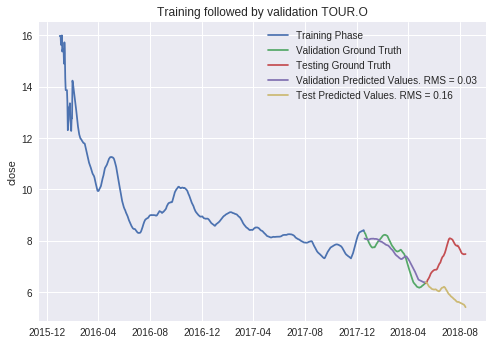

nan_company =====> []
Validation RMS acheived ===>  0.028051714238297863
Test RMS acheived ===>  0.16196858866331063
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 65s - loss: 0.7202
Epoch 2/10
 - 0s - loss: 0.6069
Epoch 3/10
 - 0s - loss: 0.4986
Epoch 4/10
 - 0s - loss: 0.4073
Epoch 5/10
 - 0s - loss: 0.3352
Epoch 6/10
 - 0s - loss: 0.2808
Epoch 7/10
 - 0s - loss: 0.2416
Epoch 8/10
 - 0s - loss: 0.2142
Epoch 9/10
 - 0s - loss: 0.1952
Epoch 10/10
 - 0s - loss: 0.1815
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

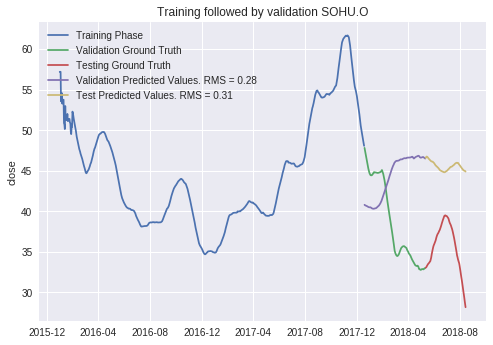

nan_company =====> []
Validation RMS acheived ===>  0.28244416961443997
Test RMS acheived ===>  0.3101383085060482
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 66s - loss: 0.3810
Epoch 2/10
 - 0s - loss: 0.3394
Epoch 3/10
 - 0s - loss: 0.2994
Epoch 4/10
 - 0s - loss: 0.2648
Epoch 5/10
 - 0s - loss: 0.2359
Epoch 6/10
 - 0s - loss: 0.2120
Epoch 7/10
 - 0s - loss: 0.1923
Epoch 8/10
 - 0s - loss: 0.1760
Epoch 9/10
 - 0s - loss: 0.1629
Epoch 10/10
 - 0s - loss: 0.1525
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
T

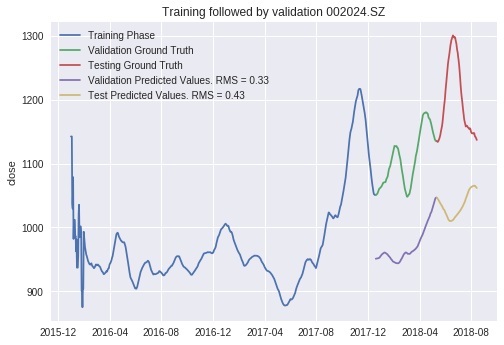

nan_company =====> []
Validation RMS acheived ===>  0.3279103476618528
Test RMS acheived ===>  0.42974264679161417
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 66s - loss: 0.1331
Epoch 2/10
 - 0s - loss: 0.1137
Epoch 3/10
 - 0s - loss: 0.0968
Epoch 4/10
 - 0s - loss: 0.0842
Epoch 5/10
 - 0s - loss: 0.0759
Epoch 6/10
 - 0s - loss: 0.0710
Epoch 7/10
 - 0s - loss: 0.0688
Epoch 8/10
 - 0s - loss: 0.0686
Epoch 9/10
 - 0s - loss: 0.0696
Epoch 10/10
 - 0s - loss: 0.0710
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

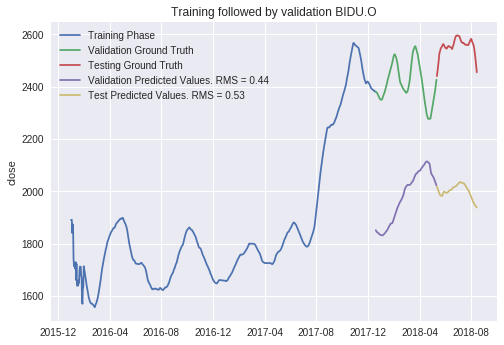

nan_company =====> []
Validation RMS acheived ===>  0.4358754142260731
Test RMS acheived ===>  0.5331344517650615
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 66s - loss: 0.8113
Epoch 2/10
 - 0s - loss: 0.7166
Epoch 3/10
 - 0s - loss: 0.6223
Epoch 4/10
 - 0s - loss: 0.5391
Epoch 5/10
 - 0s - loss: 0.4700
Epoch 6/10
 - 0s - loss: 0.4160
Epoch 7/10
 - 0s - loss: 0.3763
Epoch 8/10
 - 0s - loss: 0.3489
Epoch 9/10
 - 0s - loss: 0.3304
Epoch 10/10
 - 0s - loss: 0.3169
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

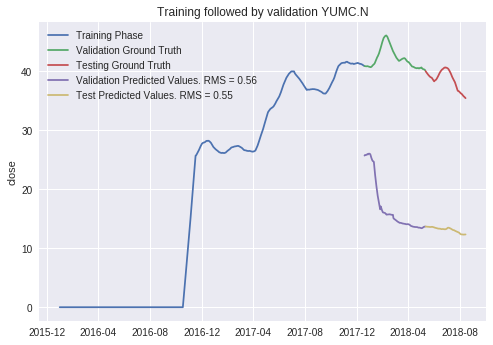

nan_company =====> []
Validation RMS acheived ===>  0.5591849835441306
Test RMS acheived ===>  0.5543287008639934
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 68s - loss: 0.4349
Epoch 2/10
 - 0s - loss: 0.3549
Epoch 3/10
 - 0s - loss: 0.2797
Epoch 4/10
 - 0s - loss: 0.2177
Epoch 5/10
 - 0s - loss: 0.1703
Epoch 6/10
 - 0s - loss: 0.1364
Epoch 7/10
 - 0s - loss: 0.1143
Epoch 8/10
 - 0s - loss: 0.1020
Epoch 9/10
 - 0s - loss: 0.0972
Epoch 10/10
 - 0s - loss: 0.0977
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

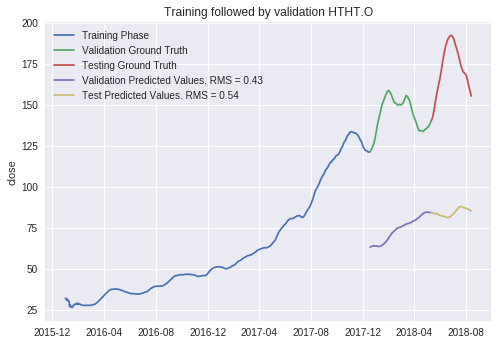

nan_company =====> []
Validation RMS acheived ===>  0.4306421650847599
Test RMS acheived ===>  0.5386712746403602
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 67s - loss: 0.6881
Epoch 2/10
 - 0s - loss: 0.6176
Epoch 3/10
 - 0s - loss: 0.5454
Epoch 4/10
 - 0s - loss: 0.4787
Epoch 5/10
 - 0s - loss: 0.4196
Epoch 6/10
 - 0s - loss: 0.3685
Epoch 7/10
 - 0s - loss: 0.3249
Epoch 8/10
 - 0s - loss: 0.2881
Epoch 9/10
 - 0s - loss: 0.2573
Epoch 10/10
 - 0s - loss: 0.2315
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

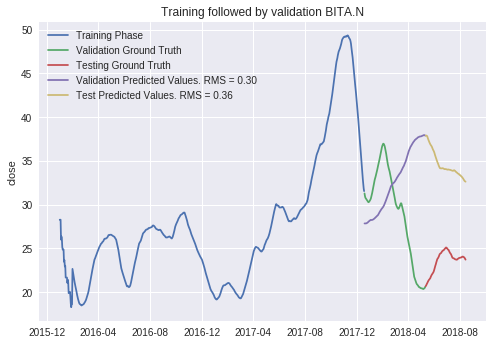

nan_company =====> []
Validation RMS acheived ===>  0.297136082435156
Test RMS acheived ===>  0.3648644907341162
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 68s - loss: 0.7098
Epoch 2/10
 - 0s - loss: 0.6099
Epoch 3/10
 - 0s - loss: 0.5144
Epoch 4/10
 - 0s - loss: 0.4330
Epoch 5/10
 - 0s - loss: 0.3665
Epoch 6/10
 - 0s - loss: 0.3136
Epoch 7/10
 - 0s - loss: 0.2727
Epoch 8/10
 - 0s - loss: 0.2427
Epoch 9/10
 - 0s - loss: 0.2224
Epoch 10/10
 - 0s - loss: 0.2104
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

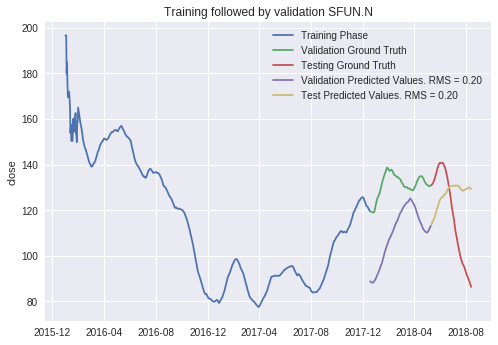

nan_company =====> []
Validation RMS acheived ===>  0.19689799628336874
Test RMS acheived ===>  0.19878714785012233
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 69s - loss: 0.4460
Epoch 2/10
 - 0s - loss: 0.3943
Epoch 3/10
 - 0s - loss: 0.3487
Epoch 4/10
 - 0s - loss: 0.3154
Epoch 5/10
 - 0s - loss: 0.2946
Epoch 6/10
 - 0s - loss: 0.2830
Epoch 7/10
 - 0s - loss: 0.2764
Epoch 8/10
 - 0s - loss: 0.2711
Epoch 9/10
 - 0s - loss: 0.2650
Epoch 10/10
 - 0s - loss: 0.2576
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

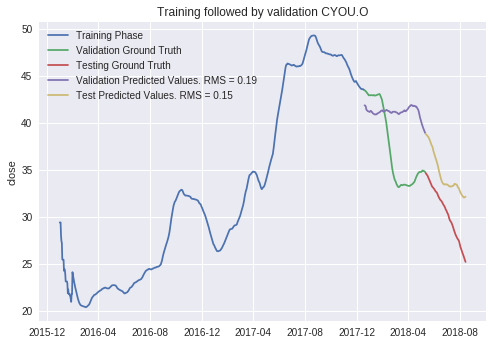

nan_company =====> []
Validation RMS acheived ===>  0.1937788809683751
Test RMS acheived ===>  0.1499309565643666
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 69s - loss: 0.5107
Epoch 2/10
 - 0s - loss: 0.4288
Epoch 3/10
 - 0s - loss: 0.3572
Epoch 4/10
 - 0s - loss: 0.3017
Epoch 5/10
 - 0s - loss: 0.2594
Epoch 6/10
 - 0s - loss: 0.2265
Epoch 7/10
 - 0s - loss: 0.2004
Epoch 8/10
 - 0s - loss: 0.1799
Epoch 9/10
 - 0s - loss: 0.1643
Epoch 10/10
 - 0s - loss: 0.1535
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

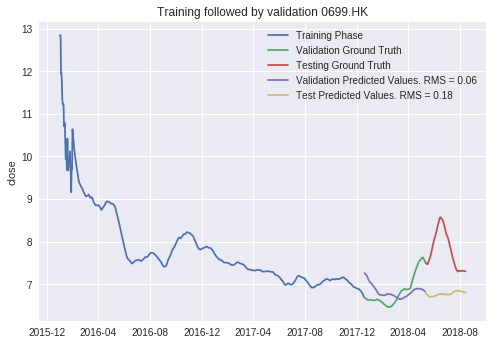

nan_company =====> []
Validation RMS acheived ===>  0.05768238416309062
Test RMS acheived ===>  0.17923090543553583
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 70s - loss: 0.1203
Epoch 2/10
 - 0s - loss: 0.1072
Epoch 3/10
 - 0s - loss: 0.0976
Epoch 4/10
 - 0s - loss: 0.0925
Epoch 5/10
 - 0s - loss: 0.0908
Epoch 6/10
 - 0s - loss: 0.0906
Epoch 7/10
 - 0s - loss: 0.0903
Epoch 8/10
 - 0s - loss: 0.0890
Epoch 9/10
 - 0s - loss: 0.0865
Epoch 10/10
 - 0s - loss: 0.0836
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

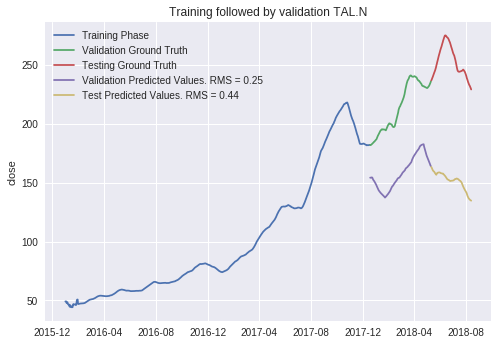

nan_company =====> []
Validation RMS acheived ===>  0.24732725263718744
Test RMS acheived ===>  0.44074103289828825
The train-test accuracy:  0.30213573049180337


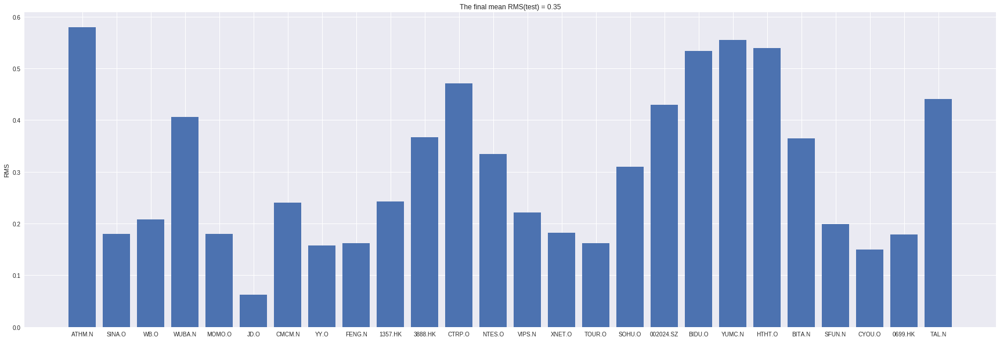

Iter Count======================> 8
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 70s - loss: 0.1796
Epoch 2/10
 - 0s - loss: 0.1606
Epoch 3/10
 - 0s - loss: 0.1432
Epoch 4/10
 - 0s - loss: 0.1298
Epoch 5/10
 - 0s - loss: 0.1209
Epoch 6/10
 - 0s - loss: 0.1162
Epoch 7/10
 - 0s - loss: 0.1146
Epoch 8/10
 - 0s - loss: 0.1147
Epoch 9/10
 - 0s - loss: 0.1146
Epoch 10/10
 - 0s - loss: 0.1134
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
______________

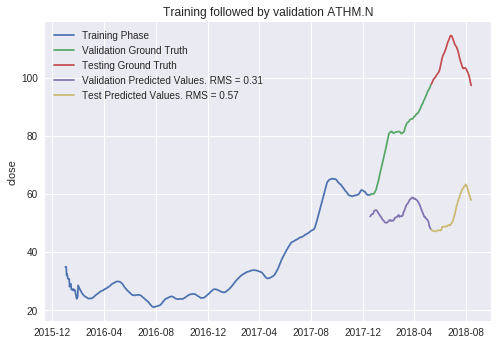

nan_company =====> []
Validation RMS acheived ===>  0.30906630571027177
Test RMS acheived ===>  0.5701511599512542
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 70s - loss: 0.5471
Epoch 2/10
 - 0s - loss: 0.4962
Epoch 3/10
 - 0s - loss: 0.4473
Epoch 4/10
 - 0s - loss: 0.4069
Epoch 5/10
 - 0s - loss: 0.3766
Epoch 6/10
 - 0s - loss: 0.3557
Epoch 7/10
 - 0s - loss: 0.3422
Epoch 8/10
 - 0s - loss: 0.3327
Epoch 9/10
 - 0s - loss: 0.3242
Epoch 10/10
 - 0s - loss: 0.3149
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

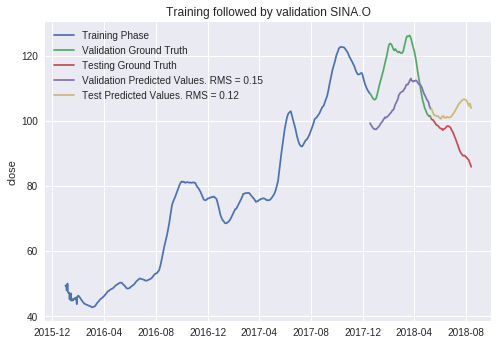

nan_company =====> []
Validation RMS acheived ===>  0.15078639311252365
Test RMS acheived ===>  0.12459614239287378
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 70s - loss: 0.1203
Epoch 2/10
 - 0s - loss: 0.0952
Epoch 3/10
 - 0s - loss: 0.0764
Epoch 4/10
 - 0s - loss: 0.0658
Epoch 5/10
 - 0s - loss: 0.0610
Epoch 6/10
 - 0s - loss: 0.0585
Epoch 7/10
 - 0s - loss: 0.0560
Epoch 8/10
 - 0s - loss: 0.0524
Epoch 9/10
 - 0s - loss: 0.0481
Epoch 10/10
 - 0s - loss: 0.0440
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

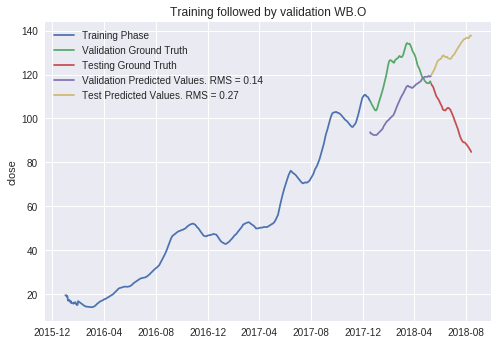

nan_company =====> []
Validation RMS acheived ===>  0.13782966936969884
Test RMS acheived ===>  0.2727540853365367
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 72s - loss: 0.7347
Epoch 2/10
 - 0s - loss: 0.5727
Epoch 3/10
 - 0s - loss: 0.4242
Epoch 4/10
 - 0s - loss: 0.3077
Epoch 5/10
 - 0s - loss: 0.2255
Epoch 6/10
 - 0s - loss: 0.1747
Epoch 7/10
 - 0s - loss: 0.1494
Epoch 8/10
 - 0s - loss: 0.1423
Epoch 9/10
 - 0s - loss: 0.1453
Epoch 10/10
 - 0s - loss: 0.1512
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

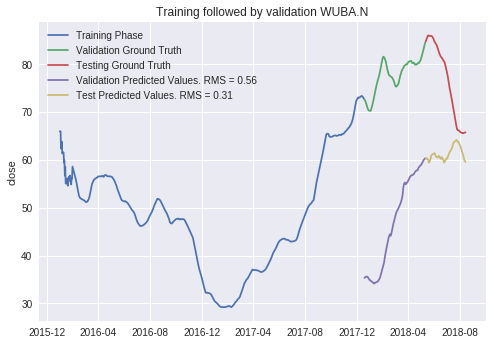

nan_company =====> []
Validation RMS acheived ===>  0.5599841421695468
Test RMS acheived ===>  0.31388109156577043
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 72s - loss: 0.4082
Epoch 2/10
 - 0s - loss: 0.3540
Epoch 3/10
 - 0s - loss: 0.2979
Epoch 4/10
 - 0s - loss: 0.2464
Epoch 5/10
 - 0s - loss: 0.2020
Epoch 6/10
 - 0s - loss: 0.1665
Epoch 7/10
 - 0s - loss: 0.1407
Epoch 8/10
 - 0s - loss: 0.1245
Epoch 9/10
 - 0s - loss: 0.1167
Epoch 10/10
 - 0s - loss: 0.1148
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

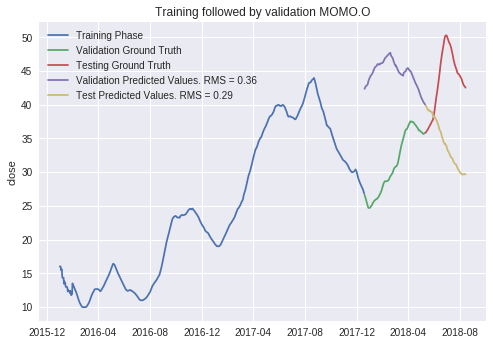

nan_company =====> []
Validation RMS acheived ===>  0.3597388693951872
Test RMS acheived ===>  0.2947075362293796
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 72s - loss: 0.2339
Epoch 2/10
 - 0s - loss: 0.2028
Epoch 3/10
 - 0s - loss: 0.1762
Epoch 4/10
 - 0s - loss: 0.1563
Epoch 5/10
 - 0s - loss: 0.1411
Epoch 6/10
 - 0s - loss: 0.1284
Epoch 7/10
 - 0s - loss: 0.1168
Epoch 8/10
 - 0s - loss: 0.1062
Epoch 9/10
 - 0s - loss: 0.0971
Epoch 10/10
 - 0s - loss: 0.0899
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

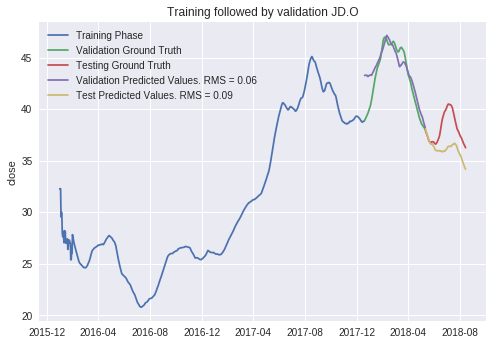

nan_company =====> []
Validation RMS acheived ===>  0.05655673039076759
Test RMS acheived ===>  0.09242703272697506
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 73s - loss: 0.7887
Epoch 2/10
 - 0s - loss: 0.6554
Epoch 3/10
 - 0s - loss: 0.5409
Epoch 4/10
 - 0s - loss: 0.4571
Epoch 5/10
 - 0s - loss: 0.4000
Epoch 6/10
 - 0s - loss: 0.3600
Epoch 7/10
 - 0s - loss: 0.3285
Epoch 8/10
 - 0s - loss: 0.3017
Epoch 9/10
 - 0s - loss: 0.2793
Epoch 10/10
 - 0s - loss: 0.2624
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

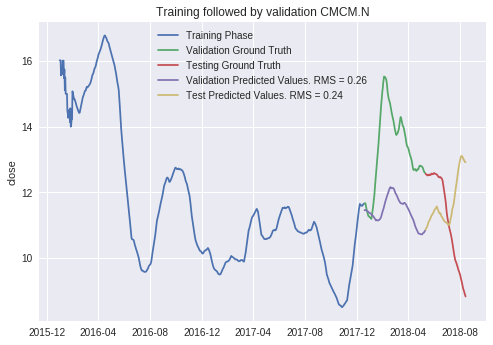

nan_company =====> []
Validation RMS acheived ===>  0.26040338578691496
Test RMS acheived ===>  0.2429610653312215
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 73s - loss: 0.1634
Epoch 2/10
 - 0s - loss: 0.1351
Epoch 3/10
 - 0s - loss: 0.1084
Epoch 4/10
 - 0s - loss: 0.0865
Epoch 5/10
 - 0s - loss: 0.0699
Epoch 6/10
 - 0s - loss: 0.0581
Epoch 7/10
 - 0s - loss: 0.0505
Epoch 8/10
 - 0s - loss: 0.0463
Epoch 9/10
 - 0s - loss: 0.0445
Epoch 10/10
 - 0s - loss: 0.0441
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

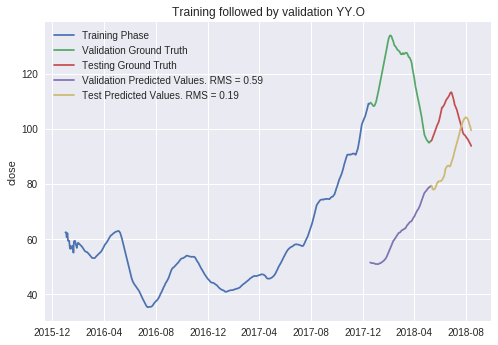

nan_company =====> []
Validation RMS acheived ===>  0.5906127834194266
Test RMS acheived ===>  0.18612208815024517
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 73s - loss: 0.3537
Epoch 2/10
 - 0s - loss: 0.3143
Epoch 3/10
 - 0s - loss: 0.2780
Epoch 4/10
 - 0s - loss: 0.2481
Epoch 5/10
 - 0s - loss: 0.2245
Epoch 6/10
 - 0s - loss: 0.2068
Epoch 7/10
 - 0s - loss: 0.1941
Epoch 8/10
 - 0s - loss: 0.1853
Epoch 9/10
 - 0s - loss: 0.1795
Epoch 10/10
 - 0s - loss: 0.1757
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

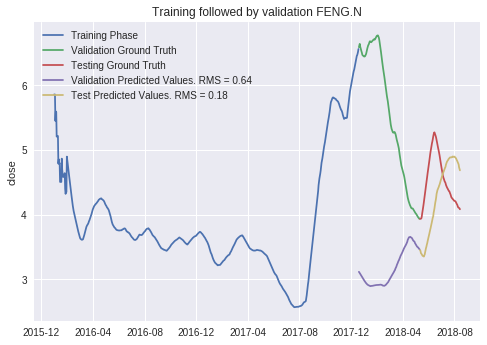

nan_company =====> []
Validation RMS acheived ===>  0.6401652118290538
Test RMS acheived ===>  0.18076223791040077
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 74s - loss: 1.0687
Epoch 2/10
 - 0s - loss: 0.9856
Epoch 3/10
 - 0s - loss: 0.8990
Epoch 4/10
 - 0s - loss: 0.8173
Epoch 5/10
 - 0s - loss: 0.7428
Epoch 6/10
 - 0s - loss: 0.6762
Epoch 7/10
 - 0s - loss: 0.6174
Epoch 8/10
 - 0s - loss: 0.5660
Epoch 9/10
 - 0s - loss: 0.5215
Epoch 10/10
 - 0s - loss: 0.4836
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

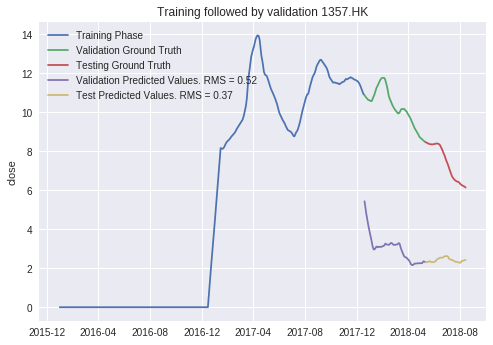

nan_company =====> []
Validation RMS acheived ===>  0.5234066044270321
Test RMS acheived ===>  0.3667808205449437
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 74s - loss: 0.2743
Epoch 2/10
 - 0s - loss: 0.2526
Epoch 3/10
 - 0s - loss: 0.2318
Epoch 4/10
 - 0s - loss: 0.2139
Epoch 5/10
 - 0s - loss: 0.1988
Epoch 6/10
 - 0s - loss: 0.1861
Epoch 7/10
 - 0s - loss: 0.1756
Epoch 8/10
 - 0s - loss: 0.1675
Epoch 9/10
 - 0s - loss: 0.1621
Epoch 10/10
 - 0s - loss: 0.1590
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

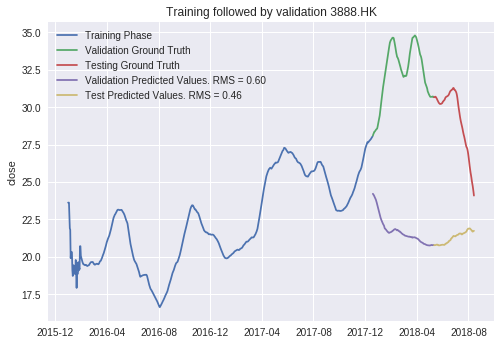

nan_company =====> []
Validation RMS acheived ===>  0.6009213578342313
Test RMS acheived ===>  0.4620028068776369
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 74s - loss: 0.3258
Epoch 2/10
 - 0s - loss: 0.2804
Epoch 3/10
 - 0s - loss: 0.2380
Epoch 4/10
 - 0s - loss: 0.2048
Epoch 5/10
 - 0s - loss: 0.1817
Epoch 6/10
 - 0s - loss: 0.1670
Epoch 7/10
 - 0s - loss: 0.1572
Epoch 8/10
 - 0s - loss: 0.1491
Epoch 9/10
 - 0s - loss: 0.1409
Epoch 10/10
 - 0s - loss: 0.1328
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

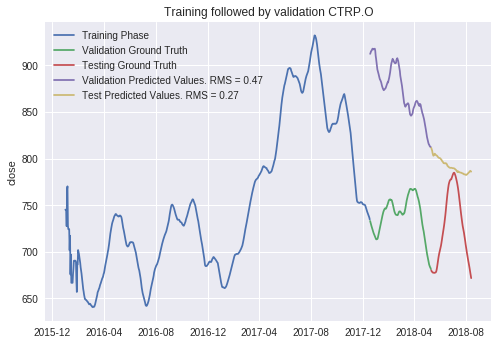

nan_company =====> []
Validation RMS acheived ===>  0.47445981194154035
Test RMS acheived ===>  0.26651004411531853
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 75s - loss: 0.1731
Epoch 2/10
 - 0s - loss: 0.1504
Epoch 3/10
 - 0s - loss: 0.1297
Epoch 4/10
 - 0s - loss: 0.1135
Epoch 5/10
 - 0s - loss: 0.1021
Epoch 6/10
 - 0s - loss: 0.0947
Epoch 7/10
 - 0s - loss: 0.0902
Epoch 8/10
 - 0s - loss: 0.0871
Epoch 9/10
 - 0s - loss: 0.0843
Epoch 10/10
 - 0s - loss: 0.0814
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

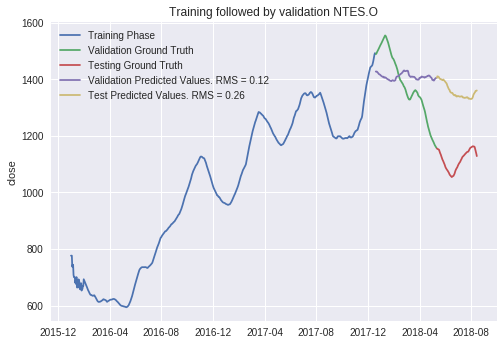

nan_company =====> []
Validation RMS acheived ===>  0.12158158693804838
Test RMS acheived ===>  0.25680331370473763
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 75s - loss: 0.8406
Epoch 2/10
 - 0s - loss: 0.6814
Epoch 3/10
 - 0s - loss: 0.5411
Epoch 4/10
 - 0s - loss: 0.4384
Epoch 5/10
 - 0s - loss: 0.3736
Epoch 6/10
 - 0s - loss: 0.3392
Epoch 7/10
 - 0s - loss: 0.3242
Epoch 8/10
 - 0s - loss: 0.3181
Epoch 9/10
 - 0s - loss: 0.3129
Epoch 10/10
 - 0s - loss: 0.3046
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

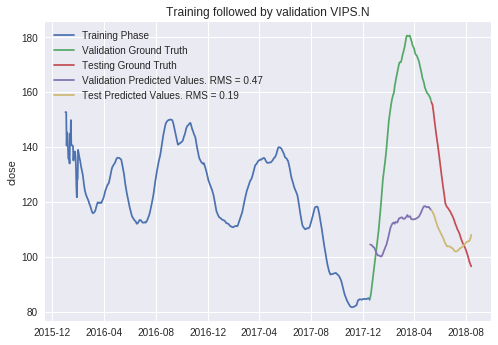

nan_company =====> []
Validation RMS acheived ===>  0.47468310793928387
Test RMS acheived ===>  0.1908252724699751
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 76s - loss: 0.1969
Epoch 2/10
 - 0s - loss: 0.1474
Epoch 3/10
 - 0s - loss: 0.1019
Epoch 4/10
 - 0s - loss: 0.0674
Epoch 5/10
 - 0s - loss: 0.0457
Epoch 6/10
 - 0s - loss: 0.0362
Epoch 7/10
 - 0s - loss: 0.0362
Epoch 8/10
 - 0s - loss: 0.0412
Epoch 9/10
 - 0s - loss: 0.0461
Epoch 10/10
 - 0s - loss: 0.0480
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

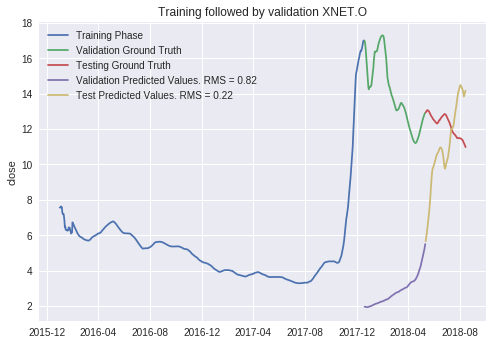

nan_company =====> []
Validation RMS acheived ===>  0.8153018878035414
Test RMS acheived ===>  0.22074766658905515
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 76s - loss: 0.4347
Epoch 2/10
 - 0s - loss: 0.3826
Epoch 3/10
 - 0s - loss: 0.3339
Epoch 4/10
 - 0s - loss: 0.2939
Epoch 5/10
 - 0s - loss: 0.2628
Epoch 6/10
 - 0s - loss: 0.2398
Epoch 7/10
 - 0s - loss: 0.2234
Epoch 8/10
 - 0s - loss: 0.2124
Epoch 9/10
 - 0s - loss: 0.2056
Epoch 10/10
 - 0s - loss: 0.2016
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

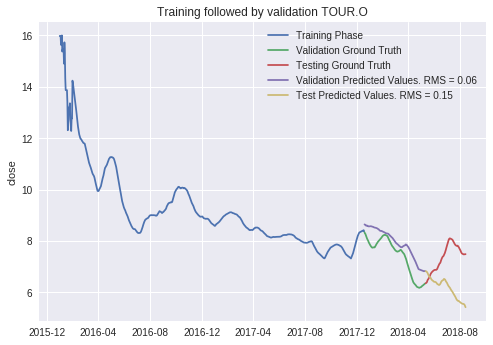

nan_company =====> []
Validation RMS acheived ===>  0.05738500165786477
Test RMS acheived ===>  0.14674251143310868
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 76s - loss: 0.5784
Epoch 2/10
 - 0s - loss: 0.4851
Epoch 3/10
 - 0s - loss: 0.3970
Epoch 4/10
 - 0s - loss: 0.3235
Epoch 5/10
 - 0s - loss: 0.2661
Epoch 6/10
 - 0s - loss: 0.2234
Epoch 7/10
 - 0s - loss: 0.1931
Epoch 8/10
 - 0s - loss: 0.1723
Epoch 9/10
 - 0s - loss: 0.1579
Epoch 10/10
 - 0s - loss: 0.1474
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

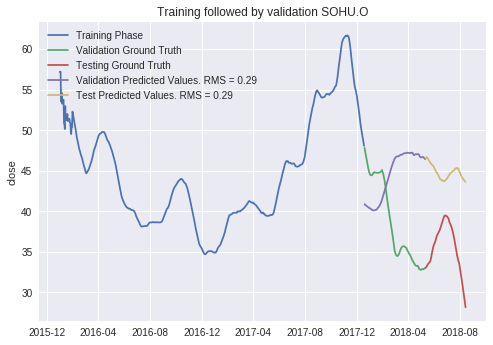

nan_company =====> []
Validation RMS acheived ===>  0.2912605839537979
Test RMS acheived ===>  0.2898097732914836
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 77s - loss: 0.3569
Epoch 2/10
 - 0s - loss: 0.3184
Epoch 3/10
 - 0s - loss: 0.2815
Epoch 4/10
 - 0s - loss: 0.2497
Epoch 5/10
 - 0s - loss: 0.2234
Epoch 6/10
 - 0s - loss: 0.2019
Epoch 7/10
 - 0s - loss: 0.1843
Epoch 8/10
 - 0s - loss: 0.1697
Epoch 9/10
 - 0s - loss: 0.1577
Epoch 10/10
 - 0s - loss: 0.1478
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
To

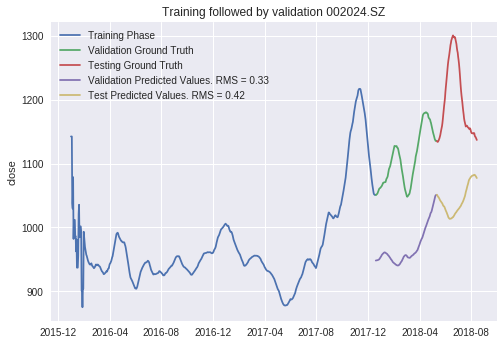

nan_company =====> []
Validation RMS acheived ===>  0.33342740540128607
Test RMS acheived ===>  0.41600844578437113
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 77s - loss: 0.1338
Epoch 2/10
 - 0s - loss: 0.1118
Epoch 3/10
 - 0s - loss: 0.0929
Epoch 4/10
 - 0s - loss: 0.0795
Epoch 5/10
 - 0s - loss: 0.0715
Epoch 6/10
 - 0s - loss: 0.0680
Epoch 7/10
 - 0s - loss: 0.0675
Epoch 8/10
 - 0s - loss: 0.0685
Epoch 9/10
 - 0s - loss: 0.0698
Epoch 10/10
 - 0s - loss: 0.0705
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

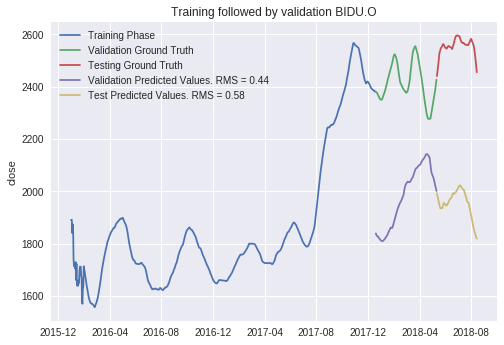

nan_company =====> []
Validation RMS acheived ===>  0.43815058784056427
Test RMS acheived ===>  0.5767135348721472
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 78s - loss: 0.8784
Epoch 2/10
 - 0s - loss: 0.7620
Epoch 3/10
 - 0s - loss: 0.6501
Epoch 4/10
 - 0s - loss: 0.5556
Epoch 5/10
 - 0s - loss: 0.4811
Epoch 6/10
 - 0s - loss: 0.4256
Epoch 7/10
 - 0s - loss: 0.3866
Epoch 8/10
 - 0s - loss: 0.3598
Epoch 9/10
 - 0s - loss: 0.3406
Epoch 10/10
 - 0s - loss: 0.3250
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

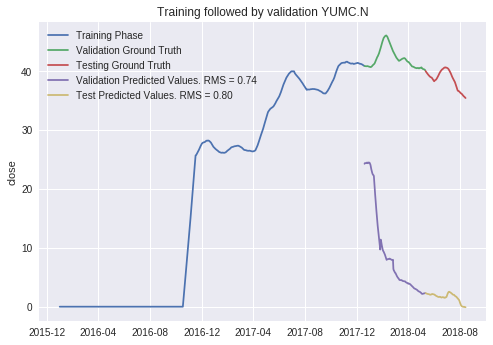

nan_company =====> []
Validation RMS acheived ===>  0.7350275074823837
Test RMS acheived ===>  0.8043194153141728
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 78s - loss: 0.4640
Epoch 2/10
 - 0s - loss: 0.3789
Epoch 3/10
 - 0s - loss: 0.2993
Epoch 4/10
 - 0s - loss: 0.2342
Epoch 5/10
 - 0s - loss: 0.1843
Epoch 6/10
 - 0s - loss: 0.1484
Epoch 7/10
 - 0s - loss: 0.1245
Epoch 8/10
 - 0s - loss: 0.1104
Epoch 9/10
 - 0s - loss: 0.1039
Epoch 10/10
 - 0s - loss: 0.1027
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

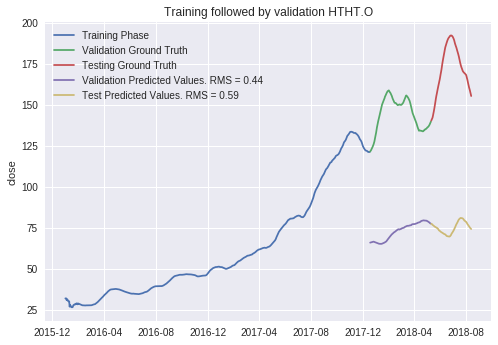

nan_company =====> []
Validation RMS acheived ===>  0.43644709842107365
Test RMS acheived ===>  0.5947274210122054
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 78s - loss: 0.6117
Epoch 2/10
 - 0s - loss: 0.5465
Epoch 3/10
 - 0s - loss: 0.4810
Epoch 4/10
 - 0s - loss: 0.4218
Epoch 5/10
 - 0s - loss: 0.3703
Epoch 6/10
 - 0s - loss: 0.3263
Epoch 7/10
 - 0s - loss: 0.2888
Epoch 8/10
 - 0s - loss: 0.2568
Epoch 9/10
 - 0s - loss: 0.2297
Epoch 10/10
 - 0s - loss: 0.2065
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

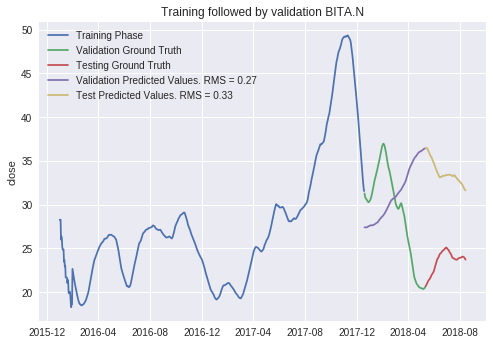

nan_company =====> []
Validation RMS acheived ===>  0.26926439861379703
Test RMS acheived ===>  0.33398806985067564
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 80s - loss: 0.5216
Epoch 2/10
 - 0s - loss: 0.4610
Epoch 3/10
 - 0s - loss: 0.4007
Epoch 4/10
 - 0s - loss: 0.3471
Epoch 5/10
 - 0s - loss: 0.3018
Epoch 6/10
 - 0s - loss: 0.2656
Epoch 7/10
 - 0s - loss: 0.2382
Epoch 8/10
 - 0s - loss: 0.2188
Epoch 9/10
 - 0s - loss: 0.2061
Epoch 10/10
 - 0s - loss: 0.1990
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

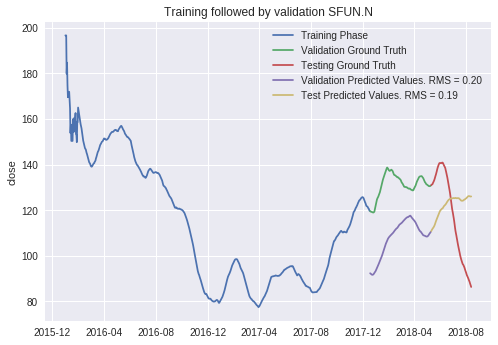

nan_company =====> []
Validation RMS acheived ===>  0.20097612185912295
Test RMS acheived ===>  0.1883457181383749
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 80s - loss: 0.4340
Epoch 2/10
 - 0s - loss: 0.3836
Epoch 3/10
 - 0s - loss: 0.3386
Epoch 4/10
 - 0s - loss: 0.3053
Epoch 5/10
 - 0s - loss: 0.2843
Epoch 6/10
 - 0s - loss: 0.2731
Epoch 7/10
 - 0s - loss: 0.2678
Epoch 8/10
 - 0s - loss: 0.2647
Epoch 9/10
 - 0s - loss: 0.2611
Epoch 10/10
 - 0s - loss: 0.2562
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

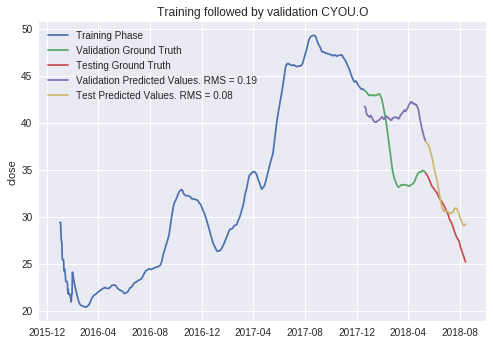

nan_company =====> []
Validation RMS acheived ===>  0.19210438173156877
Test RMS acheived ===>  0.08106139938412246
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 80s - loss: 0.4897
Epoch 2/10
 - 0s - loss: 0.4237
Epoch 3/10
 - 0s - loss: 0.3597
Epoch 4/10
 - 0s - loss: 0.3039
Epoch 5/10
 - 0s - loss: 0.2573
Epoch 6/10
 - 0s - loss: 0.2198
Epoch 7/10
 - 0s - loss: 0.1909
Epoch 8/10
 - 0s - loss: 0.1699
Epoch 9/10
 - 0s - loss: 0.1558
Epoch 10/10
 - 0s - loss: 0.1476
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

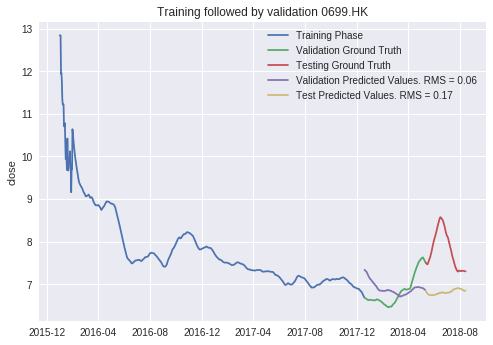

nan_company =====> []
Validation RMS acheived ===>  0.061445080089210194
Test RMS acheived ===>  0.1737979838622103
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 81s - loss: 0.1138
Epoch 2/10
 - 0s - loss: 0.1023
Epoch 3/10
 - 0s - loss: 0.0943
Epoch 4/10
 - 0s - loss: 0.0905
Epoch 5/10
 - 0s - loss: 0.0893
Epoch 6/10
 - 0s - loss: 0.0888
Epoch 7/10
 - 0s - loss: 0.0877
Epoch 8/10
 - 0s - loss: 0.0855
Epoch 9/10
 - 0s - loss: 0.0827
Epoch 10/10
 - 0s - loss: 0.0801
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

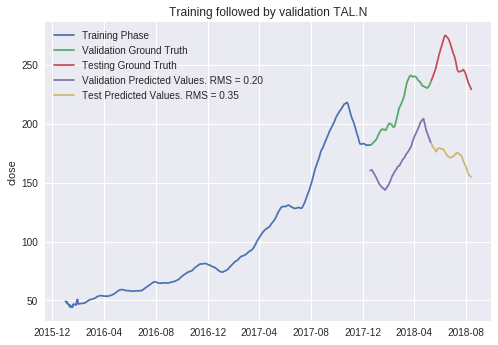

nan_company =====> []
Validation RMS acheived ===>  0.19609997498299056
Test RMS acheived ===>  0.3519062980952301
The train-test accuracy:  0.3076712667282471


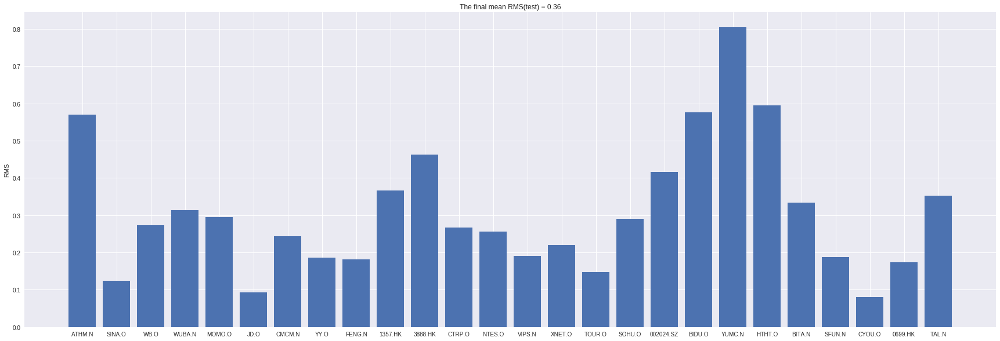

Iter Count======================> 9
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 82s - loss: 0.1807
Epoch 2/10
 - 0s - loss: 0.1609
Epoch 3/10
 - 0s - loss: 0.1430
Epoch 4/10
 - 0s - loss: 0.1294
Epoch 5/10
 - 0s - loss: 0.1203
Epoch 6/10
 - 0s - loss: 0.1151
Epoch 7/10
 - 0s - loss: 0.1131
Epoch 8/10
 - 0s - loss: 0.1128
Epoch 9/10
 - 0s - loss: 0.1126
Epoch 10/10
 - 0s - loss: 0.1114
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
______________

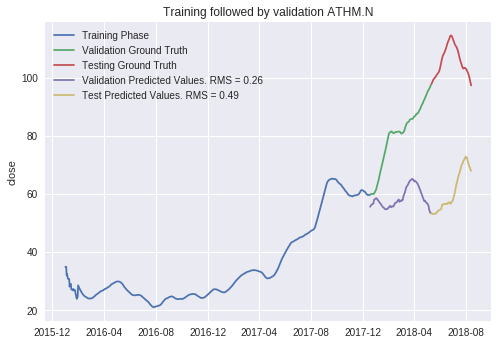

nan_company =====> []
Validation RMS acheived ===>  0.25609749945457877
Test RMS acheived ===>  0.4894872349844331
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 82s - loss: 0.5223
Epoch 2/10
 - 0s - loss: 0.4736
Epoch 3/10
 - 0s - loss: 0.4281
Epoch 4/10
 - 0s - loss: 0.3921
Epoch 5/10
 - 0s - loss: 0.3666
Epoch 6/10
 - 0s - loss: 0.3500
Epoch 7/10
 - 0s - loss: 0.3387
Epoch 8/10
 - 0s - loss: 0.3290
Epoch 9/10
 - 0s - loss: 0.3184
Epoch 10/10
 - 0s - loss: 0.3062
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

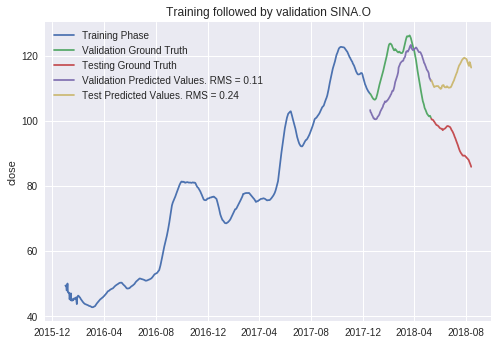

nan_company =====> []
Validation RMS acheived ===>  0.11268841068121487
Test RMS acheived ===>  0.24243612073690549
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 83s - loss: 0.1101
Epoch 2/10
 - 0s - loss: 0.0875
Epoch 3/10
 - 0s - loss: 0.0718
Epoch 4/10
 - 0s - loss: 0.0639
Epoch 5/10
 - 0s - loss: 0.0603
Epoch 6/10
 - 0s - loss: 0.0573
Epoch 7/10
 - 0s - loss: 0.0534
Epoch 8/10
 - 0s - loss: 0.0487
Epoch 9/10
 - 0s - loss: 0.0442
Epoch 10/10
 - 0s - loss: 0.0411
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

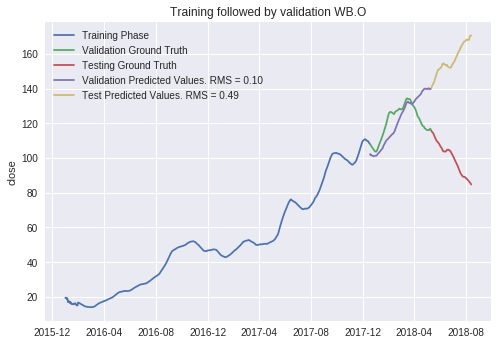

nan_company =====> []
Validation RMS acheived ===>  0.09552793229726401
Test RMS acheived ===>  0.49061621260037724
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 83s - loss: 0.8244
Epoch 2/10
 - 0s - loss: 0.6324
Epoch 3/10
 - 0s - loss: 0.4585
Epoch 4/10
 - 0s - loss: 0.3239
Epoch 5/10
 - 0s - loss: 0.2300
Epoch 6/10
 - 0s - loss: 0.1724
Epoch 7/10
 - 0s - loss: 0.1437
Epoch 8/10
 - 0s - loss: 0.1356
Epoch 9/10
 - 0s - loss: 0.1392
Epoch 10/10
 - 0s - loss: 0.1468
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

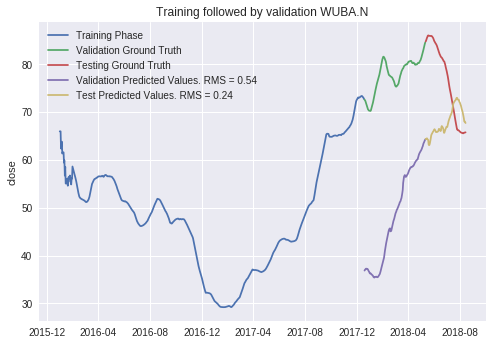

nan_company =====> []
Validation RMS acheived ===>  0.536501063871063
Test RMS acheived ===>  0.24165714794265752
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 84s - loss: 0.3850
Epoch 2/10
 - 0s - loss: 0.3296
Epoch 3/10
 - 0s - loss: 0.2731
Epoch 4/10
 - 0s - loss: 0.2222
Epoch 5/10
 - 0s - loss: 0.1801
Epoch 6/10
 - 0s - loss: 0.1484
Epoch 7/10
 - 0s - loss: 0.1278
Epoch 8/10
 - 0s - loss: 0.1175
Epoch 9/10
 - 0s - loss: 0.1149
Epoch 10/10
 - 0s - loss: 0.1156
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

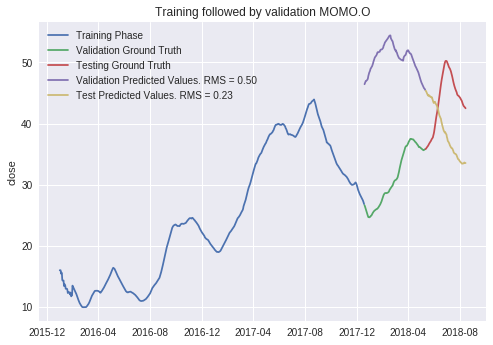

nan_company =====> []
Validation RMS acheived ===>  0.4965911197223382
Test RMS acheived ===>  0.2290414732696999
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 84s - loss: 0.2438
Epoch 2/10
 - 0s - loss: 0.2097
Epoch 3/10
 - 0s - loss: 0.1808
Epoch 4/10
 - 0s - loss: 0.1597
Epoch 5/10
 - 0s - loss: 0.1443
Epoch 6/10
 - 0s - loss: 0.1316
Epoch 7/10
 - 0s - loss: 0.1201
Epoch 8/10
 - 0s - loss: 0.1095
Epoch 9/10
 - 0s - loss: 0.1002
Epoch 10/10
 - 0s - loss: 0.0926
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

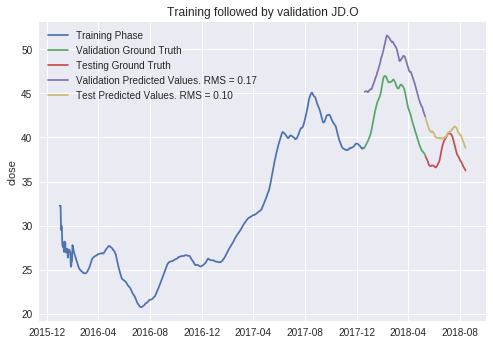

nan_company =====> []
Validation RMS acheived ===>  0.1706633253172533
Test RMS acheived ===>  0.10266294822221748
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 84s - loss: 0.8203
Epoch 2/10
 - 0s - loss: 0.6628
Epoch 3/10
 - 0s - loss: 0.5368
Epoch 4/10
 - 0s - loss: 0.4521
Epoch 5/10
 - 0s - loss: 0.3997
Epoch 6/10
 - 0s - loss: 0.3649
Epoch 7/10
 - 0s - loss: 0.3358
Epoch 8/10
 - 0s - loss: 0.3079
Epoch 9/10
 - 0s - loss: 0.2825
Epoch 10/10
 - 0s - loss: 0.2622
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

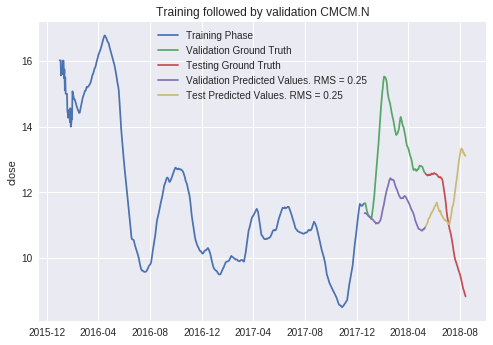

nan_company =====> []
Validation RMS acheived ===>  0.2458652070502456
Test RMS acheived ===>  0.2499498820627763
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 85s - loss: 0.1667
Epoch 2/10
 - 0s - loss: 0.1366
Epoch 3/10
 - 0s - loss: 0.1078
Epoch 4/10
 - 0s - loss: 0.0840
Epoch 5/10
 - 0s - loss: 0.0661
Epoch 6/10
 - 0s - loss: 0.0539
Epoch 7/10
 - 0s - loss: 0.0468
Epoch 8/10
 - 0s - loss: 0.0438
Epoch 9/10
 - 0s - loss: 0.0433
Epoch 10/10
 - 0s - loss: 0.0439
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params

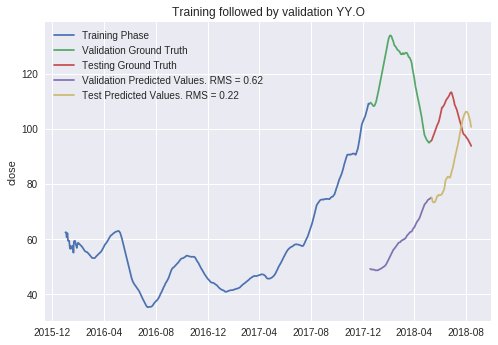

nan_company =====> []
Validation RMS acheived ===>  0.6209125765828712
Test RMS acheived ===>  0.2220077667023874
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 85s - loss: 0.3701
Epoch 2/10
 - 0s - loss: 0.3263
Epoch 3/10
 - 0s - loss: 0.2878
Epoch 4/10
 - 0s - loss: 0.2563
Epoch 5/10
 - 0s - loss: 0.2308
Epoch 6/10
 - 0s - loss: 0.2101
Epoch 7/10
 - 0s - loss: 0.1940
Epoch 8/10
 - 0s - loss: 0.1823
Epoch 9/10
 - 0s - loss: 0.1742
Epoch 10/10
 - 0s - loss: 0.1688
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

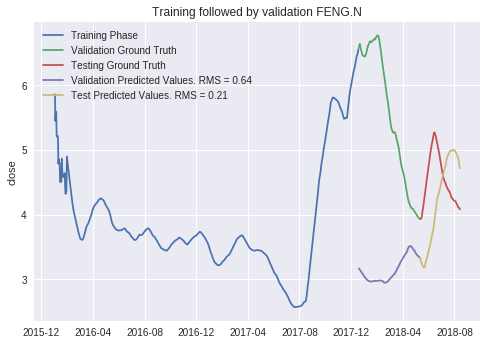

nan_company =====> []
Validation RMS acheived ===>  0.6352261234312396
Test RMS acheived ===>  0.21307709974784161
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 85s - loss: 1.0985
Epoch 2/10
 - 0s - loss: 1.0125
Epoch 3/10
 - 0s - loss: 0.9231
Epoch 4/10
 - 0s - loss: 0.8390
Epoch 5/10
 - 0s - loss: 0.7624
Epoch 6/10
 - 0s - loss: 0.6940
Epoch 7/10
 - 0s - loss: 0.6336
Epoch 8/10
 - 0s - loss: 0.5807
Epoch 9/10
 - 0s - loss: 0.5347
Epoch 10/10
 - 0s - loss: 0.4953
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

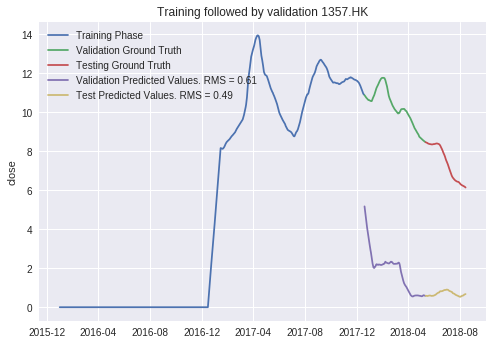

nan_company =====> []
Validation RMS acheived ===>  0.606017800229013
Test RMS acheived ===>  0.4890740419360239
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 86s - loss: 0.2636
Epoch 2/10
 - 0s - loss: 0.2427
Epoch 3/10
 - 0s - loss: 0.2235
Epoch 4/10
 - 0s - loss: 0.2075
Epoch 5/10
 - 0s - loss: 0.1941
Epoch 6/10
 - 0s - loss: 0.1828
Epoch 7/10
 - 0s - loss: 0.1734
Epoch 8/10
 - 0s - loss: 0.1662
Epoch 9/10
 - 0s - loss: 0.1615
Epoch 10/10
 - 0s - loss: 0.1588
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

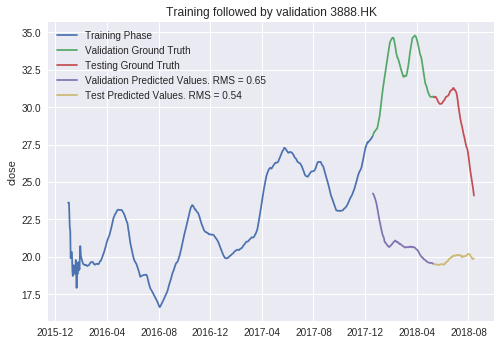

nan_company =====> []
Validation RMS acheived ===>  0.6450836514928413
Test RMS acheived ===>  0.5353159963904062
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 87s - loss: 0.2993
Epoch 2/10
 - 0s - loss: 0.2523
Epoch 3/10
 - 0s - loss: 0.2105
Epoch 4/10
 - 0s - loss: 0.1805
Epoch 5/10
 - 0s - loss: 0.1624
Epoch 6/10
 - 0s - loss: 0.1527
Epoch 7/10
 - 0s - loss: 0.1460
Epoch 8/10
 - 0s - loss: 0.1388
Epoch 9/10
 - 0s - loss: 0.1303
Epoch 10/10
 - 0s - loss: 0.1217
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

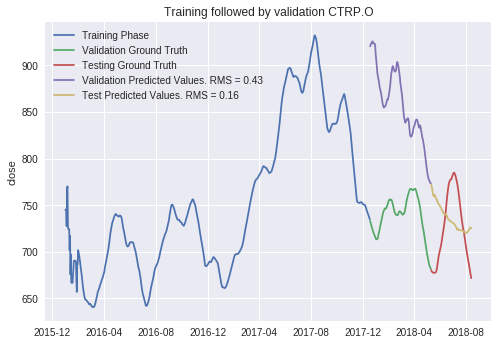

nan_company =====> []
Validation RMS acheived ===>  0.4326092733323595
Test RMS acheived ===>  0.16329272063598052
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 87s - loss: 0.1780
Epoch 2/10
 - 0s - loss: 0.1540
Epoch 3/10
 - 0s - loss: 0.1327
Epoch 4/10
 - 0s - loss: 0.1161
Epoch 5/10
 - 0s - loss: 0.1037
Epoch 6/10
 - 0s - loss: 0.0950
Epoch 7/10
 - 0s - loss: 0.0891
Epoch 8/10
 - 0s - loss: 0.0850
Epoch 9/10
 - 0s - loss: 0.0816
Epoch 10/10
 - 0s - loss: 0.0783
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

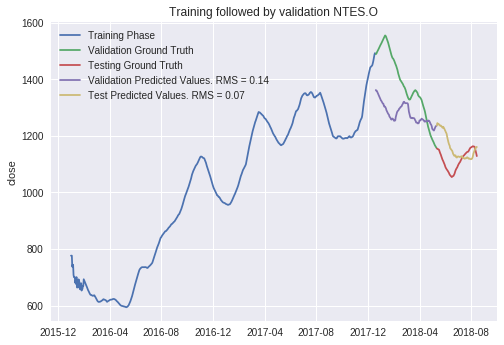

nan_company =====> []
Validation RMS acheived ===>  0.1444301422603205
Test RMS acheived ===>  0.07497957586803204
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 87s - loss: 0.7094
Epoch 2/10
 - 0s - loss: 0.5819
Epoch 3/10
 - 0s - loss: 0.4731
Epoch 4/10
 - 0s - loss: 0.3985
Epoch 5/10
 - 0s - loss: 0.3559
Epoch 6/10
 - 0s - loss: 0.3348
Epoch 7/10
 - 0s - loss: 0.3225
Epoch 8/10
 - 0s - loss: 0.3103
Epoch 9/10
 - 0s - loss: 0.2948
Epoch 10/10
 - 0s - loss: 0.2768
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

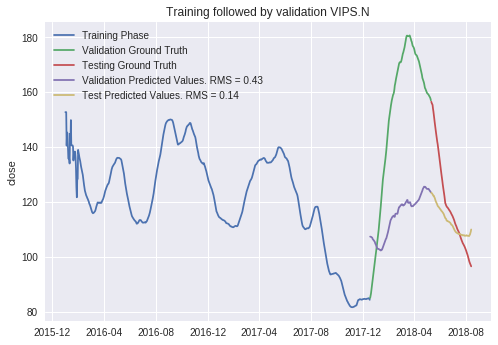

nan_company =====> []
Validation RMS acheived ===>  0.4331786359463165
Test RMS acheived ===>  0.13934320186850052
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 87s - loss: 0.2479
Epoch 2/10
 - 0s - loss: 0.1903
Epoch 3/10
 - 0s - loss: 0.1349
Epoch 4/10
 - 0s - loss: 0.0895
Epoch 5/10
 - 0s - loss: 0.0571
Epoch 6/10
 - 0s - loss: 0.0386
Epoch 7/10
 - 0s - loss: 0.0332
Epoch 8/10
 - 0s - loss: 0.0377
Epoch 9/10
 - 0s - loss: 0.0466
Epoch 10/10
 - 0s - loss: 0.0541
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

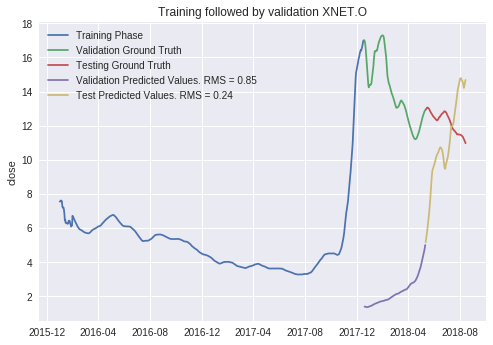

nan_company =====> []
Validation RMS acheived ===>  0.8549189629921845
Test RMS acheived ===>  0.2404782630144258
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 88s - loss: 0.4406
Epoch 2/10
 - 0s - loss: 0.3886
Epoch 3/10
 - 0s - loss: 0.3399
Epoch 4/10
 - 0s - loss: 0.3000
Epoch 5/10
 - 0s - loss: 0.2689
Epoch 6/10
 - 0s - loss: 0.2453
Epoch 7/10
 - 0s - loss: 0.2275
Epoch 8/10
 - 0s - loss: 0.2142
Epoch 9/10
 - 0s - loss: 0.2048
Epoch 10/10
 - 0s - loss: 0.1981
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

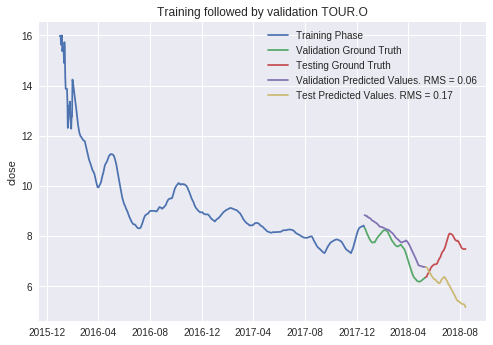

nan_company =====> []
Validation RMS acheived ===>  0.0574491631087866
Test RMS acheived ===>  0.1651941974023509
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 88s - loss: 0.5125
Epoch 2/10
 - 0s - loss: 0.4291
Epoch 3/10
 - 0s - loss: 0.3496
Epoch 4/10
 - 0s - loss: 0.2828
Epoch 5/10
 - 0s - loss: 0.2301
Epoch 6/10
 - 0s - loss: 0.1904
Epoch 7/10
 - 0s - loss: 0.1619
Epoch 8/10
 - 0s - loss: 0.1421
Epoch 9/10
 - 0s - loss: 0.1286
Epoch 10/10
 - 0s - loss: 0.1194
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

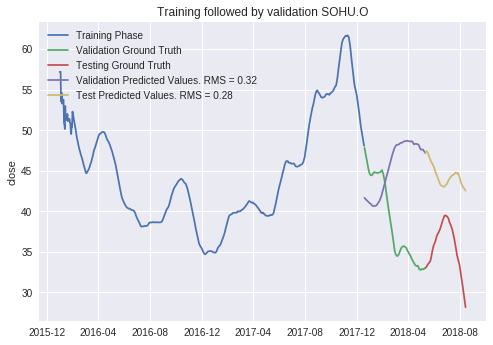

nan_company =====> []
Validation RMS acheived ===>  0.31745953475215816
Test RMS acheived ===>  0.2806085656524151
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 88s - loss: 0.3549
Epoch 2/10
 - 0s - loss: 0.3136
Epoch 3/10
 - 0s - loss: 0.2743
Epoch 4/10
 - 0s - loss: 0.2411
Epoch 5/10
 - 0s - loss: 0.2141
Epoch 6/10
 - 0s - loss: 0.1925
Epoch 7/10
 - 0s - loss: 0.1752
Epoch 8/10
 - 0s - loss: 0.1613
Epoch 9/10
 - 0s - loss: 0.1498
Epoch 10/10
 - 0s - loss: 0.1403
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
T

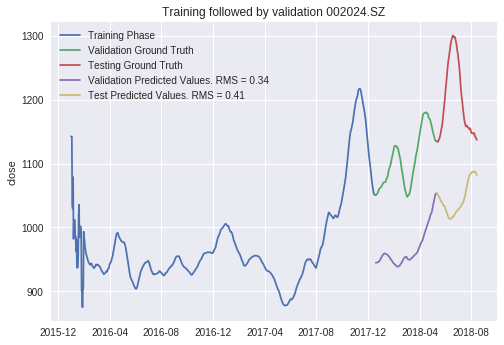

nan_company =====> []
Validation RMS acheived ===>  0.33895502085350965
Test RMS acheived ===>  0.4144110728627007
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 89s - loss: 0.1336
Epoch 2/10
 - 0s - loss: 0.1116
Epoch 3/10
 - 0s - loss: 0.0924
Epoch 4/10
 - 0s - loss: 0.0786
Epoch 5/10
 - 0s - loss: 0.0707
Epoch 6/10
 - 0s - loss: 0.0676
Epoch 7/10
 - 0s - loss: 0.0676
Epoch 8/10
 - 0s - loss: 0.0688
Epoch 9/10
 - 0s - loss: 0.0699
Epoch 10/10
 - 0s - loss: 0.0700
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

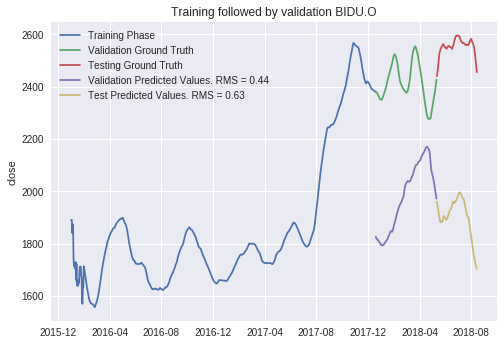

nan_company =====> []
Validation RMS acheived ===>  0.4425148852173278
Test RMS acheived ===>  0.6285736519818657
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 89s - loss: 0.9181
Epoch 2/10
 - 0s - loss: 0.7908
Epoch 3/10
 - 0s - loss: 0.6718
Epoch 4/10
 - 0s - loss: 0.5752
Epoch 5/10
 - 0s - loss: 0.5024
Epoch 6/10
 - 0s - loss: 0.4507
Epoch 7/10
 - 0s - loss: 0.4149
Epoch 8/10
 - 0s - loss: 0.3889
Epoch 9/10
 - 0s - loss: 0.3677
Epoch 10/10
 - 0s - loss: 0.3479
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

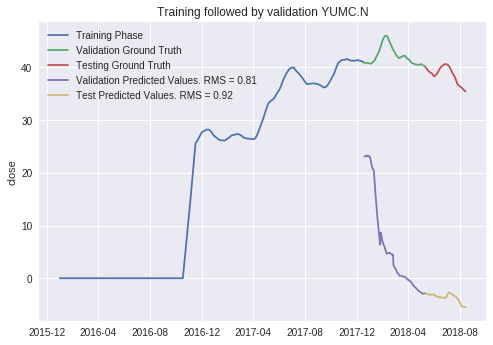

nan_company =====> []
Validation RMS acheived ===>  0.814628616219137
Test RMS acheived ===>  0.918765934843335
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 90s - loss: 0.4277
Epoch 2/10
 - 0s - loss: 0.3483
Epoch 3/10
 - 0s - loss: 0.2745
Epoch 4/10
 - 0s - loss: 0.2148
Epoch 5/10
 - 0s - loss: 0.1698
Epoch 6/10
 - 0s - loss: 0.1385
Epoch 7/10
 - 0s - loss: 0.1189
Epoch 8/10
 - 0s - loss: 0.1088
Epoch 9/10
 - 0s - loss: 0.1057
Epoch 10/10
 - 0s - loss: 0.1071
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

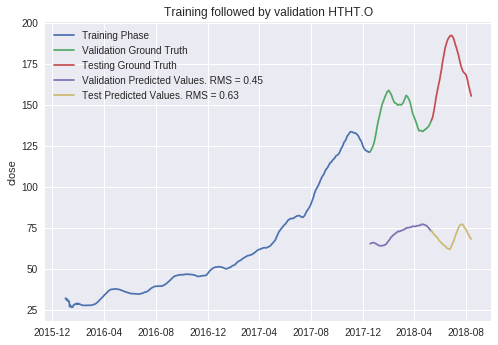

nan_company =====> []
Validation RMS acheived ===>  0.44541115682187016
Test RMS acheived ===>  0.6298048261734439
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 91s - loss: 0.6047
Epoch 2/10
 - 0s - loss: 0.5372
Epoch 3/10
 - 0s - loss: 0.4703
Epoch 4/10
 - 0s - loss: 0.4108
Epoch 5/10
 - 0s - loss: 0.3599
Epoch 6/10
 - 0s - loss: 0.3170
Epoch 7/10
 - 0s - loss: 0.2810
Epoch 8/10
 - 0s - loss: 0.2505
Epoch 9/10
 - 0s - loss: 0.2246
Epoch 10/10
 - 0s - loss: 0.2023
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

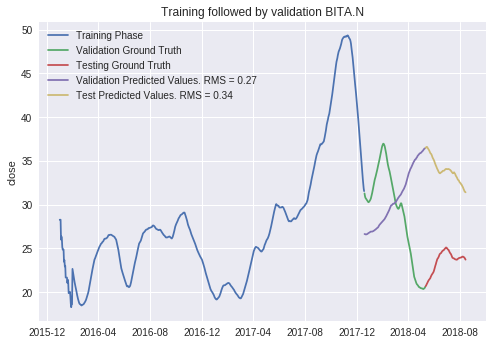

nan_company =====> []
Validation RMS acheived ===>  0.27144651314243656
Test RMS acheived ===>  0.34306149943624525
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 92s - loss: 0.5332
Epoch 2/10
 - 0s - loss: 0.4654
Epoch 3/10
 - 0s - loss: 0.4036
Epoch 4/10
 - 0s - loss: 0.3501
Epoch 5/10
 - 0s - loss: 0.3044
Epoch 6/10
 - 0s - loss: 0.2666
Epoch 7/10
 - 0s - loss: 0.2374
Epoch 8/10
 - 0s - loss: 0.2163
Epoch 9/10
 - 0s - loss: 0.2019
Epoch 10/10
 - 0s - loss: 0.1925
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

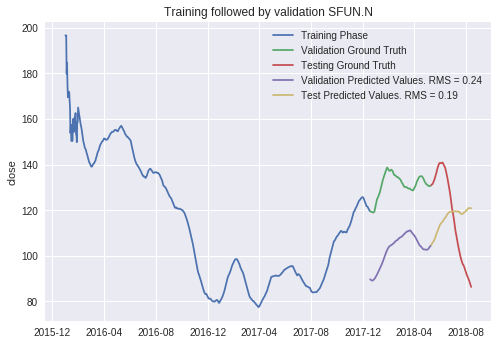

nan_company =====> []
Validation RMS acheived ===>  0.24063451586167772
Test RMS acheived ===>  0.18787683668796717
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 92s - loss: 0.4742
Epoch 2/10
 - 0s - loss: 0.4160
Epoch 3/10
 - 0s - loss: 0.3624
Epoch 4/10
 - 0s - loss: 0.3206
Epoch 5/10
 - 0s - loss: 0.2920
Epoch 6/10
 - 0s - loss: 0.2753
Epoch 7/10
 - 0s - loss: 0.2673
Epoch 8/10
 - 0s - loss: 0.2639
Epoch 9/10
 - 0s - loss: 0.2617
Epoch 10/10
 - 0s - loss: 0.2584
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

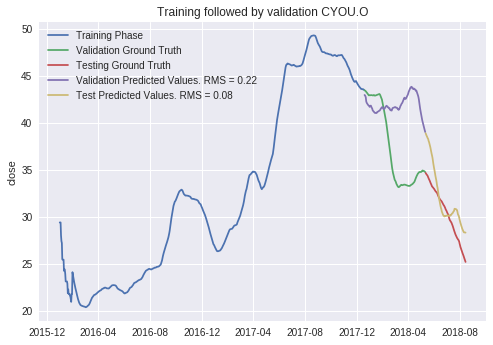

nan_company =====> []
Validation RMS acheived ===>  0.22157386653668945
Test RMS acheived ===>  0.08069094083108364
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 92s - loss: 0.4887
Epoch 2/10
 - 0s - loss: 0.4238
Epoch 3/10
 - 0s - loss: 0.3593
Epoch 4/10
 - 0s - loss: 0.3024
Epoch 5/10
 - 0s - loss: 0.2549
Epoch 6/10
 - 0s - loss: 0.2171
Epoch 7/10
 - 0s - loss: 0.1884
Epoch 8/10
 - 0s - loss: 0.1682
Epoch 9/10
 - 0s - loss: 0.1553
Epoch 10/10
 - 0s - loss: 0.1482
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Tota

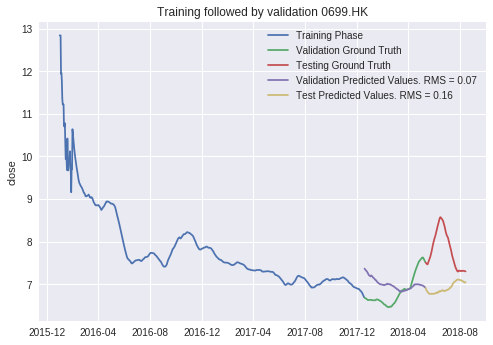

nan_company =====> []
Validation RMS acheived ===>  0.0679317443214162
Test RMS acheived ===>  0.16457177001426054
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 92s - loss: 0.1174
Epoch 2/10
 - 0s - loss: 0.1038
Epoch 3/10
 - 0s - loss: 0.0939
Epoch 4/10
 - 0s - loss: 0.0888
Epoch 5/10
 - 0s - loss: 0.0872
Epoch 6/10
 - 0s - loss: 0.0871
Epoch 7/10
 - 0s - loss: 0.0867
Epoch 8/10
 - 0s - loss: 0.0852
Epoch 9/10
 - 0s - loss: 0.0830
Epoch 10/10
 - 0s - loss: 0.0804
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total par

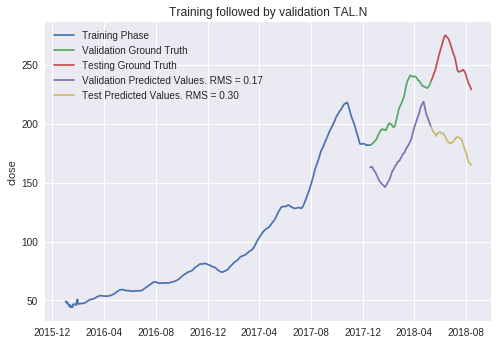

nan_company =====> []
Validation RMS acheived ===>  0.17195160600402393
Test RMS acheived ===>  0.2970076053288418
The train-test accuracy:  0.31669179181527596


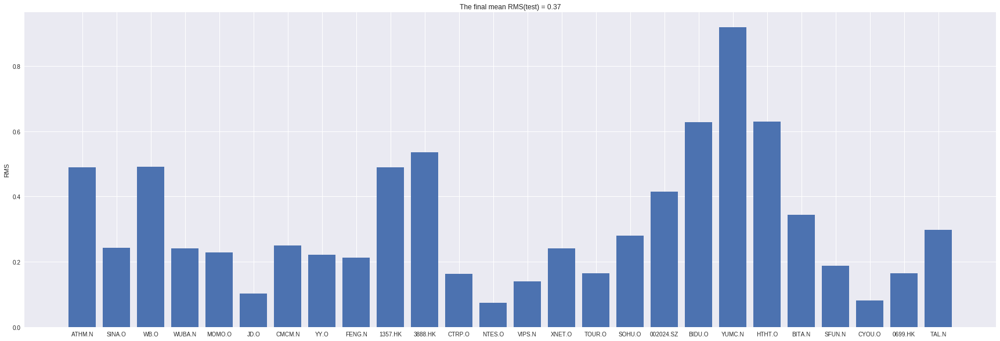

Iter Count======================> 10
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 94s - loss: 0.1709
Epoch 2/10
 - 0s - loss: 0.1521
Epoch 3/10
 - 0s - loss: 0.1354
Epoch 4/10
 - 0s - loss: 0.1230
Epoch 5/10
 - 0s - loss: 0.1154
Epoch 6/10
 - 0s - loss: 0.1116
Epoch 7/10
 - 0s - loss: 0.1105
Epoch 8/10
 - 0s - loss: 0.1103
Epoch 9/10
 - 0s - loss: 0.1096
Epoch 10/10
 - 0s - loss: 0.1077
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
_____________

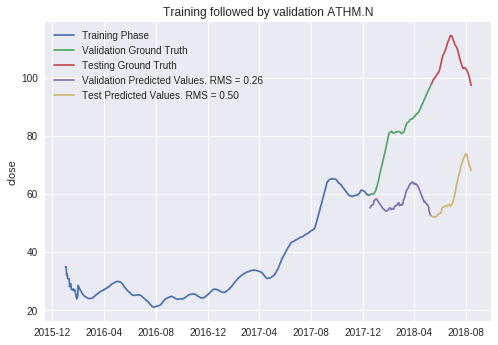

nan_company =====> []
Validation RMS acheived ===>  0.26373197475861554
Test RMS acheived ===>  0.49507796089502293
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 94s - loss: 0.5722
Epoch 2/10
 - 0s - loss: 0.5117
Epoch 3/10
 - 0s - loss: 0.4543
Epoch 4/10
 - 0s - loss: 0.4079
Epoch 5/10
 - 0s - loss: 0.3746
Epoch 6/10
 - 0s - loss: 0.3534
Epoch 7/10
 - 0s - loss: 0.3408
Epoch 8/10
 - 0s - loss: 0.3322
Epoch 9/10
 - 0s - loss: 0.3233
Epoch 10/10
 - 0s - loss: 0.3120
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

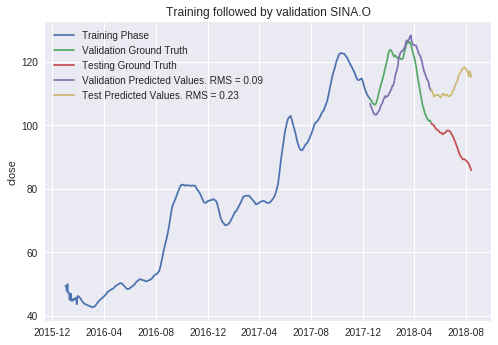

nan_company =====> []
Validation RMS acheived ===>  0.09343247665017025
Test RMS acheived ===>  0.23009659462347998
SELECTED_TICKER WB.O
Selected Ticker  WB.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 94s - loss: 0.1279
Epoch 2/10
 - 0s - loss: 0.1000
Epoch 3/10
 - 0s - loss: 0.0795
Epoch 4/10
 - 0s - loss: 0.0682
Epoch 5/10
 - 0s - loss: 0.0629
Epoch 6/10
 - 0s - loss: 0.0597
Epoch 7/10
 - 0s - loss: 0.0562
Epoch 8/10
 - 0s - loss: 0.0517
Epoch 9/10
 - 0s - loss: 0.0467
Epoch 10/10
 - 0s - loss: 0.0426
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total para

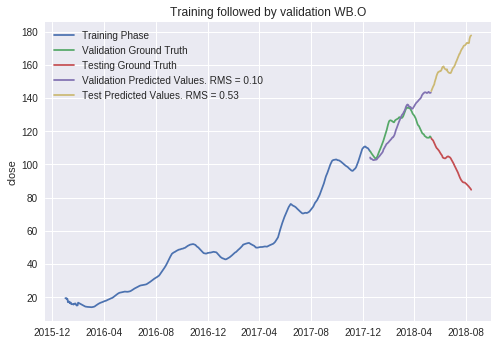

nan_company =====> []
Validation RMS acheived ===>  0.10251034381036292
Test RMS acheived ===>  0.5254674208988621
SELECTED_TICKER WUBA.N
Selected Ticker  WUBA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 94s - loss: 0.7680
Epoch 2/10
 - 0s - loss: 0.5860
Epoch 3/10
 - 0s - loss: 0.4213
Epoch 4/10
 - 0s - loss: 0.2948
Epoch 5/10
 - 0s - loss: 0.2086
Epoch 6/10
 - 0s - loss: 0.1586
Epoch 7/10
 - 0s - loss: 0.1370
Epoch 8/10
 - 0s - loss: 0.1345
Epoch 9/10
 - 0s - loss: 0.1415
Epoch 10/10
 - 0s - loss: 0.1496
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

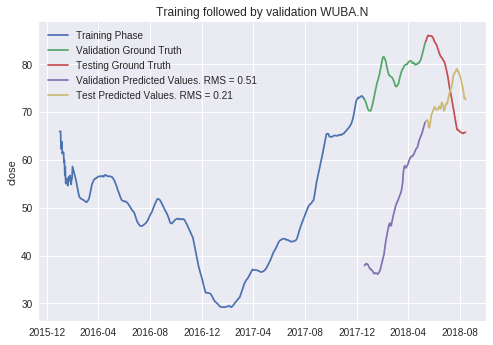

nan_company =====> []
Validation RMS acheived ===>  0.5135110418021526
Test RMS acheived ===>  0.20601639659029666
SELECTED_TICKER MOMO.O
Selected Ticker  MOMO.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 95s - loss: 0.3809
Epoch 2/10
 - 0s - loss: 0.3221
Epoch 3/10
 - 0s - loss: 0.2631
Epoch 4/10
 - 0s - loss: 0.2111
Epoch 5/10
 - 0s - loss: 0.1694
Epoch 6/10
 - 0s - loss: 0.1397
Epoch 7/10
 - 0s - loss: 0.1223
Epoch 8/10
 - 0s - loss: 0.1153
Epoch 9/10
 - 0s - loss: 0.1148
Epoch 10/10
 - 0s - loss: 0.1158
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

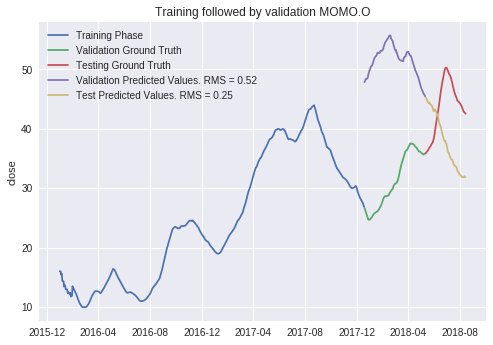

nan_company =====> []
Validation RMS acheived ===>  0.5209367108065249
Test RMS acheived ===>  0.24954992411577517
SELECTED_TICKER JD.O
Selected Ticker  JD.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 97s - loss: 0.2514
Epoch 2/10
 - 0s - loss: 0.2130
Epoch 3/10
 - 0s - loss: 0.1805
Epoch 4/10
 - 0s - loss: 0.1574
Epoch 5/10
 - 0s - loss: 0.1412
Epoch 6/10
 - 0s - loss: 0.1283
Epoch 7/10
 - 0s - loss: 0.1166
Epoch 8/10
 - 0s - loss: 0.1056
Epoch 9/10
 - 0s - loss: 0.0959
Epoch 10/10
 - 0s - loss: 0.0878
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

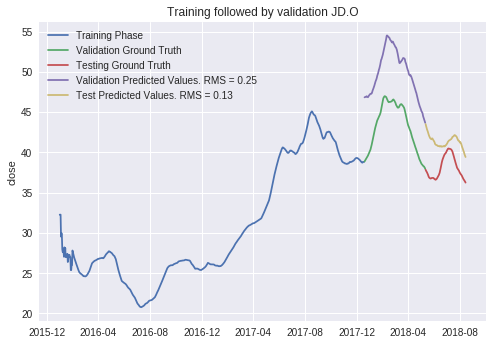

nan_company =====> []
Validation RMS acheived ===>  0.2541669687224565
Test RMS acheived ===>  0.13479557286854071
SELECTED_TICKER CMCM.N
Selected Ticker  CMCM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 96s - loss: 0.8266
Epoch 2/10
 - 0s - loss: 0.6578
Epoch 3/10
 - 0s - loss: 0.5253
Epoch 4/10
 - 0s - loss: 0.4419
Epoch 5/10
 - 0s - loss: 0.3952
Epoch 6/10
 - 0s - loss: 0.3657
Epoch 7/10
 - 0s - loss: 0.3386
Epoch 8/10
 - 0s - loss: 0.3092
Epoch 9/10
 - 0s - loss: 0.2803
Epoch 10/10
 - 0s - loss: 0.2566
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

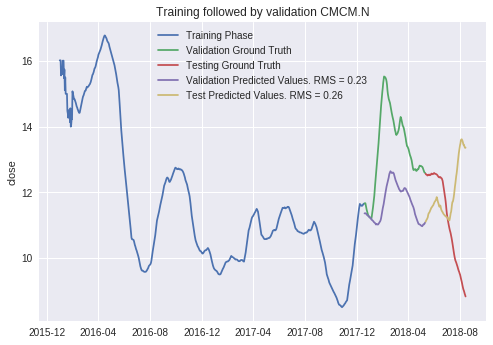

nan_company =====> []
Validation RMS acheived ===>  0.23194955336901915
Test RMS acheived ===>  0.2605249036411846
SELECTED_TICKER YY.O
Selected Ticker  YY.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 96s - loss: 0.1857
Epoch 2/10
 - 0s - loss: 0.1524
Epoch 3/10
 - 0s - loss: 0.1202
Epoch 4/10
 - 0s - loss: 0.0929
Epoch 5/10
 - 0s - loss: 0.0716
Epoch 6/10
 - 0s - loss: 0.0563
Epoch 7/10
 - 0s - loss: 0.0467
Epoch 8/10
 - 0s - loss: 0.0419
Epoch 9/10
 - 0s - loss: 0.0407
Epoch 10/10
 - 0s - loss: 0.0414
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total param

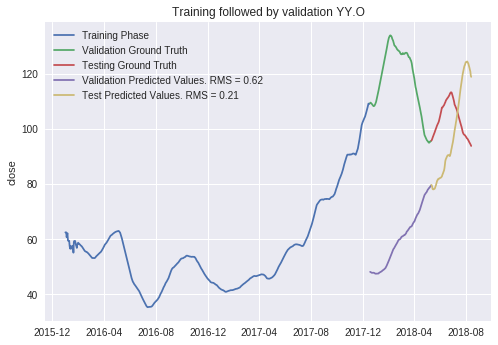

nan_company =====> []
Validation RMS acheived ===>  0.6158364533842369
Test RMS acheived ===>  0.20768488307943794
SELECTED_TICKER FENG.N
Selected Ticker  FENG.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 97s - loss: 0.3491
Epoch 2/10
 - 0s - loss: 0.3084
Epoch 3/10
 - 0s - loss: 0.2708
Epoch 4/10
 - 0s - loss: 0.2394
Epoch 5/10
 - 0s - loss: 0.2143
Epoch 6/10
 - 0s - loss: 0.1951
Epoch 7/10
 - 0s - loss: 0.1809
Epoch 8/10
 - 0s - loss: 0.1707
Epoch 9/10
 - 0s - loss: 0.1635
Epoch 10/10
 - 0s - loss: 0.1585
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

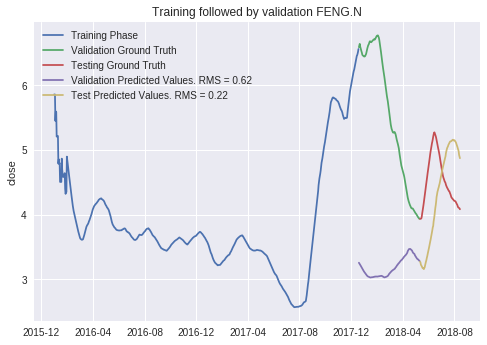

nan_company =====> []
Validation RMS acheived ===>  0.6223672405786804
Test RMS acheived ===>  0.21890511493414377
SELECTED_TICKER 1357.HK
Selected Ticker  1357.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 98s - loss: 1.0434
Epoch 2/10
 - 0s - loss: 0.9619
Epoch 3/10
 - 0s - loss: 0.8773
Epoch 4/10
 - 0s - loss: 0.7978
Epoch 5/10
 - 0s - loss: 0.7255
Epoch 6/10
 - 0s - loss: 0.6610
Epoch 7/10
 - 0s - loss: 0.6039
Epoch 8/10
 - 0s - loss: 0.5540
Epoch 9/10
 - 0s - loss: 0.5106
Epoch 10/10
 - 0s - loss: 0.4733
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

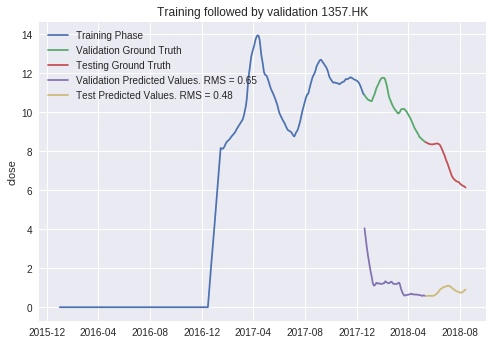

nan_company =====> []
Validation RMS acheived ===>  0.6539716447322222
Test RMS acheived ===>  0.4807234415274359
SELECTED_TICKER 3888.HK
Selected Ticker  3888.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 98s - loss: 0.2665
Epoch 2/10
 - 0s - loss: 0.2415
Epoch 3/10
 - 0s - loss: 0.2196
Epoch 4/10
 - 0s - loss: 0.2036
Epoch 5/10
 - 0s - loss: 0.1923
Epoch 6/10
 - 0s - loss: 0.1837
Epoch 7/10
 - 0s - loss: 0.1760
Epoch 8/10
 - 0s - loss: 0.1694
Epoch 9/10
 - 0s - loss: 0.1644
Epoch 10/10
 - 0s - loss: 0.1613
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

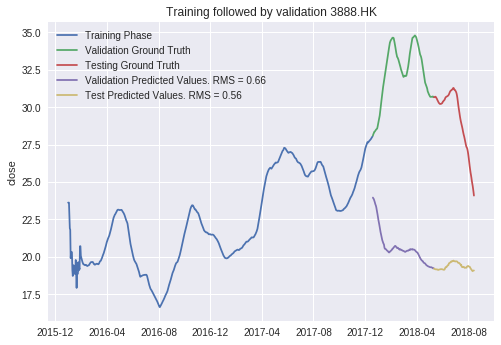

nan_company =====> []
Validation RMS acheived ===>  0.6606735311037539
Test RMS acheived ===>  0.5597417468269281
SELECTED_TICKER CTRP.O
Selected Ticker  CTRP.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 99s - loss: 0.2649
Epoch 2/10
 - 0s - loss: 0.2247
Epoch 3/10
 - 0s - loss: 0.1895
Epoch 4/10
 - 0s - loss: 0.1637
Epoch 5/10
 - 0s - loss: 0.1462
Epoch 6/10
 - 0s - loss: 0.1339
Epoch 7/10
 - 0s - loss: 0.1243
Epoch 8/10
 - 0s - loss: 0.1165
Epoch 9/10
 - 0s - loss: 0.1111
Epoch 10/10
 - 0s - loss: 0.1085
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total pa

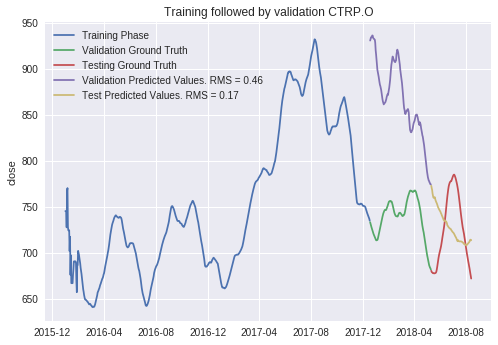

nan_company =====> []
Validation RMS acheived ===>  0.46419242804388233
Test RMS acheived ===>  0.16933483240837013
SELECTED_TICKER NTES.O
Selected Ticker  NTES.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 99s - loss: 0.1745
Epoch 2/10
 - 0s - loss: 0.1494
Epoch 3/10
 - 0s - loss: 0.1287
Epoch 4/10
 - 0s - loss: 0.1130
Epoch 5/10
 - 0s - loss: 0.1009
Epoch 6/10
 - 0s - loss: 0.0917
Epoch 7/10
 - 0s - loss: 0.0849
Epoch 8/10
 - 0s - loss: 0.0800
Epoch 9/10
 - 0s - loss: 0.0762
Epoch 10/10
 - 0s - loss: 0.0726
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

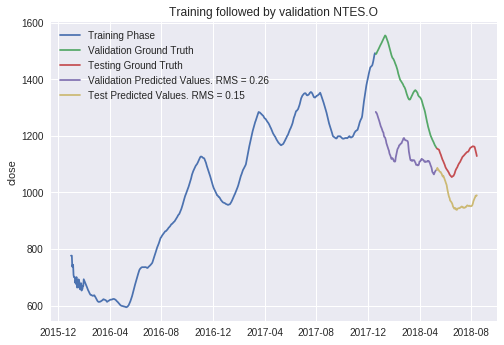

nan_company =====> []
Validation RMS acheived ===>  0.2597326192175332
Test RMS acheived ===>  0.14743568925322617
SELECTED_TICKER VIPS.N
Selected Ticker  VIPS.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 100s - loss: 0.5875
Epoch 2/10
 - 0s - loss: 0.4938
Epoch 3/10
 - 0s - loss: 0.4200
Epoch 4/10
 - 0s - loss: 0.3732
Epoch 5/10
 - 0s - loss: 0.3440
Epoch 6/10
 - 0s - loss: 0.3207
Epoch 7/10
 - 0s - loss: 0.2974
Epoch 8/10
 - 0s - loss: 0.2739
Epoch 9/10
 - 0s - loss: 0.2525
Epoch 10/10
 - 0s - loss: 0.2355
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

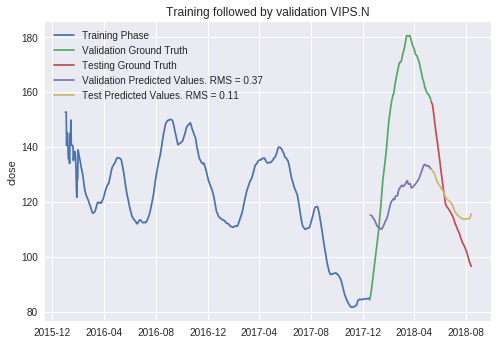

nan_company =====> []
Validation RMS acheived ===>  0.37460692925348094
Test RMS acheived ===>  0.11301174212788938
SELECTED_TICKER XNET.O
Selected Ticker  XNET.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 100s - loss: 0.2451
Epoch 2/10
 - 0s - loss: 0.1858
Epoch 3/10
 - 0s - loss: 0.1293
Epoch 4/10
 - 0s - loss: 0.0841
Epoch 5/10
 - 0s - loss: 0.0533
Epoch 6/10
 - 0s - loss: 0.0379
Epoch 7/10
 - 0s - loss: 0.0364
Epoch 8/10
 - 0s - loss: 0.0441
Epoch 9/10
 - 0s - loss: 0.0538
Epoch 10/10
 - 0s - loss: 0.0595
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

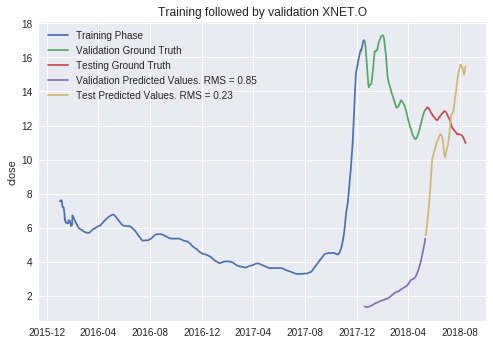

nan_company =====> []
Validation RMS acheived ===>  0.8498526504635967
Test RMS acheived ===>  0.23157100060856428
SELECTED_TICKER TOUR.O
Selected Ticker  TOUR.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 101s - loss: 0.4212
Epoch 2/10
 - 0s - loss: 0.3743
Epoch 3/10
 - 0s - loss: 0.3310
Epoch 4/10
 - 0s - loss: 0.2952
Epoch 5/10
 - 0s - loss: 0.2661
Epoch 6/10
 - 0s - loss: 0.2424
Epoch 7/10
 - 0s - loss: 0.2233
Epoch 8/10
 - 0s - loss: 0.2082
Epoch 9/10
 - 0s - loss: 0.1963
Epoch 10/10
 - 0s - loss: 0.1870
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

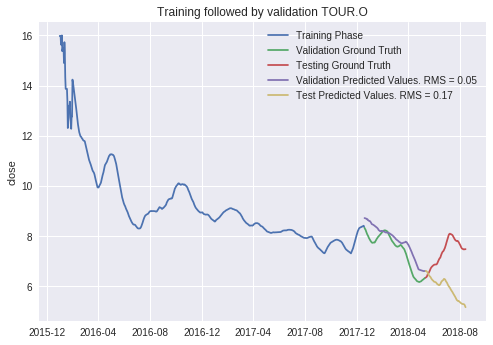

nan_company =====> []
Validation RMS acheived ===>  0.04781885648940029
Test RMS acheived ===>  0.16723545184636465
SELECTED_TICKER SOHU.O
Selected Ticker  SOHU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 101s - loss: 0.4492
Epoch 2/10
 - 0s - loss: 0.3702
Epoch 3/10
 - 0s - loss: 0.2979
Epoch 4/10
 - 0s - loss: 0.2403
Epoch 5/10
 - 0s - loss: 0.1973
Epoch 6/10
 - 0s - loss: 0.1664
Epoch 7/10
 - 0s - loss: 0.1448
Epoch 8/10
 - 0s - loss: 0.1296
Epoch 9/10
 - 0s - loss: 0.1187
Epoch 10/10
 - 0s - loss: 0.1106
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

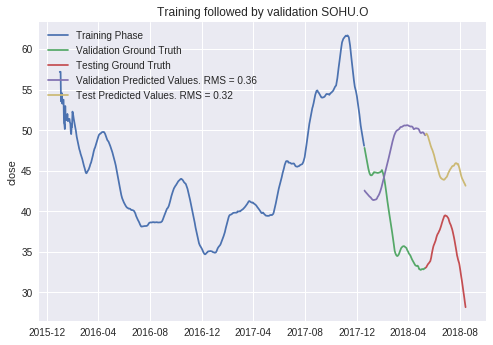

nan_company =====> []
Validation RMS acheived ===>  0.3577937576277875
Test RMS acheived ===>  0.31654227754632835
SELECTED_TICKER 002024.SZ
Selected Ticker  002024.SZ
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 103s - loss: 0.3667
Epoch 2/10
 - 0s - loss: 0.3188
Epoch 3/10
 - 0s - loss: 0.2733
Epoch 4/10
 - 0s - loss: 0.2351
Epoch 5/10
 - 0s - loss: 0.2046
Epoch 6/10
 - 0s - loss: 0.1812
Epoch 7/10
 - 0s - loss: 0.1636
Epoch 8/10
 - 0s - loss: 0.1507
Epoch 9/10
 - 0s - loss: 0.1411
Epoch 10/10
 - 0s - loss: 0.1336
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       


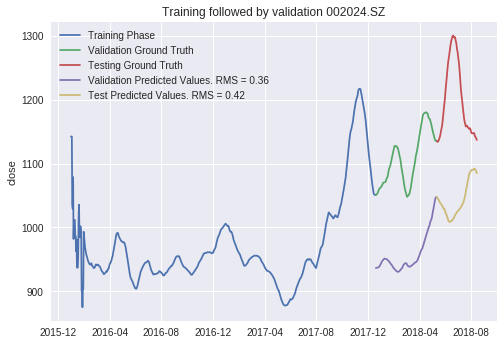

nan_company =====> []
Validation RMS acheived ===>  0.36103899315653193
Test RMS acheived ===>  0.42011112949075025
SELECTED_TICKER BIDU.O
Selected Ticker  BIDU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 103s - loss: 0.1343
Epoch 2/10
 - 0s - loss: 0.1120
Epoch 3/10
 - 0s - loss: 0.0927
Epoch 4/10
 - 0s - loss: 0.0790
Epoch 5/10
 - 0s - loss: 0.0712
Epoch 6/10
 - 0s - loss: 0.0682
Epoch 7/10
 - 0s - loss: 0.0680
Epoch 8/10
 - 0s - loss: 0.0689
Epoch 9/10
 - 0s - loss: 0.0694
Epoch 10/10
 - 0s - loss: 0.0690
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

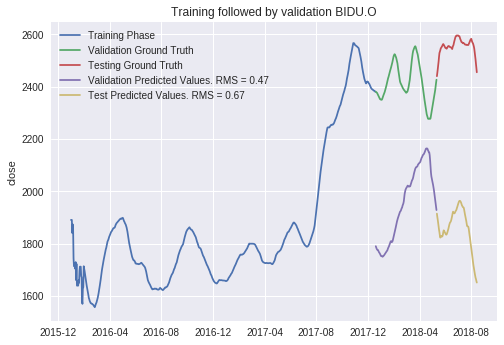

nan_company =====> []
Validation RMS acheived ===>  0.4687492850179237
Test RMS acheived ===>  0.6712669418096224
SELECTED_TICKER YUMC.N
Selected Ticker  YUMC.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 103s - loss: 0.8312
Epoch 2/10
 - 0s - loss: 0.7135
Epoch 3/10
 - 0s - loss: 0.6071
Epoch 4/10
 - 0s - loss: 0.5243
Epoch 5/10
 - 0s - loss: 0.4647
Epoch 6/10
 - 0s - loss: 0.4223
Epoch 7/10
 - 0s - loss: 0.3904
Epoch 8/10
 - 0s - loss: 0.3636
Epoch 9/10
 - 0s - loss: 0.3388
Epoch 10/10
 - 0s - loss: 0.3155
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

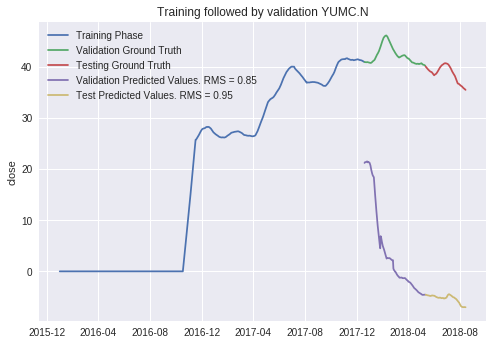

nan_company =====> []
Validation RMS acheived ===>  0.8532995121243638
Test RMS acheived ===>  0.9546966073653131
SELECTED_TICKER HTHT.O
Selected Ticker  HTHT.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 103s - loss: 0.4120
Epoch 2/10
 - 0s - loss: 0.3310
Epoch 3/10
 - 0s - loss: 0.2572
Epoch 4/10
 - 0s - loss: 0.1989
Epoch 5/10
 - 0s - loss: 0.1566
Epoch 6/10
 - 0s - loss: 0.1287
Epoch 7/10
 - 0s - loss: 0.1129
Epoch 8/10
 - 0s - loss: 0.1065
Epoch 9/10
 - 0s - loss: 0.1063
Epoch 10/10
 - 0s - loss: 0.1095
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

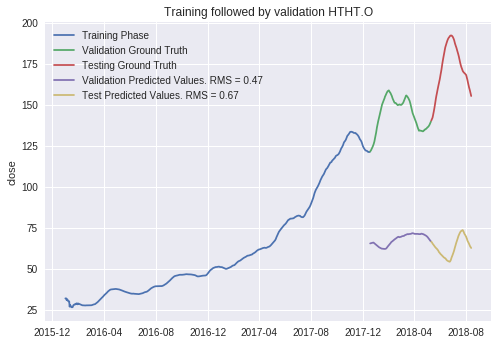

nan_company =====> []
Validation RMS acheived ===>  0.4656678914992686
Test RMS acheived ===>  0.6669676895053829
SELECTED_TICKER BITA.N
Selected Ticker  BITA.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 104s - loss: 0.6220
Epoch 2/10
 - 0s - loss: 0.5487
Epoch 3/10
 - 0s - loss: 0.4765
Epoch 4/10
 - 0s - loss: 0.4129
Epoch 5/10
 - 0s - loss: 0.3588
Epoch 6/10
 - 0s - loss: 0.3135
Epoch 7/10
 - 0s - loss: 0.2760
Epoch 8/10
 - 0s - loss: 0.2448
Epoch 9/10
 - 0s - loss: 0.2188
Epoch 10/10
 - 0s - loss: 0.1967
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

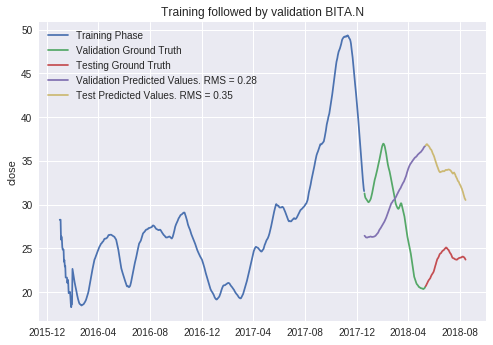

nan_company =====> []
Validation RMS acheived ===>  0.28073929960499144
Test RMS acheived ===>  0.34593031154322895
SELECTED_TICKER SFUN.N
Selected Ticker  SFUN.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 104s - loss: 0.5520
Epoch 2/10
 - 0s - loss: 0.4701
Epoch 3/10
 - 0s - loss: 0.4056
Epoch 4/10
 - 0s - loss: 0.3554
Epoch 5/10
 - 0s - loss: 0.3133
Epoch 6/10
 - 0s - loss: 0.2768
Epoch 7/10
 - 0s - loss: 0.2458
Epoch 8/10
 - 0s - loss: 0.2213
Epoch 9/10
 - 0s - loss: 0.2035
Epoch 10/10
 - 0s - loss: 0.1915
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total

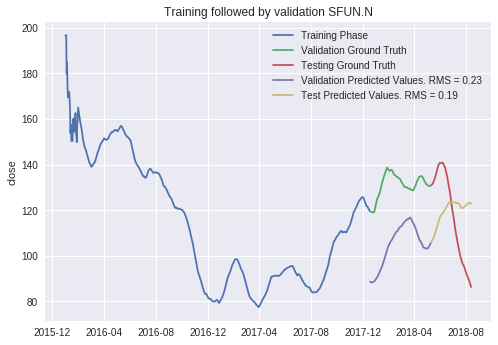

nan_company =====> []
Validation RMS acheived ===>  0.22883065357927268
Test RMS acheived ===>  0.1867711030273503
SELECTED_TICKER CYOU.O
Selected Ticker  CYOU.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 105s - loss: 0.4788
Epoch 2/10
 - 0s - loss: 0.4185
Epoch 3/10
 - 0s - loss: 0.3636
Epoch 4/10
 - 0s - loss: 0.3211
Epoch 5/10
 - 0s - loss: 0.2922
Epoch 6/10
 - 0s - loss: 0.2753
Epoch 7/10
 - 0s - loss: 0.2673
Epoch 8/10
 - 0s - loss: 0.2643
Epoch 9/10
 - 0s - loss: 0.2628
Epoch 10/10
 - 0s - loss: 0.2602
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

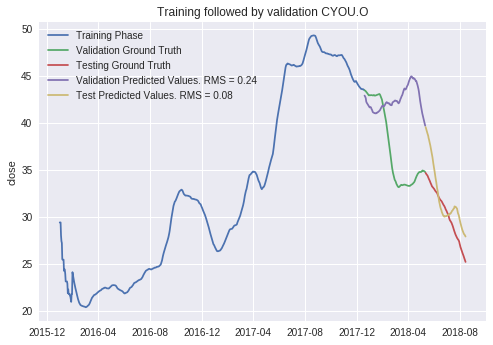

nan_company =====> []
Validation RMS acheived ===>  0.244699148949525
Test RMS acheived ===>  0.0845844791949766
SELECTED_TICKER 0699.HK
Selected Ticker  0699.HK
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 105s - loss: 0.4509
Epoch 2/10
 - 0s - loss: 0.3910
Epoch 3/10
 - 0s - loss: 0.3317
Epoch 4/10
 - 0s - loss: 0.2796
Epoch 5/10
 - 0s - loss: 0.2365
Epoch 6/10
 - 0s - loss: 0.2027
Epoch 7/10
 - 0s - loss: 0.1778
Epoch 8/10
 - 0s - loss: 0.1610
Epoch 9/10
 - 0s - loss: 0.1510
Epoch 10/10
 - 0s - loss: 0.1462
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

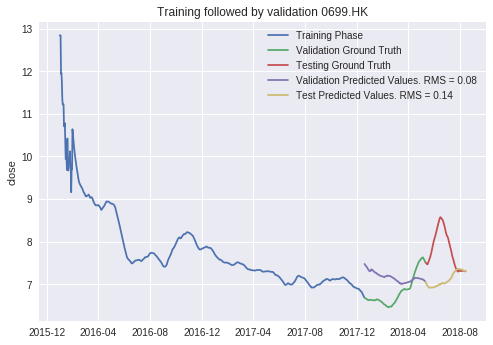

nan_company =====> []
Validation RMS acheived ===>  0.08210617583579924
Test RMS acheived ===>  0.14204107122035237
SELECTED_TICKER TAL.N
Selected Ticker  TAL.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 105s - loss: 0.1163
Epoch 2/10
 - 0s - loss: 0.1016
Epoch 3/10
 - 0s - loss: 0.0916
Epoch 4/10
 - 0s - loss: 0.0873
Epoch 5/10
 - 0s - loss: 0.0866
Epoch 6/10
 - 0s - loss: 0.0867
Epoch 7/10
 - 0s - loss: 0.0858
Epoch 8/10
 - 0s - loss: 0.0836
Epoch 9/10
 - 0s - loss: 0.0809
Epoch 10/10
 - 0s - loss: 0.0782
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total p

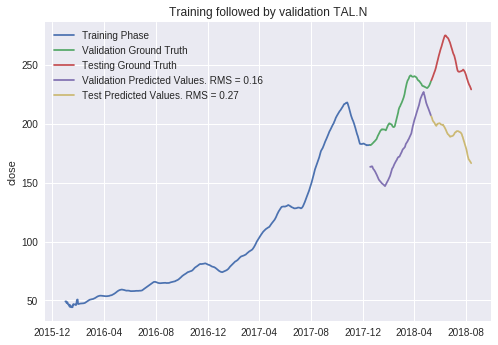

nan_company =====> []
Validation RMS acheived ===>  0.15740150967060548
Test RMS acheived ===>  0.27217749393573165
The train-test accuracy:  0.32531776080325236


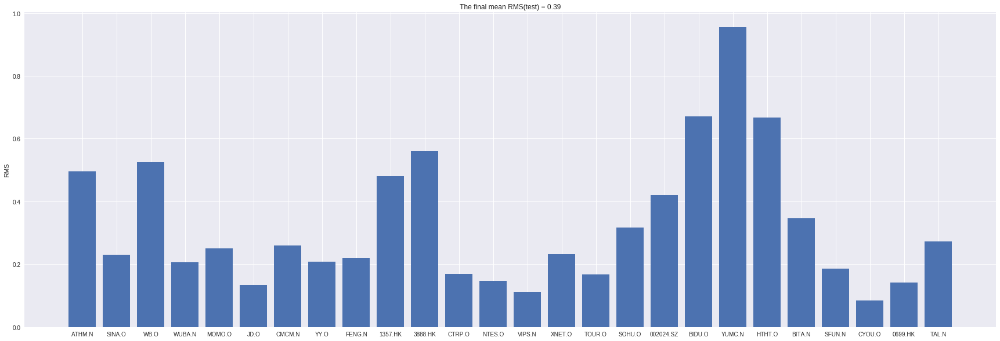

Iter Count======================> 11
SELECTED_TICKER ATHM.N
Selected Ticker  ATHM.N
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 106s - loss: 0.1676
Epoch 2/10
 - 0s - loss: 0.1472
Epoch 3/10
 - 0s - loss: 0.1297
Epoch 4/10
 - 0s - loss: 0.1176
Epoch 5/10
 - 0s - loss: 0.1107
Epoch 6/10
 - 0s - loss: 0.1077
Epoch 7/10
 - 0s - loss: 0.1070
Epoch 8/10
 - 0s - loss: 0.1067
Epoch 9/10
 - 0s - loss: 0.1057
Epoch 10/10
 - 0s - loss: 0.1035
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total params: 118,151
Trainable params: 118,151
Non-trainable params: 0
____________

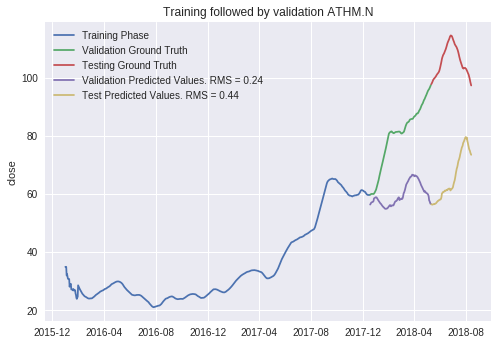

nan_company =====> []
Validation RMS acheived ===>  0.24129647543971947
Test RMS acheived ===>  0.4418309129467702
SELECTED_TICKER SINA.O
Selected Ticker  SINA.O
Valid size  144
Test size  95
This ===> (144,)
Epoch 1/10
 - 107s - loss: 0.6009
Epoch 2/10
 - 0s - loss: 0.5344
Epoch 3/10
 - 0s - loss: 0.4717
Epoch 4/10
 - 0s - loss: 0.4208
Epoch 5/10
 - 0s - loss: 0.3837
Epoch 6/10
 - 0s - loss: 0.3591
Epoch 7/10
 - 0s - loss: 0.3435
Epoch 8/10
 - 0s - loss: 0.3323
Epoch 9/10
 - 0s - loss: 0.3213
Epoch 10/10
 - 0s - loss: 0.3084
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 4, 64)             18432     
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            98816     
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 7)              903       
Total 

In [0]:
get_the_best_model(new_df, 'close')
